In [1]:
import pandas as pd #the csv reading library
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns

from pylab import rcParams
from numpy import diff
from scipy import interpolate
import scipy.stats as stats

from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress
from scipy.signal import savgol_filter

import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols

import matplotlib.gridspec as gridspec
from IPython.display import display, Math

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression

import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols

import matplotlib.gridspec as gridspec
from IPython.display import display, Math
from sklearn.metrics import r2_score

from statistics import mean, median
from pylr2 import regress2

import seawater

from pylr2 import regress2

### PART 2 Bottom Water Maps and colorlation ####

#get WC data sets 
df_doc_wc_surf = df_doc[df_doc['Type'] == 'WC']

codes = df_doc_wc_surf['code'].unique()

df_doc_wc_surf = df_doc_wc_surf[df_doc_wc_surf['code'].isin(codes)]

min_depth_per_code = df_doc_wc_surf.groupby('code')['Depth'].min().reset_index()
df_doc_wc_surf = pd.merge(df_doc_wc_surf, min_depth_per_code, on='code', suffixes=('', '_min'))
df_doc_wc_surf = df_doc_wc_surf[df_doc_wc_surf['Depth'] == df_doc_wc_surf['Depth_min']]
df_doc_wc_surf.drop(columns=['Depth_min'], inplace=True)



#mean_doc = df_doc_wc_plot.groupby('code')['NPOC_uM'].mean().reset_index()
#mean_tn = df_doc_wc_plot.groupby('code')['TN_uM'].mean().reset_index()
#std_doc = df_doc_wc_plot.groupby('code')['NPOC_uM_std'].mesuan().reset_index()
#stc_tn = df_doc_wc_plot.groupby('code')['NPOC_uM_std'].mean().reset_index()

df_doc_wc_surf['Depth_sample'] = df_doc_wc_surf['Depth']
df_doc_wc_surf['Depth'] = 0

# Calculate the mean of "NPOC_uM", "TN_uM", and "Depth" for each group in 'code'
df_doc_wc_surf = df_doc_wc_surf.groupby('code').agg({'NPOC_uM': 'mean', 'TN_uM': 'mean', 'Depth': 'mean', 'NPOC_uM_std': 'sum', 'TN_uM_std': 'sum'}).reset_index()


# Display the result dataframe
df_doc_wc_surf.index = df_doc_wc_surf['code']
df_doc_wc_surf['NPOC_uM_surf'] = df_doc_wc_surf['NPOC_uM']
df_doc_wc_surf

df_doc_wc_plot['NPOC_uM_surf'] = df_doc_wc_surf['NPOC_uM']

df_o2 = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/O2_Summary_Stats.csv', sep=',', index_col=0)

df = df_o2.join(df_doc_wc_plot)

df_doc_wc_plot_2 = df_doc_wc_plot
df_doc_wc_plot_2['NPOC_uM_bottom_water'] = df_doc_wc_plot_2['NPOC_uM']
df_doc_wc_plot_2['TN_uM_bottom_water'] = df_doc_wc_plot_2['TN_uM']
df_doc_wc_plot_2 = df_doc_wc_plot_2.drop(columns=['code', 'NPOC_uM','TN_uM', 'Depth', 'NPOC_uM_std', 'TN_uM_std'])

df.to_csv('../Dissertation_projects/Data/Stats_data_sets/bottom_water_DOC.csv')
df

In [2]:
df_ow = pd.read_csv('../Dissertation_projects/Data/TOC/TOC_GOM.csv', sep=',', index_col=0)
df_ow = df_ow[df_ow['Type'] == 'PW']
df_ow = df_ow[df_ow['Depth'] == 0]
df_ow['code'] = df_ow['Location'] + '_' + df_ow['Campaign']

df_ow.index = df_ow['code']

df_ow = df_ow.drop('St.9_GOM2021', axis=0)
df_ow = df_ow.drop('St.5B_GOM2021', axis=0)
df_ow = df_ow.drop('St.4_GOM2021', axis=0)
df_ow = df_ow.drop('St.14_GOM2021', axis=0)


df_ow['NPOC_ow'] = df_ow['NPOC_uM']

df_ow = df_ow['NPOC_ow']

df_ow

code
St.5B_GOM21FA    481.250000
St.MK_GOM21FA    367.000000
St.7_GOM21FA     408.187500
St.13_GOM21FA    358.875000
St.14_GOM21FA    246.250000
St.9_GOM21FA     375.750000
St.15_GOM21FA    134.473614
St.11_GOM21FA    105.108329
St.2_GOM21FA     303.937500
St.12_GOM21FA     22.047418
St.MK_GOM2021    311.175463
St.11_GOM2021    319.937500
St.7_GOM2021     529.437500
St.2_GOM2021     341.162500
St.16_GOM2021    389.125000
St.5B_GOM22SP    366.562500
St.2_GOM22SP     271.294794
St.13_GOM22SP    241.271506
St.MK_GOM22SP    423.687500
St.4_GOM22SP     360.312500
St.7_GOM22SP     229.970432
St.14_GOM22SP    328.436111
St.16_GOM22SP    524.750000
St.15_GOM22SP    262.767857
St.9_GOM22SP     322.937500
St.4_GOM22SU     368.000000
St.14_GOM22SU    398.062500
St.9_GOM22SU     301.062500
St.15_GOM22SU    282.187500
St.13_GOM22SU    507.375000
St.2_GOM22SU     441.375000
St.12_GOM22SU    507.125000
St.MK_GOM22SU    277.250000
St.16_GOM22SU    483.250000
St.11_GOM22SU    386.312500
St.5B_GOM22SU  

In [3]:
df = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/bottom_water_DOC.csv', sep=',', index_col=0)

df['NPOC_ow'] = df_ow

df

,camp,station,date,Max_pressure,Pressure_dbar_surface,O2_mgL_surface,latitude_surface,longitude_surface,Pressure_dbar_bottom,O2_mgL_bottom,...,Slope_pressure,Slope_pressure_percent,code.2,NPOC_uM,TN_uM,Depth,NPOC_uM_std,TN_uM_std,NPOC_uM_surf,NPOC_ow
code,,,,,,,,,,,,,,,,,,,,,
St.11_GOM2021,GOM2021,St.11,2021-07-25,946.986,2.076,7.3366,28.21678,-89.54664,946.986,7.8471,...,568.175,40.001753,St.11_GOM2021,106.625000,35.994643,-0.5,1.704837,0.723733,104.270833,319.937500
St.13_GOM2021,GOM2021,St.13,2021-07-21,321.519,2.283,6.2980,28.53696,-89.49614,321.519,5.5889,...,303.323,5.659386,St.13_GOM2021,55.552083,24.010714,-0.5,0.731472,2.870188,96.166667,NaN
St.14_GOM2021,GOM2021,St.14,2021-07-19,91.278,1.829,6.3473,28.72514,-89.60390,91.278,4.9078,...,65.016,28.771445,St.14_GOM2021,70.231250,12.898214,-0.5,4.121912,0.955985,96.979167,NaN
St.15_GOM2021,GOM2021,St.15,2021-07-23,287.295,2.191,9.0433,28.94254,-88.83508,287.295,5.4067,...,239.206,16.738544,St.15_GOM2021,63.075000,25.310714,-0.5,0.830528,3.025587,147.333333,NaN
St.16_GOM2021,GOM2021,St.16,2021-07-24,61.804,1.277,7.4623,28.88042,-89.54684,61.804,5.2200,...,49.449,19.990615,St.16_GOM2021,122.979167,16.582143,-0.5,1.619305,1.982193,252.500000,389.125000
St.2_GOM2021,GOM2021,St.2,2021-07-22,63.413,2.074,6.8821,28.89964,-89.59322,63.413,4.7733,...,56.271,11.262675,St.2_GOM2021,81.102083,10.275000,-0.5,1.067897,1.228251,198.770833,341.162500
St.4_GOM2021,GOM2021,St.4,2021-07-17,17.437,1.145,8.2318,28.79886,-90.71040,17.437,2.9017,...,11.138,36.124333,St.4_GOM2021,85.760417,17.526786,-0.5,5.033328,1.299044,111.750000,NaN
St.5B_GOM2021,GOM2021,St.5B,2021-07-16,12.856,1.505,7.6929,28.81030,-91.34152,12.856,7.1658,...,10.106,21.390790,St.5B_GOM2021,113.666667,0.208393,-0.5,6.671161,0.015446,131.250000,NaN
St.7_GOM2021,GOM2021,St.7,2021-07-26,39.529,1.736,9.3420,28.91830,-89.87558,39.529,3.9643,...,31.053,21.442485,St.7_GOM2021,116.520833,20.562500,-0.5,1.863062,0.413444,211.625000,529.437500


In [4]:
lat_top=30
lat_bot=28
lon_left=-91.5
lon_rigth=-88.75
extent=[lon_left, lon_rigth, lat_bot, lat_top]

# set resolution of the features in map: '10m', '50m', or '110m'.  
# If you do this the first time it will take a while downloading the coastline 
# and other features. In the future it will be faster
res = '10m'

def plot_mapbase(extent, ax=None, res='10m', projection=ccrs.PlateCarree()):
    if ax is None:
        fig = plt.figure(figsize=(10,5)) # set fig size
        ax = fig.add_subplot(111, projection=projection)
        
    ax.set_extent(extent)
    ax.coastlines(res)
    ax.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='land',
                                                facecolor='lightgrey', 
                                                scale=res)) 
    ax.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='rivers_lake_centerlines',
                                                edgecolor='blue',
                                                facecolor='none',
                                                scale=res))
    gl = ax.gridlines(xlocs=np.arange(lon_left, lon_rigth+1),
                      ylocs=np.arange(lat_bot, lat_top+1),
                      draw_labels=True, 
                      linewidth=0.5, color='k', linestyle=':')
    gl.top_labels = gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    return ax

def map_O2(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.oxy,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=300,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()
    



In [5]:


def map_doc(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.turbid,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=150,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()
    

def map_doc(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.turbid,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=250,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()

def map_doc_ow(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.turbid,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=500,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()


In [6]:
def map_temp(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.thermal,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=31,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()
    

In [7]:
def map_sal(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.haline,
                                   s=200,
                                   vmin=data_f[topic].min(),  # Set global min and max for colormap
                                   vmax=data_f[topic].max(),
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()
    

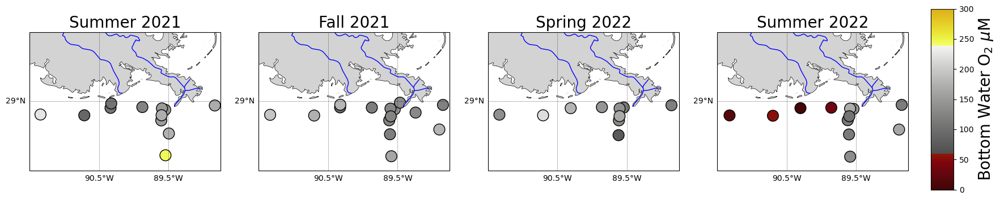

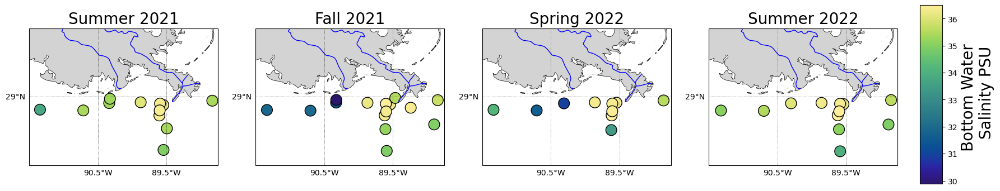

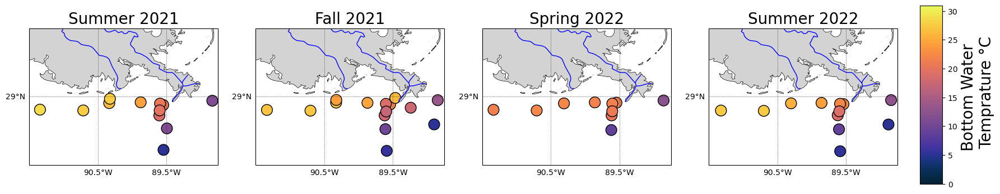

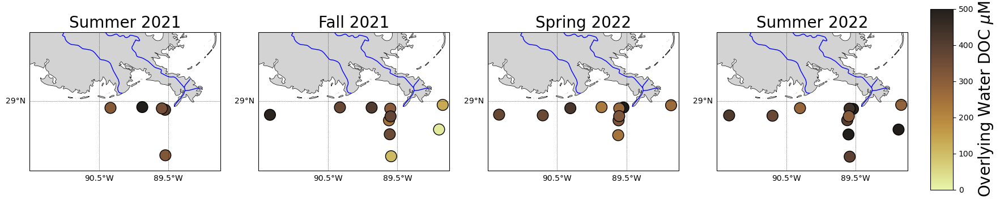

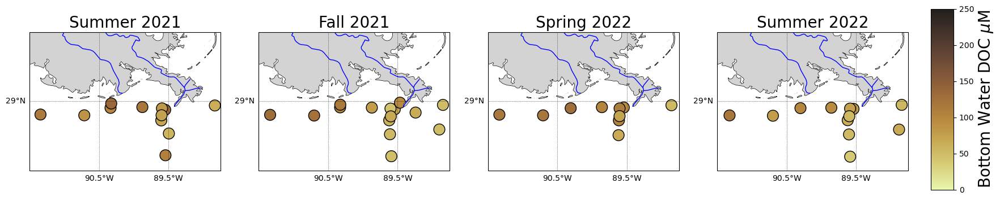

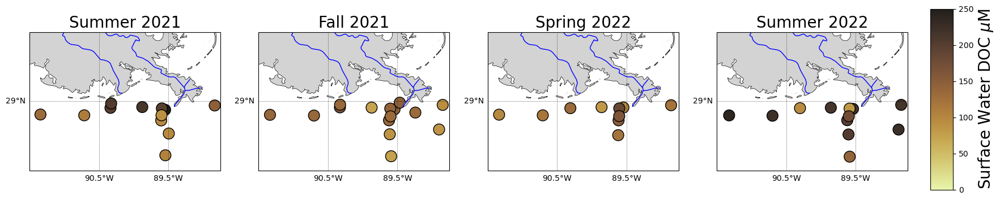

In [8]:
data_f = df
topic = 'O2_uM_bottom'
cb_name = r'Bottom Water O$_2$ $\mu$M'
map_O2(data_f, topic, cb_name)


data_f = df
topic = 'sal_bottom'
cb_name = 'Bottom Water \n Salinity PSU'
map_sal(data_f, topic, cb_name)


data_f = df
topic = 'temp_bottom'
cb_name = 'Bottom Water \n Temprature °C'
map_temp(data_f, topic, cb_name)

data_f = df
topic = 'NPOC_ow'
cb_name = r'Overlying Water DOC $\mu$M'
map_doc_ow(data_f, topic, cb_name)

data_f = df
topic = 'NPOC_uM'
cb_name = r'Bottom Water DOC $\mu$M'
map_doc(data_f, topic, cb_name)

    
data_f = df
topic = 'NPOC_uM_surf'
cb_name = r'Surface Water DOC $\mu$M'
map_doc(data_f, topic, cb_name)

In [9]:
df.columns

Index(['camp', 'station', 'date', 'Max_pressure', 'Pressure_dbar_surface',
       'O2_mgL_surface', 'latitude_surface', 'longitude_surface',
       'Pressure_dbar_bottom', 'O2_mgL_bottom', 'latitude_bottom',
       'longitude_bottom', 'temp_surface', 'temp_bottom', 'sal_surface',
       'sal_bottom', 'O2_uM_surface', 'O2_uM_bottom', 'code.1', 'Slope',
       'Slope_pressure', 'Slope_pressure_percent', 'code.2', 'NPOC_uM',
       'TN_uM', 'Depth', 'NPOC_uM_std', 'TN_uM_std', 'NPOC_uM_surf',
       'NPOC_ow'],
      dtype='object')

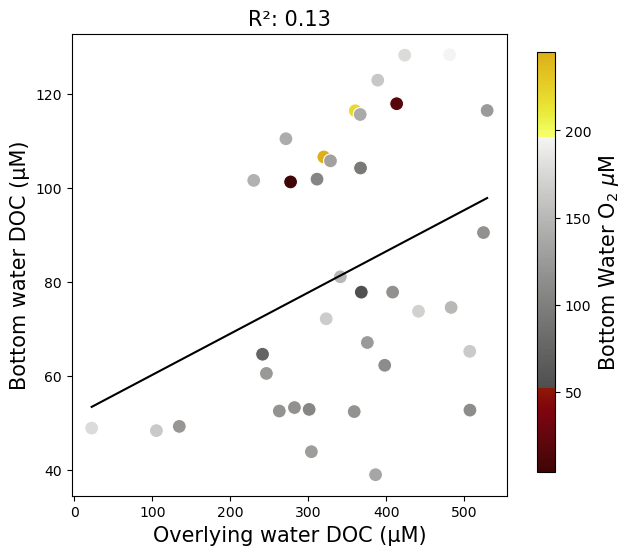

In [10]:
def xyplotcolor(data_f):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = data_f.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

x_var = 'NPOC_ow'
y_var = 'NPOC_uM'

x_var_lab = 'Overlying water DOC (µM)'
y_var_lab = 'Bottom water DOC (µM)'

z_var = 'O2_uM_bottom'
z_var_lab = r'Bottom Water O$_2$ $\mu$M'
z_var_color = cmo.oxy

titel = ""
save_name = 'OW_vs_BW_doc_conc'
xyplotcolor(df)


### PART 3 Allaiis  ####

# Initialize lists to store the data
data_to_save = []

stations = df_doc_wc['Location'].unique()
trips = df_doc_wc['Campaign'].unique()

# Loop through trips and stations
for trip in trips:
    for station in stations:
        subset_df = df_doc_wc[(df_doc_wc['Campaign'] == trip) & (df_doc_wc['Location'] == station)]
        subset_df = subset_df.sort_values(by=['Depth'])
        subset_df_avg = subset_df.groupby('Depth')['NPOC_uM'].mean().reset_index()
        subset_df_avg_sorted = subset_df_avg.sort_values(by='Depth', ascending=False)
        highest_two_depths_df = subset_df_avg_sorted.head(2)

        # Save highest_two_depths_df to the list
        highest_two_depths_list.append(highest_two_depths_df)

        subset_ds = ds[(ds['camp'] == trip) & (ds['station'] == station)]
        subset_ds = subset_ds.sort_values(by=['Pressure [dbar]'])

        # Check if 'Depth' column exists in subset_ds
        if 'Depth' in highest_two_depths_df.columns:
            # Get the two depth values from highest_two_depths_df
            depth_values = highest_two_depths_df['Depth'].values
            closest_pressure_values = []
            for depth in depth_values:
                closest_pressure_values.append(subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - depth).idxmin(), 'Pressure [dbar]'])

            filtered_subset_ds = subset_ds[subset_ds['Pressure [dbar]'].isin(closest_pressure_values)]

            if len(filtered_subset_ds) >= 2:
                # Calculate the difference in NPOC_uM between the two highest depths
                npoc_diff = highest_two_depths_df.iloc[0]['NPOC_uM'] - highest_two_depths_df.iloc[1]['NPOC_uM']

                # Calculate the difference in 'sbeox0Mg/L' between the two closest pressure values
                sbeox_diff = filtered_subset_ds.iloc[0]['sbeox0Mg/L'] - filtered_subset_ds.iloc[1]['sbeox0Mg/L']

                # Store the data to save
                data_to_save.append({
                    'Campaign': trip,
                    'Location': station,
                    'NPOC_uM_Diff': npoc_diff,
                    'sbeox0Mg/L_Diff': sbeox_diff
                })
            else:
                print(f"Not enough data points for trip {trip} and station {station}")

# Create a DataFrame from the data to save
data_to_save_df = pd.DataFrame(data_to_save)

# Save the DataFrame to a CSV file
data_to_save_df


import pandas as pd
import numpy as np

# Initialize an empty list to store the filtered data and highest_two_depths_df
data_to_save = []


stations = df_doc_wc['Location'].unique()
trips = df_doc_wc['Campaign'].unique()

# Loop through trips and stations
for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        subset_df = df_doc_wc[(df_doc_wc['Campaign'] == trip) & (df_doc_wc['Location'] == station)]
        if len(subset_df) >= 2: 
            subset_df = subset_df.sort_values(by=['Depth'])
            subset_df_avg = subset_df.groupby('Depth')['NPOC_uM'].mean().reset_index()
            subset_df_avg_sorted = subset_df_avg.sort_values(by='Depth', ascending=False)
            highest_two_depths_df = subset_df_avg_sorted.head(2)
        
            NPOC_values = highest_two_depths_df['NPOC_uM'].values
            depth_values = highest_two_depths_df['Depth'].values
            
            NPOC_1 = NPOC_values[0]
            NPOC_2 = NPOC_values[1]
        
            NPOC_dep_1 = depth_values[0]
            NPOC_dep_2 = depth_values[1]
        
            npoc_diff = NPOC_1 - NPOC_2

            subset_ds = ds[(ds['camp'] == trip) & (ds['station'] == station)]
            subset_ds = subset_ds.sort_values(by=['Pressure [dbar]'])
        
            closest_pressure_values_1 = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - depth_values[0]).idxmin(), 'Pressure [dbar]']
            closest_pressure_values_2 = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - depth_values[1]).idxmin(), 'Pressure [dbar]']

            closest_pressure_values_1 = closest_pressure_values_1.mean()
            closest_pressure_values_2 = closest_pressure_values_2.mean()
        
            closest_ox_values_1 = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - depth_values[0]).idxmin(), 'ox_uM']
            closest_ox_values_2 = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - depth_values[1]).idxmin(), 'ox_uM']

            closest_ox_values_1 = closest_ox_values_1.mean()
            closest_ox_values_2 = closest_ox_values_2.mean()
        
            sbeox_diff = closest_ox_values_1.mean() - closest_ox_values_2.mean()
        
            data_to_save.append({'Campaign': trip,
                                 'Location': station,
                                 'NPOC_uM_Diff': npoc_diff,
                                 'ox_uM_Diff': sbeox_diff,
                                 'NPOC_uM_upper': NPOC_2,
                                 'NPOC_uM_lower': NPOC_1,
                                 'Depth_doc_upper': NPOC_dep_2,
                                 'Depth_doc_lower': NPOC_dep_1, 
                                 'ox_uM_upper': closest_ox_values_2, 
                                 'ox_uM_lower': closest_ox_values_1, 
                                 'Depth_ctd_upper': closest_pressure_values_2,
                                 'Depth_ctd_lower': closest_pressure_values_1
                                })
        else: 
            print(f'fail to run {trip} {station}')
# Create a DataFrame from the data to save
data_to_save_df = pd.DataFrame(data_to_save)
        

data_to_save_df['Depth_doc_diff'] = data_to_save_df['Depth_doc_lower'] - data_to_save_df['Depth_doc_upper']
data_to_save_df['Depth_ctd_diff'] = data_to_save_df['Depth_ctd_lower'] - data_to_save_df['Depth_ctd_upper']

data_to_save_df['O2_change_per_meter'] = data_to_save_df['ox_uM_Diff'] / data_to_save_df['Depth_ctd_diff']
data_to_save_df['DOC_change_per_meter'] = data_to_save_df['NPOC_uM_Diff'] / data_to_save_df['Depth_doc_diff']
data_to_save_df['Depth_ctd_lower_log'] = np.log(data_to_save_df['Depth_ctd_lower'] )


data_bottom_water = data_to_save_df
data_bottom_water['code'] = data_bottom_water['Location'] + '_' + data_bottom_water['Campaign']

data_bottom_water.to_csv('../Dissertation_projects/Data/Stats_data_sets/data_bottom_water.csv')


In [11]:
data_bottom_water = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/data_bottom_water.csv')
data_bottom_water

,Unnamed: 0,Campaign,Location,NPOC_uM_Diff,ox_uM_Diff,NPOC_uM_upper,NPOC_uM_lower,Depth_doc_upper,Depth_doc_lower,ox_uM_upper,ox_uM_lower,Depth_ctd_upper,Depth_ctd_lower,Depth_doc_diff,Depth_ctd_diff,O2_change_per_meter,DOC_change_per_meter,Depth_ctd_lower_log,code
0,0,GOM2021,St.MK,-20.062500,-110.3552,121.958333,101.895833,14.00,16.7,215.5360,105.1808,13.995,16.692,2.70,2.697,-40.917760,-7.430556,2.814930,St.MK_GOM2021
1,1,GOM2021,St.5B,-2.437500,-17.5648,116.104167,113.666667,11.30,12.5,245.7440,228.1792,11.275,12.500,1.20,1.225,-14.338612,-2.031250,2.525729,St.5B_GOM2021
2,2,GOM2021,St.4,-5.239583,-61.0432,91.000000,85.760417,15.20,16.7,166.9120,105.8688,15.208,16.695,1.50,1.487,-41.051244,-3.493056,2.815109,St.4_GOM2021
3,3,GOM2021,St.14,-6.929167,-8.7040,77.160417,70.231250,87.00,89.9,181.9936,173.2896,87.011,89.886,2.90,2.875,-3.027478,-2.389368,4.498542,St.14_GOM2021
4,4,GOM2021,St.9,-0.237500,-7.6192,73.912500,73.675000,73.00,77.8,184.7200,177.1008,73.026,77.800,4.80,4.774,-1.595978,-0.049479,4.354141,St.9_GOM2021
5,5,GOM2021,St.13,-2.135417,0.5568,57.687500,55.552083,276.00,322.0,178.2880,178.8448,275.983,321.519,46.00,45.536,0.012228,-0.046422,5.773057,St.13_GOM2021
6,6,GOM2021,St.2,-4.981250,-45.0976,86.083333,81.102083,55.20,62.2,206.8800,161.7824,55.152,62.185,7.00,7.033,-6.412285,-0.711607,4.130114,St.2_GOM2021
7,7,GOM2021,St.15,0.297917,-0.6400,62.777083,63.075000,279.00,285.0,174.0512,173.4112,278.980,284.991,6.00,6.011,-0.106471,0.049653,5.652458,St.15_GOM2021
8,8,GOM2021,St.16,-14.291667,-10.1632,137.270833,122.979167,57.00,61.5,180.8480,170.6848,56.959,61.486,4.50,4.527,-2.245019,-3.175926,4.118810,St.16_GOM2021
9,9,GOM2021,St.11,-10.333333,54.0608,116.958333,106.625000,621.00,946.0,196.6240,250.6848,621.025,946.000,325.00,324.975,0.166354,-0.031795,6.852243,St.11_GOM2021


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\3011763413.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(inplace=True)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\3011763413.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(inplace=True)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\3011763413.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(inplace=True)
C:\Users\hmlbr\AppD

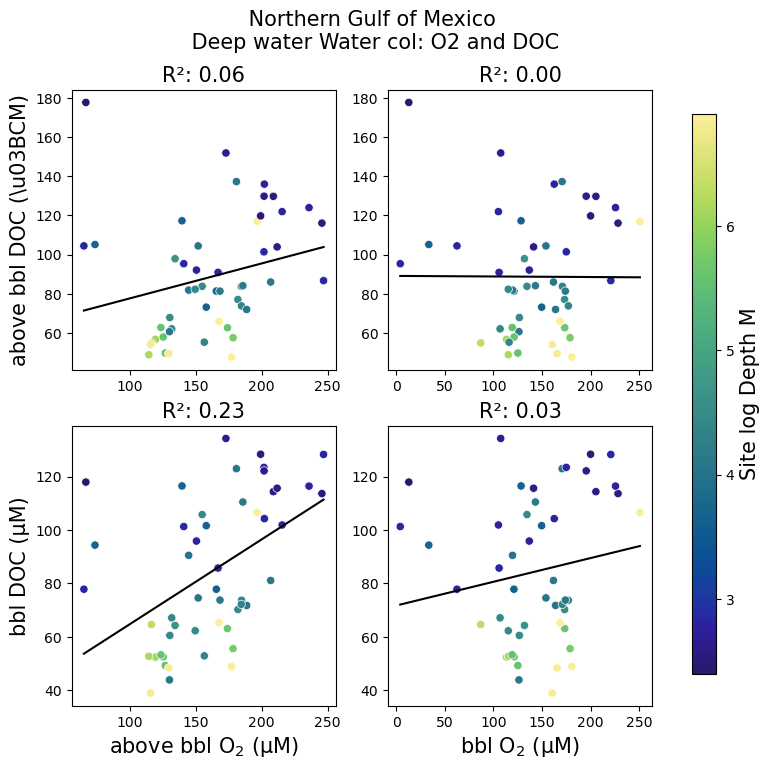

In [12]:
def cor_plot_stn_sum_2(data_frame, title):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
    
    # Set up the color bar limits
    vmin = data_frame['Depth_ctd_lower_log'].min()
    vmax = data_frame['Depth_ctd_lower_log'].max()

    # Loop through the subplots
    for i, x_var in enumerate(['ox_uM_upper', 'ox_uM_lower']):
        for j, y_var in enumerate(['NPOC_uM_upper', 'NPOC_uM_lower']):
            # Prepare the data for the subplot
            data = data_frame[[x_var, y_var, 'Depth_ctd_lower_log']]
            data.dropna(inplace=True)
            X = data[[x_var]]
            y = data[y_var]
            colors = data['Depth_ctd_lower_log'].astype(float)

            # Fit a linear regression model to the data
            model = LinearRegression()
            model.fit(X, y)
            score = model.score(X, y)

            # Plot the data and regression line
            ax = axes[j, i]
            sns.scatterplot(x=x_var, y=y_var, data=data, ax=ax, c=colors, cmap=cmo.haline, vmin=vmin, vmax=vmax, legend=False)
            sns.lineplot(x=X[x_var], y=model.predict(X), ax=ax, color='black')

            # Set the axis labels and title
            if j == 1:
                ax.set_xlabel(x_var.replace('ox_uM_lower', 'bbl O$_2$ (\u03BCM)').replace('ox_uM_upper', 'above bbl O$_2$ (\u03BCM)').replace('FeT_uM', 'Fe Total (\u03BCM)').replace('NPOC_uM', 'DOC (\u03BCM)').replace('TN_uM', 'dissolved N (\u03BCM)'), size=15)
            else: 
                ax.set_xlabel("")
            if i == 0:
                ax.set_ylabel(y_var.replace('NPOC_uM_lower', 'bbl DOC (\u03BCM)').replace('NPOC_uM_upper', r'above bbl DOC (\u03BCM)'), size = 15)
            else: 
                ax.set_ylabel("")
            ax.set_title(f'R\u00B2: {score:.2f}', size = 15)
            #ax.set_ylim([data[y_var].max(), data[y_var].max()])
            #ax.set_xlim([data[x_var].min(), data[x_var].max()])

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.haline, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel('Site log Depth M', size = 15)
        
    # Adjust the layout of the subplots
    fig.suptitle(title, size = 15)
    fig.set_facecolor('w')
    #plt.tight_layout()
    plt.show()

cor_plot_stn_sum_2(data_bottom_water, f' Northern Gulf of Mexico \n Deep water Water col: O2 and DOC')



# Part 4 water column figues 

import pandas as pd
import numpy as np

# Initialize an empty list to store the filtered data and highest_two_depths_df
data_save = []


stations = df_doc_wc['Location'].unique()
trips = df_doc_wc['Campaign'].unique()

# Loop through trips and stations
for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        subset_df = df_doc_wc[(df_doc_wc['Campaign'] == trip) & (df_doc_wc['Location'] == station)]
        if len(subset_df) >= 2: 
            subset_df = subset_df.sort_values(by=['Depth'])
            subset_df_avg = subset_df.groupby('Depth')['NPOC_uM'].mean().reset_index()
            subset_df_avg_sorted = subset_df_avg.sort_values(by='Depth', ascending=False)
            depths_df = subset_df_avg_sorted
        
            NPOC_values = depths_df['NPOC_uM'].values
            depth_values = depths_df['Depth'].values
            
            subset_ds = ds[(ds['camp'] == trip) & (ds['station'] == station)]
            subset_ds = subset_ds.sort_values(by=['Pressure [dbar]'])
            

            subset_ds = ds[(ds['camp'] == trip) & (ds['station'] == station)]
            subset_ds = subset_ds.sort_values(by=['Pressure [dbar]'])
        
            val_save = []
            for val in depth_values: 
                closest_pressure_value = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - val).idxmin(), 'Pressure [dbar]']
                closest_ox_value = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - val).idxmin(), 'ox_uM']
                closest_temp_value = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - val).idxmin(), 't068C']
                closest_sal_value = subset_ds.loc[np.abs(subset_ds['Pressure [dbar]'] - val).idxmin(), 'sal00']
                
                val_save.append({'Press': closest_pressure_value.mean(),
                                 'ox': closest_ox_value.mean(),
                                 'temp': closest_temp_value.mean(),
                                 'sal': closest_sal_value.mean()})
                
            val_save_df = pd.DataFrame(val_save)
            val_save_df['NPOC_uM'] = NPOC_values
            val_save_df['Depth'] = depth_values
            val_save_df['Campaign'] = trip
            val_save_df['Location'] = station
            
            data_save.append(val_save_df)
        else: 
            print(f'fail to run {trip} {station}')
            
# Create a DataFrame from the data to save
data_save = pd.concat(data_save, ignore_index=True)
        
data_save

data_wc = data_save

data_wc['Ts'] = (298.15 - data_wc['temp']) / (273.15 + data_wc['temp'])
data_wc['Ts'] = np.log(data_wc['Ts'] ) 


data_wc['density_kg_m3'] = seawater.dens(data_wc['sal'], data_wc['temp'], data_wc['Press'])  # density at specified pressure (in kg/m^3)
data_wc['density_kg_l'] = data_wc['density_kg_m3'] / 1000

data_wc['ox_umol_kg'] = data_wc['ox'] / data_wc['density_kg_l']

con1 = 5.80871
con2 = 3.20291
con3 = 4.17887 
con4 = 5.10006 
con5 = 9.86643e-2
con6 = 3.80369 

cof1 = -7.01577e-3
cof2 = -7.70028e-3
cof3 = -1.13864e-2
cof4 = -9.51519e-3
cof5 = -2.75915e-7

#as per book 
data_wc['ox_sat'] = con1+data_wc['Ts']*con2+(data_wc['Ts']**2)*con3+(data_wc['Ts']**3)*con4+(data_wc['Ts']**4)*con5+(data_wc['Ts']**5)*con6
data_wc['ox_sat'] = data_wc['ox_sat'] + data_wc['sal']*(cof1 + cof2*data_wc['Ts'] + cof3*data_wc['Ts']**2 + cof4*data_wc['Ts']**3 + cof5*data_wc['sal']**2)
data_wc['ox_sat'] = np.exp(data_wc['ox_sat'])

data_wc['aou'] = data_wc['ox_sat'] - data_wc['ox_umol_kg'] 

data_wc['group'] = "water_col"

# Define a function to assign group
def assign_group(df):
    max_depth_index = df['Depth'].idxmax()
    df.loc[df['Depth'] <= 5, 'group'] = 'Surface'
    df.loc[max_depth_index, 'group'] = 'BBL'
    return df

data_wc['aou-ceq'] = data_wc['aou'] * 0.72

data_wc['code'] = data_wc['Location'] + '_' + data_wc['Campaign']

data_wc.index = data_wc['code'] 

# Read Iron stocks data
fe_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/Iron_stocks.csv', sep=',', index_col=0)
fe_stocks_join = fe_stocks['fet_mol_per_m3_0_to_5cm']
data_wc['fet_mol_per_m3_0_to_5cm'] = fe_stocks_join
fe_stocks_join = fe_stocks['fe2_mol_per_m3_0_to_5cm']
data_wc['fe2_mol_per_m3_0_to_5cm'] = fe_stocks_join
fe_stocks_join = fe_stocks['fe3_mol_per_m3_0_to_5cm']
data_wc['fe3_mol_per_m3_0_to_5cm'] = fe_stocks_join
fe_stocks_join = fe_stocks['fet_mol_per_m3_0_to_25cm']
data_wc['fet_mol_per_m3_0_to_25cm'] = fe_stocks_join
fe_stocks_join = fe_stocks['fe2_mol_per_m3_0_to_25cm']
data_wc['fe2_mol_per_m3_0_to_25cm'] = fe_stocks_join
fe_stocks_join = fe_stocks['fe3_mol_per_m3_0_to_25cm']
data_wc['fe3_mol_per_m3_0_to_25cm'] = fe_stocks_join

# Read DOC stocks data
doc_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/DOC_stocks.csv', sep=',', index_col=0)
doc_stocks_join = doc_stocks['doc_mol_per_m3_0_to_25cm']
data_wc['doc_mol_per_m3_0_to_25cm'] = doc_stocks_join
doc_stocks_join = doc_stocks['doc_mol_per_m3_0_to_5cm']
data_wc['doc_mol_per_m3_0_to_5cm'] = doc_stocks_join

# Read NCS stocks data
ncs_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/NCS_stocks.csv', sep=',', index_col=0)
ncs_stocks['OC_mol_per_m3_0_to_5cm'] = ncs_stocks['OCg_5cm_deep/M2'] * 12
ncs_stocks_join = ncs_stocks['OC_mol_per_m3_0_to_5cm']
data_wc['OC_mol_per_m3_0_to_5cm'] = ncs_stocks_join

flux_doc_pw = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_doc_pw.csv', sep=',', index_col=0)
flux_doc_pw_join = flux_doc_pw['pw_flux_doc']
data_wc['pw_flux_doc'] = flux_doc_pw_join


n = 0.29
data_wc['Cox'] = (data_wc['pw_flux_doc'] / 0.36) 
data_wc['Cox'] = data_wc['Cox'].apply(lambda x: x ** (1/n))

data_wc['percent_doc_resp'] = (data_wc['NPOC_uM'] / data_wc['aou']*0.72) * 100

data_wc['ratio_flux_2_stock'] = data_wc['pw_flux_doc'] / data_wc['doc_mol_per_m3_0_to_5cm']
data_wc['ratio_pw_flux_doc_2_cox'] = data_wc['pw_flux_doc'] / data_wc['Cox']

data_wc['ratio_doc_2_fet'] = data_wc['doc_mol_per_m3_0_to_5cm'] / data_wc['fet_mol_per_m3_0_to_25cm']
data_wc['ratio_oc_2_fet'] = data_wc['OC_mol_per_m3_0_to_5cm'] / data_wc['fet_mol_per_m3_0_to_5cm']



data_wc.to_csv('../Dissertation_projects/Data/Stats_data_sets/data_wc.csv')


data_wc = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/data_wc.csv')
data_wc['pw_flux_doc'].max()

In [13]:

data_wc = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/data_wc.csv')

data_wc.loc[data_wc['pw_flux_doc'] > 25, 'pw_flux_doc'] = np.nan
data_wc['ratio_flux_2_stock'] = data_wc['pw_flux_doc'] / data_wc['doc_mol_per_m3_0_to_5cm']

n = 0.29
data_wc['Cox'] = data_wc['pw_flux_doc'] / 0.36
data_wc['Cox'] = data_wc['Cox'] ** (1/n)

data_wc['ratio_pw_flux_doc_2_cox'] = data_wc['pw_flux_doc'] / data_wc['Cox']

data_wc['ratio_doc_2_fet'] = data_wc['doc_mol_per_m3_0_to_5cm'] / data_wc['fet_mol_per_m3_0_to_25cm']
data_wc['ratio_oc_2_fet'] = data_wc['OC_mol_per_m3_0_to_5cm'] / data_wc['fet_mol_per_m3_0_to_5cm']


data_wc['group'] == "water_col"
data_wc['group']


# Define a function to assign group
def assign_group(df):
    max_depth_index = df['Depth'].idxmax()
    df.loc[df['Depth'] <= 5, 'group'] = 'Surface'
    df.loc[max_depth_index, 'group'] = 'BBL'
    return df

# Apply the function within groups
data_wc = data_wc.groupby(['Campaign', 'Location']).apply(assign_group).reset_index(drop=True)


data_wc['group'].unique()

data_wc_all = data_wc


df_note = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/Station_summary.csv',sep=',', index_col=0)
df_note['Date'] = pd.to_datetime(df_note['date'])
note_join = df_note['rgn']


data_wc_all['code'] = data_wc_all['Location'] + '_' + data_wc_all['Campaign']
data_wc_all.index = data_wc_all['code']
data_wc_all['rgn'] = note_join

data_wc_bbl = data_wc_all[data_wc_all['group'] == "BBL"]
data_wc_surf = data_wc_all[data_wc_all['group'] == "Surface"]
data_wc = data_wc_all[data_wc_all['group'] == "water_col"]

data_wc_hsal = data_wc[data_wc['sal'] >= 33]
data_wc_lsal = data_wc[data_wc['sal'] <= 33]

data_bbl_hsal = data_wc_bbl[data_wc_bbl['sal'] >= 33]
data_bbl_lsal = data_wc_bbl[data_wc_bbl['sal'] <= 33]

data_wc_all.columns

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\2837250875.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_wc = data_wc.groupby(['Campaign', 'Location']).apply(assign_group).reset_index(drop=True)


Index(['code', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth', 'Campaign',
       'Location', 'Ts', 'density_kg_m3', 'density_kg_l', 'ox_umol_kg',
       'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'rgn'],
      dtype='object')

In [14]:
def xyplotcolor(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    

In [15]:
print(data_wc_bbl['NPOC_uM'].min())
print(data_wc_bbl['NPOC_uM'].max())



38.94583333
134.3125



    
x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'temp'
z_var_lab = 'Temp °C'
z_var_color = cmo.thermal

titel = ""
save_name = 'aou_temp_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'aou_temp_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'aou_temp_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'aou_temp_bbl'
xyplotcolor(data_wc_bbl)


x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = ""
save_name = 'aou_sal_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'aou_sal_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'aou_sal_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'aou_sal_bbl'
xyplotcolor(data_wc_bbl)

x_var = 'ox'
y_var = 'NPOC_uM'

x_var_lab = 'O$_2$ (µM)'
y_var_lab = 'DOC (µM)'


z_var = 'temp'
z_var_lab = 'Temp °C' 
z_var_color = cmo.thermal

titel = ""
save_name = 'ox_temp_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'ox_temp_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'ox_temp_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'ox_temp_bbl'
xyplotcolor(data_wc_bbl)

x_var = 'ox'
y_var = 'NPOC_uM'

x_var_lab = 'O$_2$ (µM)'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = ""
save_name = 'ox_sal_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'ox_sal_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'ox_sal_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'ox_sal_bbl'
xyplotcolor(data_wc_bbl)

In [58]:
import numpy as np

def tls_regression(x, y):
    # Add a column of ones to x to represent the intercept
    X = np.column_stack((np.ones(len(x)), x))

    # Compute the SVD of X
    U, s, Vt = np.linalg.svd(X, full_matrices=False)

    # Compute the pseudo-inverse of X
    X_inv = np.dot(Vt.T / s, U.T)

    # Compute the TLS regression coefficients
    beta_tls = np.dot(X_inv, y)

    return beta_tls

# Assuming you have your data x_var and y_var
x_var = data_wc_hsal['aou-ceq']
y_var = data_wc_hsal['NPOC_uM']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls
print("Intercept (TLS):", intercept_tls)
print("Slope (TLS):", slope_tls)

from pylr2 import regress2
results = regress2(x_var, y_var, _method_type_2="reduced major axis")

results


Intercept (TLS): 93.0129260875483
Slope (TLS): -0.3187706930311297


{'slope': -0.5789549566770666,
 'intercept': 103.40847359968495,
 'r': -0.5505967076622436,
 'std_slope': 0.046723821483449064,
 'std_intercept': 2.6233692637723576,
 'predict': code
 St.11_GOM2021     62.511033
 St.11_GOM2021     84.333525
 St.11_GOM2021    114.446504
 St.13_GOM2021     67.756233
 St.13_GOM2021    112.602026
                     ...    
 St.9_GOM22SU      60.519121
 St.9_GOM22SU     104.778597
 St.9_GOM22SU      84.409279
 St.9_GOM22SU     102.745242
 St.MK_GOM22SU     79.329669
 Name: aou-ceq, Length: 140, dtype: float64}

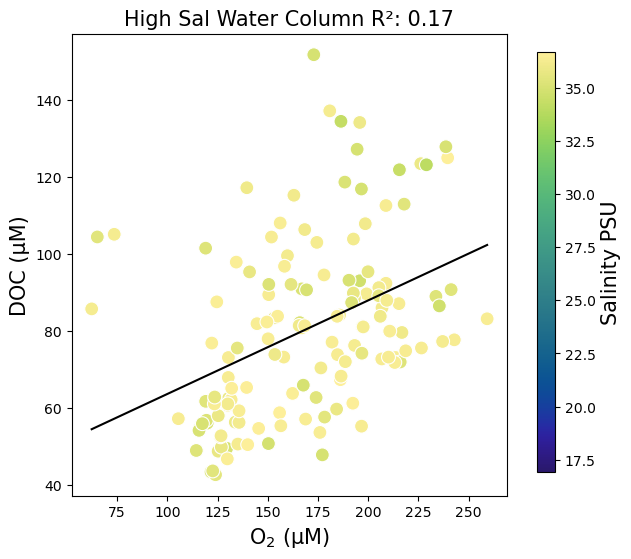

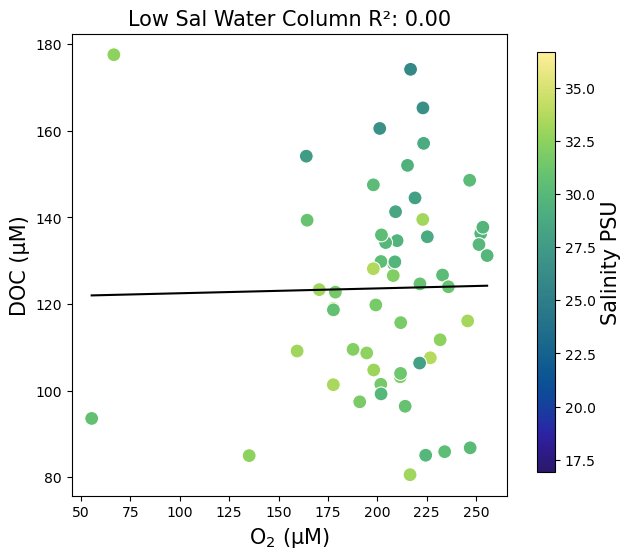

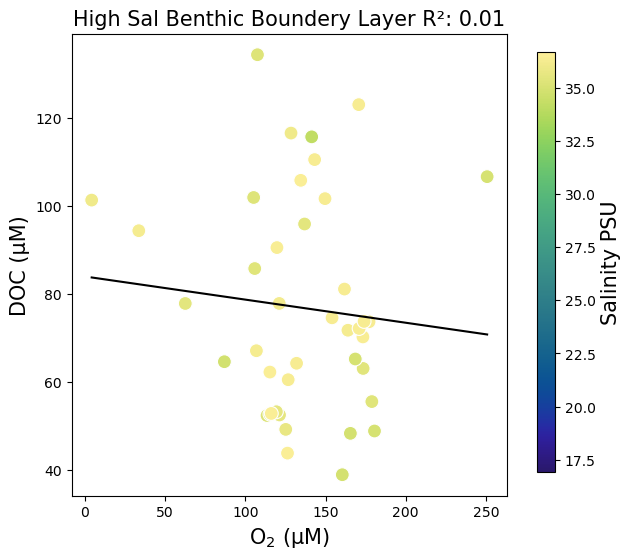

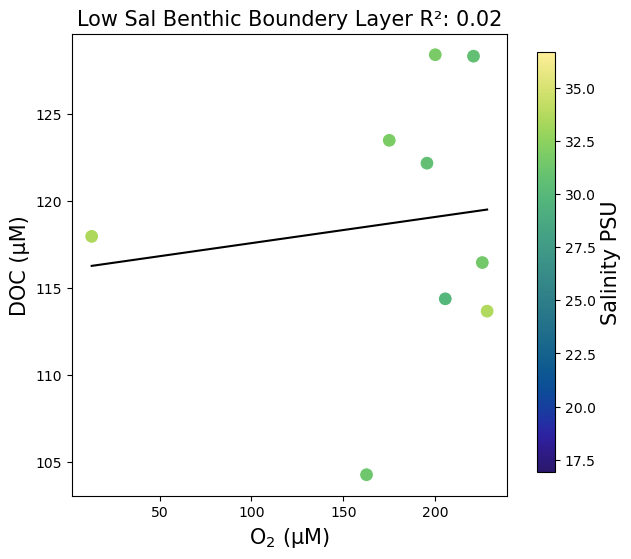

In [16]:
x_var = 'ox'
y_var = 'NPOC_uM'

x_var_lab = 'O$_2$ (µM)'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline


titel = "High Sal Water Column "
save_name = 'ox_highsal_wc'
xyplotcolor(data_wc_hsal)

titel = "Low Sal Water Column "
save_name = 'ox_lowsal_wc'
xyplotcolor(data_wc_lsal)

titel = "High Sal Benthic Boundery Layer "
save_name = 'ox_highsal_bbl'
xyplotcolor(data_bbl_hsal)

titel = "Low Sal Benthic Boundery Layer "
save_name = 'ox_lowsal_bbl'
xyplotcolor(data_bbl_lsal)

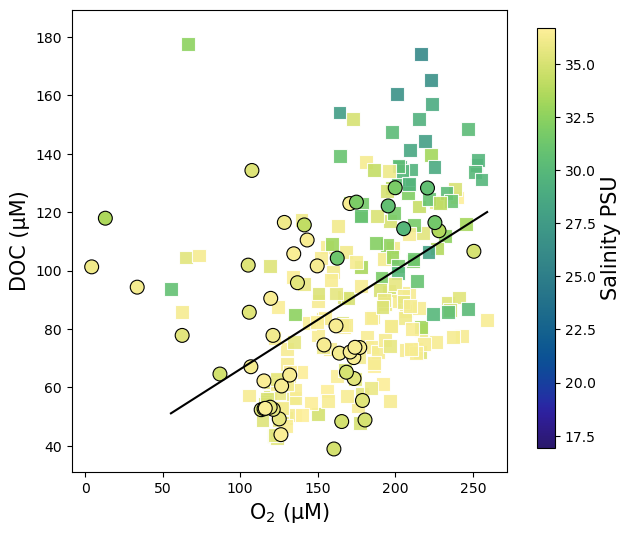

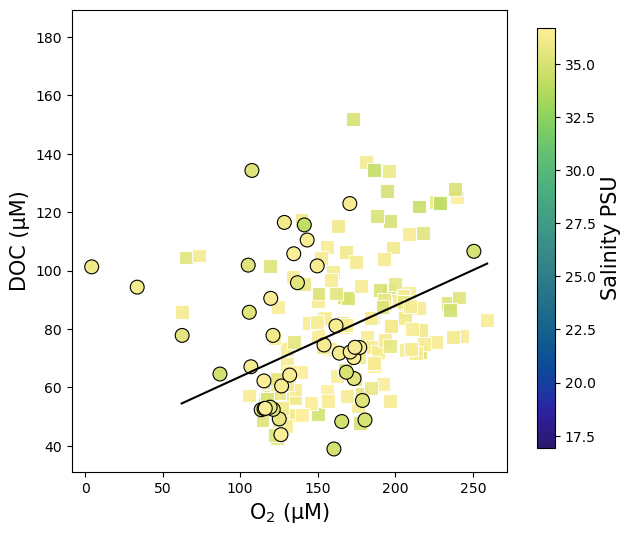

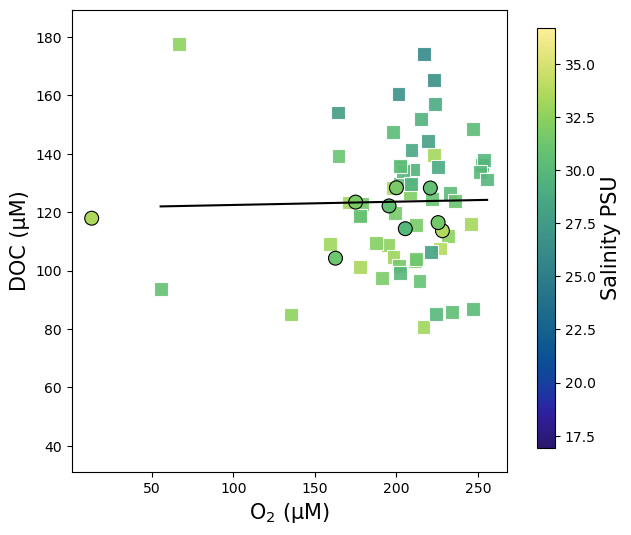

In [61]:
def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = 'black', ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)
    axes.set_ylim(data_wc_all[y_var].min()*.8, data_wc_all[y_var].max()*.7)

    #axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


    
x_var = 'ox'
y_var = 'NPOC_uM'

x_var_lab = 'O$_2$ (µM)'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline


titel = "BBL and Water Col "
save_name = 'ox_sal_wc_and_bbl'
xyplotcolor_2data(data_wc, data_wc_bbl)


titel = "High Salinity (PSU > 35) "
save_name = 'ox_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal)


titel = "Low Salinity (PSU < 35) "
save_name = 'ox_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_lsal, data_bbl_lsal)


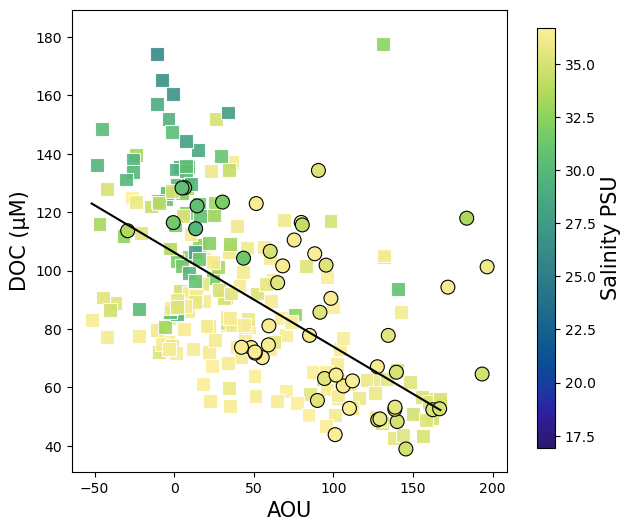

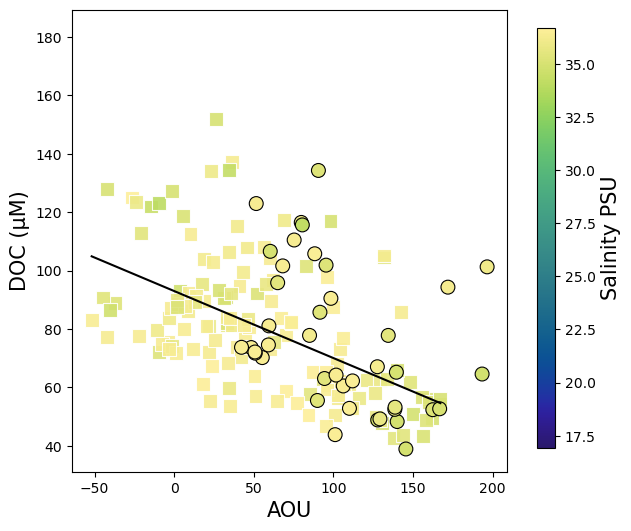

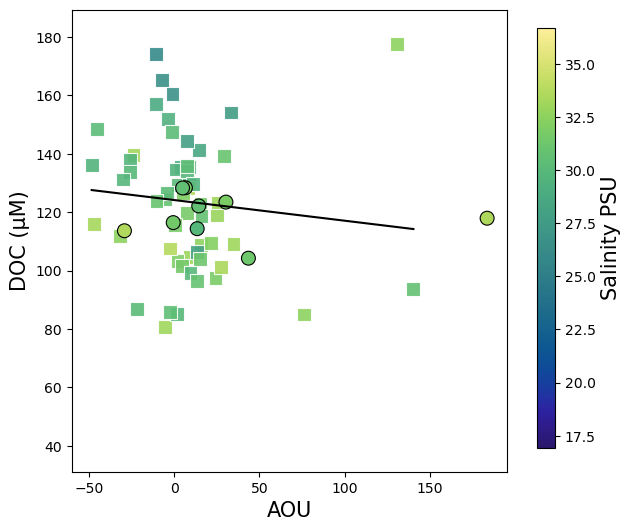

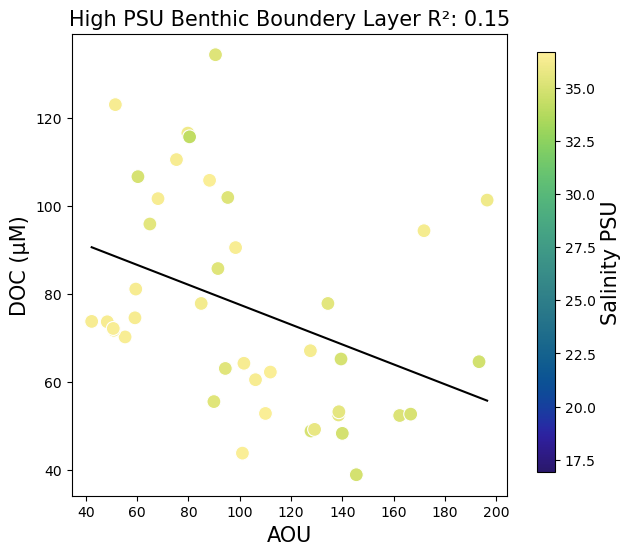

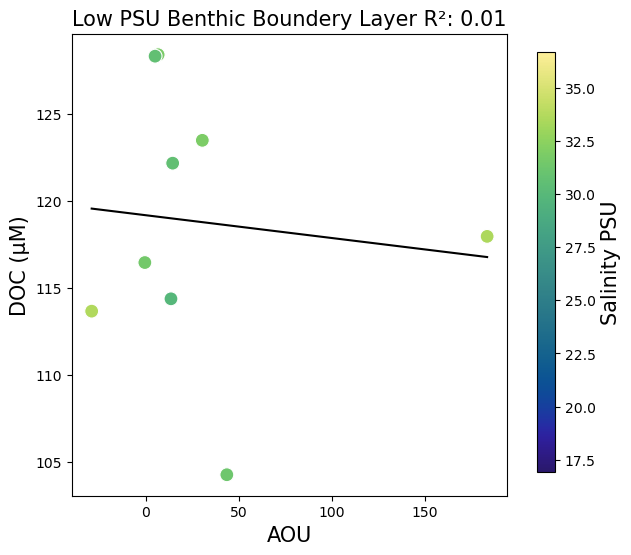

In [62]:

    
x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline


titel = "BBL and Water Col "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc, data_wc_bbl)


titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl_high'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal)


titel = "BBL and Water Col Low Sal "
save_name = 'aou_sal_wc_and_bbl_low'
xyplotcolor_2data(data_wc_lsal, data_bbl_lsal)


x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = "High PSU Benthic Boundery Layer "
save_name = 'aou_hsal_bbl'
xyplotcolor(data_bbl_hsal)
titel = "Low PSU Benthic Boundery Layer "
save_name = 'aou_lsal_bbl'
xyplotcolor(data_bbl_lsal)

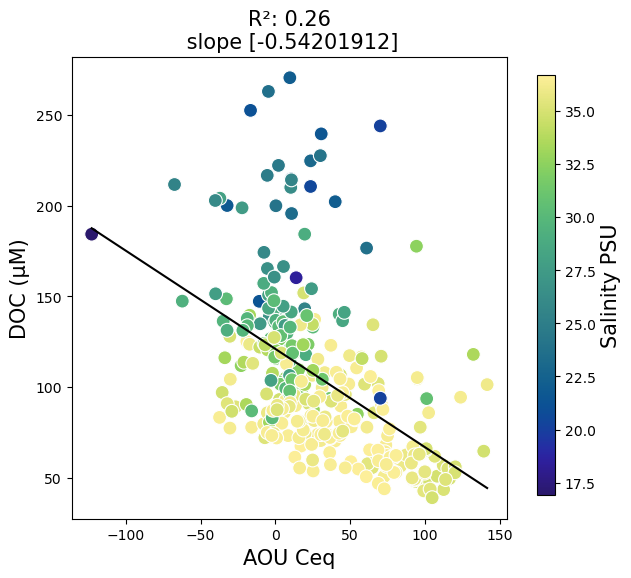

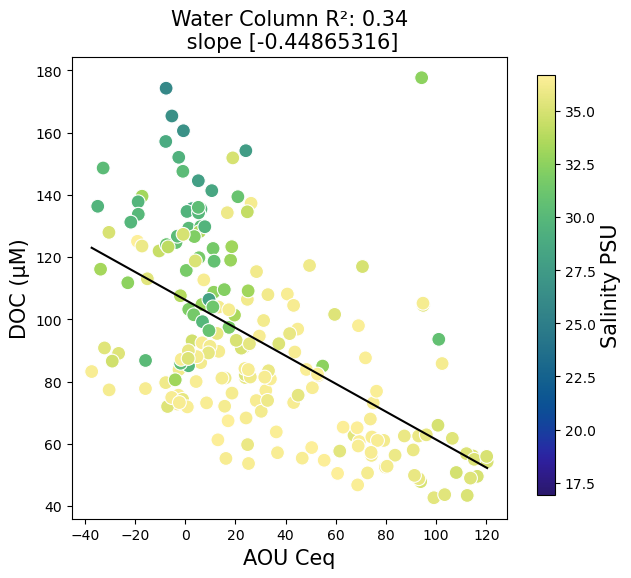

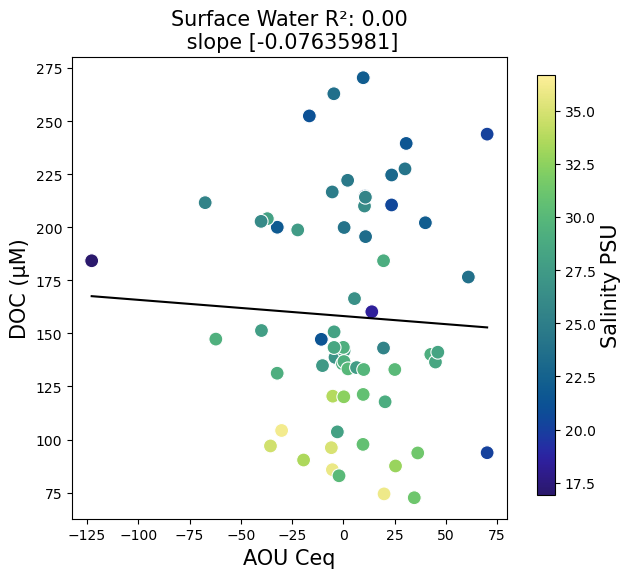

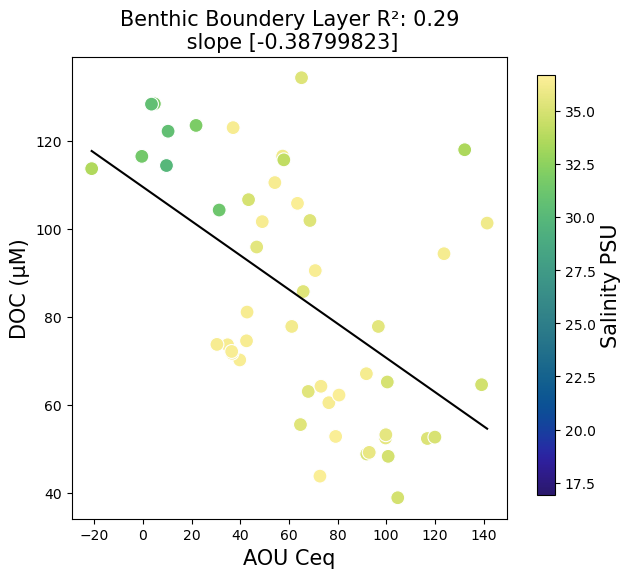

In [19]:
def xyplotcolor_Ceq(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    intercept = model.intercept_
    slope = model.coef_

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}' + '\n'+ f' slope {slope}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
    
x_var = 'aou-ceq'
y_var = 'NPOC_uM'

x_var_lab = 'AOU Ceq'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = ""
save_name = 'aou_temp_all'
xyplotcolor_Ceq(data_wc_all)
titel = "Water Column "
save_name = 'aou_temp_wc'
xyplotcolor_Ceq(data_wc)
titel = "Surface Water "
save_name = 'aou_temp_surf'
xyplotcolor_Ceq(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'aou_temp_bbl'
xyplotcolor_Ceq(data_wc_bbl)

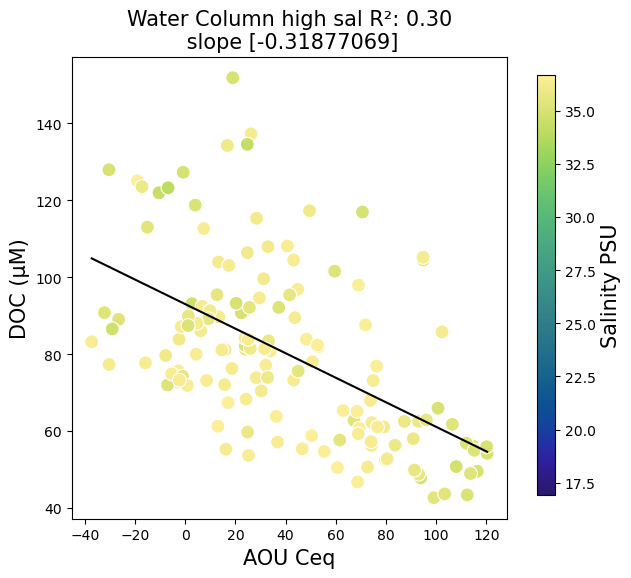

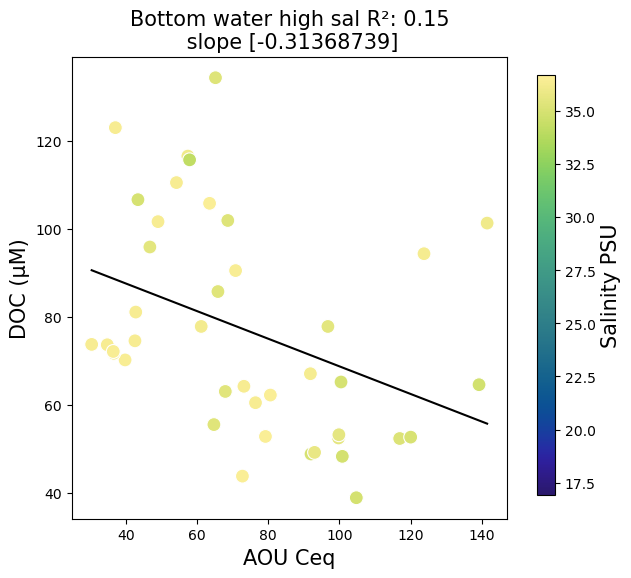

In [20]:
x_var = 'aou-ceq'
y_var = 'NPOC_uM'

x_var_lab = 'AOU Ceq'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = "Water Column high sal "
save_name = 'aou_temp_all'
xyplotcolor_Ceq(data_wc_hsal)

titel = "Bottom water high sal "
save_name = 'aou_temp_wc'
xyplotcolor_Ceq(data_bbl_hsal)




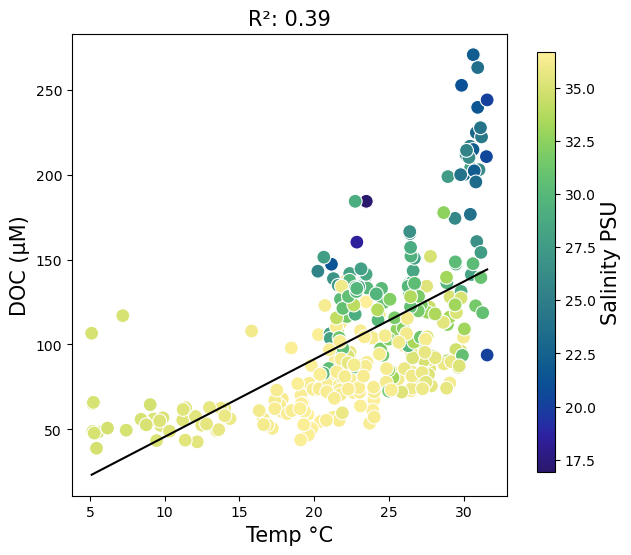

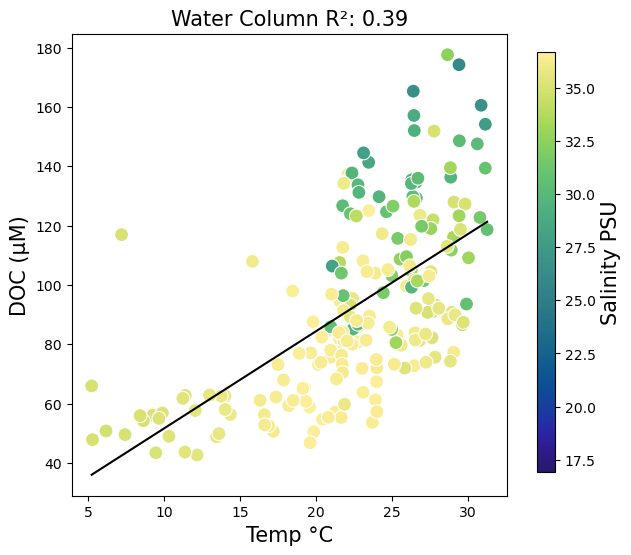

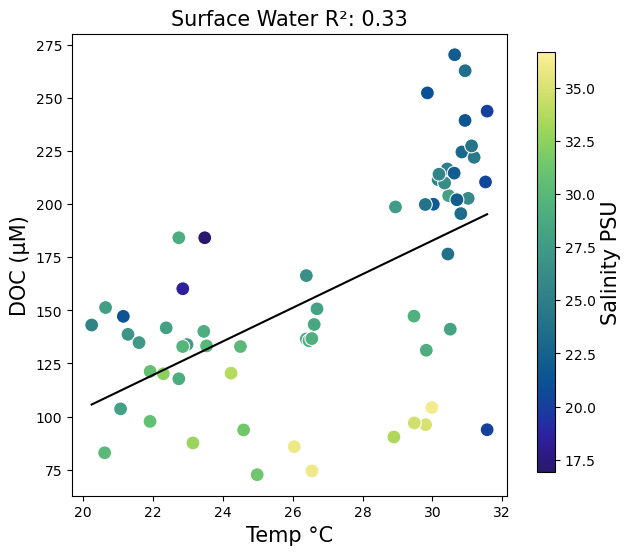

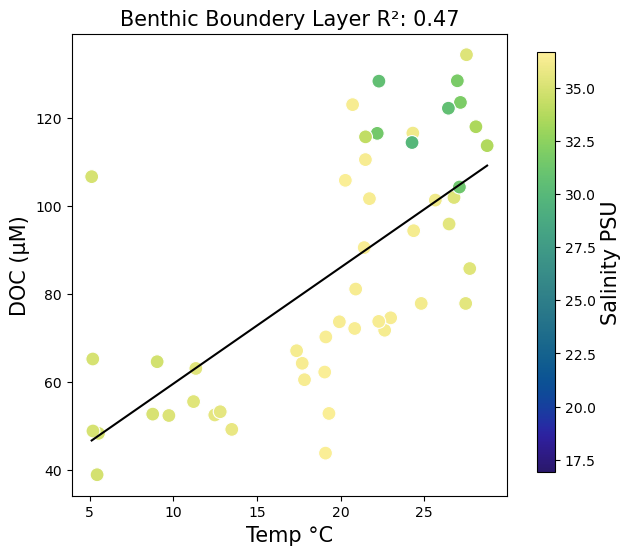

In [21]:
x_var = 'temp'
y_var = 'NPOC_uM'

x_var_lab = 'Temp °C'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = ""
save_name = 'temp_sal_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'temp_sal_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'temp_sal_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'temp_sal_bbl'
xyplotcolor(data_wc_bbl)

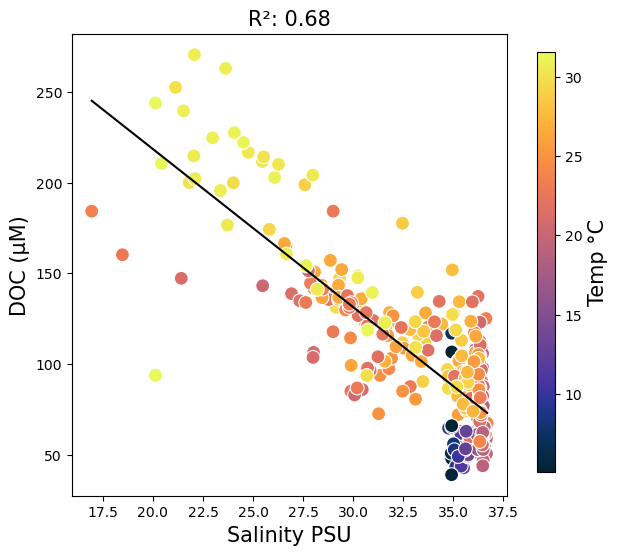

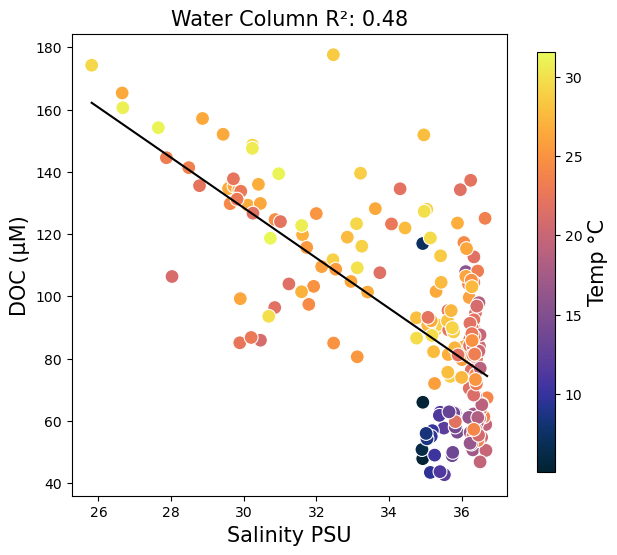

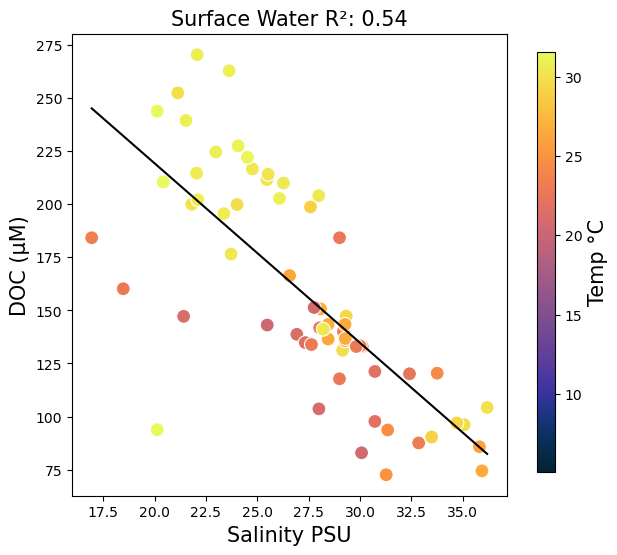

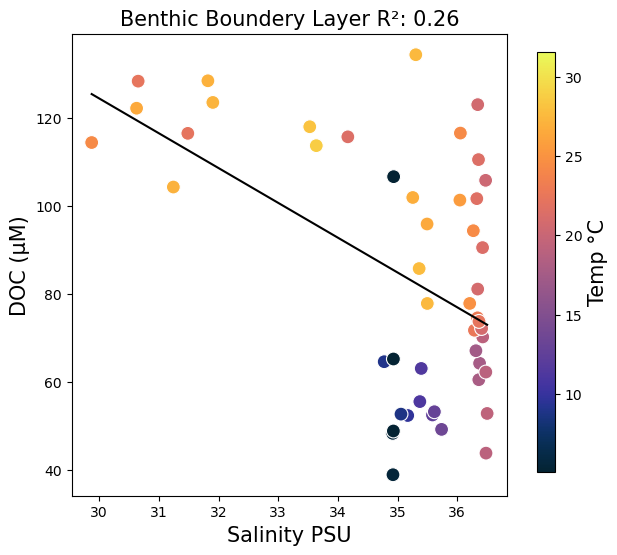

In [22]:
x_var = 'sal' 
y_var = 'NPOC_uM'

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)'

z_var = 'temp'
z_var_lab = 'Temp °C' 
z_var_color = cmo.thermal

titel = ""
save_name = 'sal_temp_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'sal_temp_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'sal_temp_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'sal_temp_bbl'
xyplotcolor(data_wc_bbl)

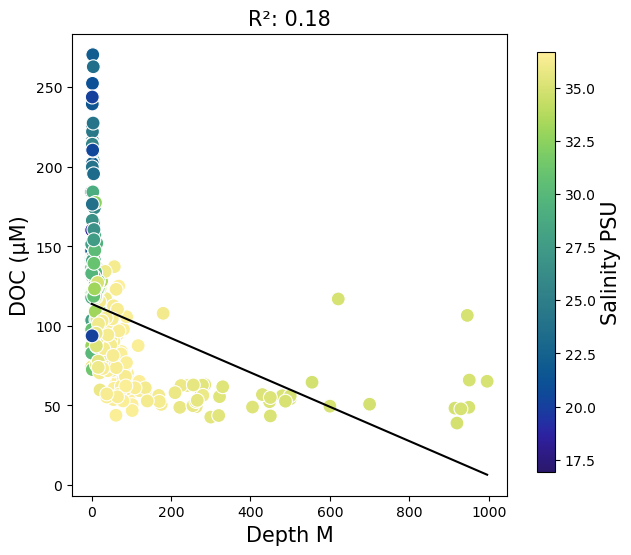

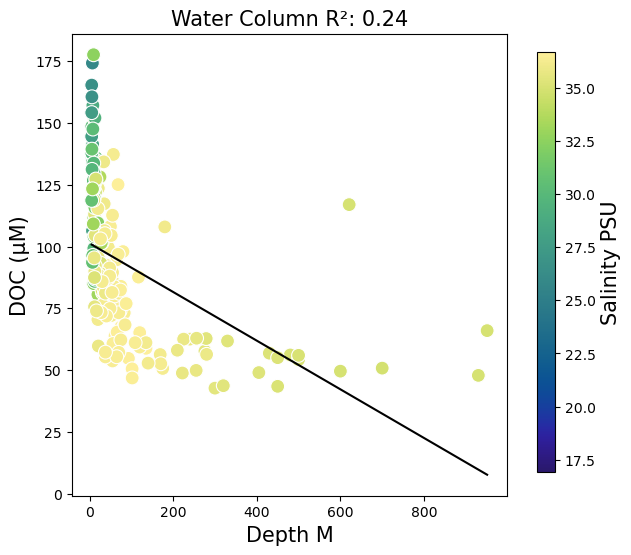

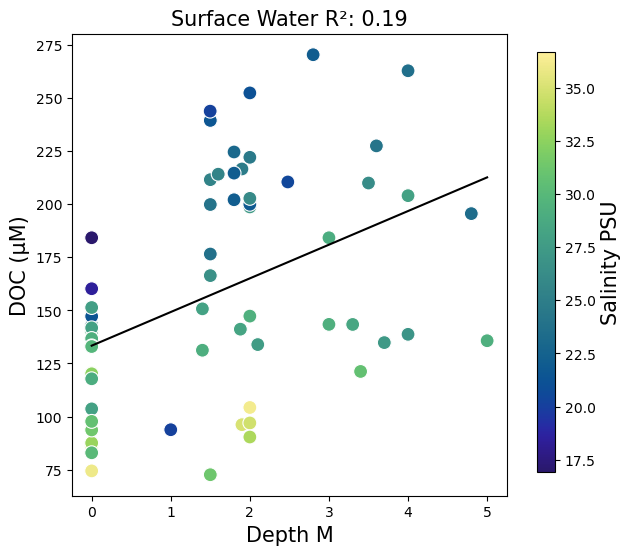

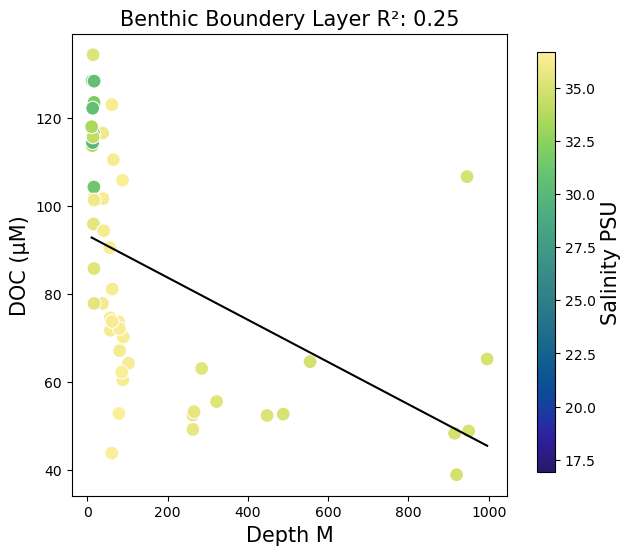

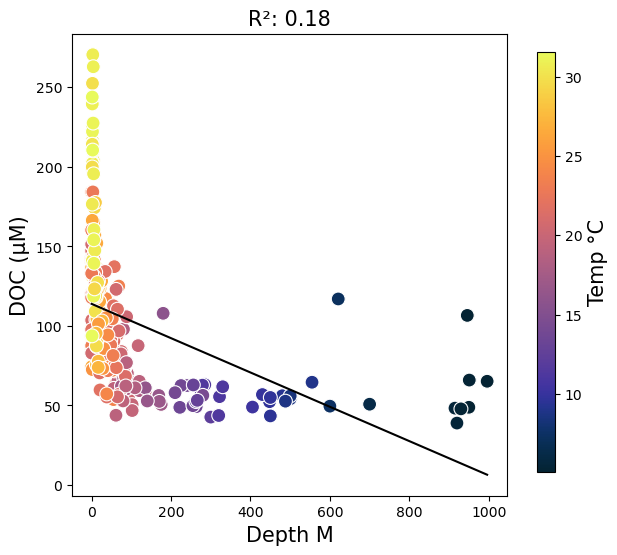

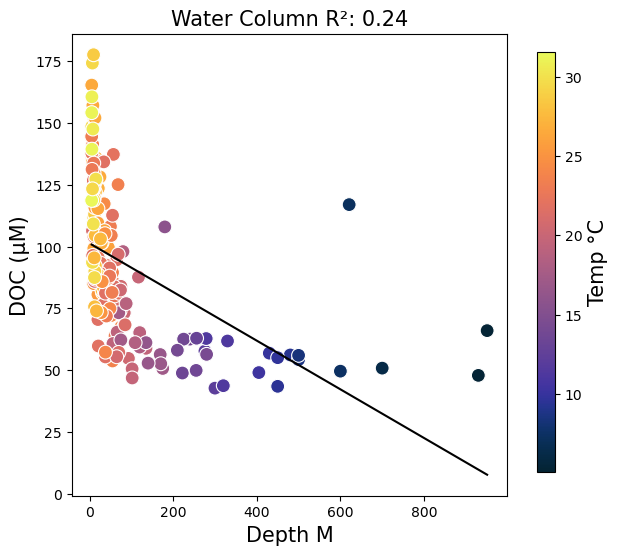

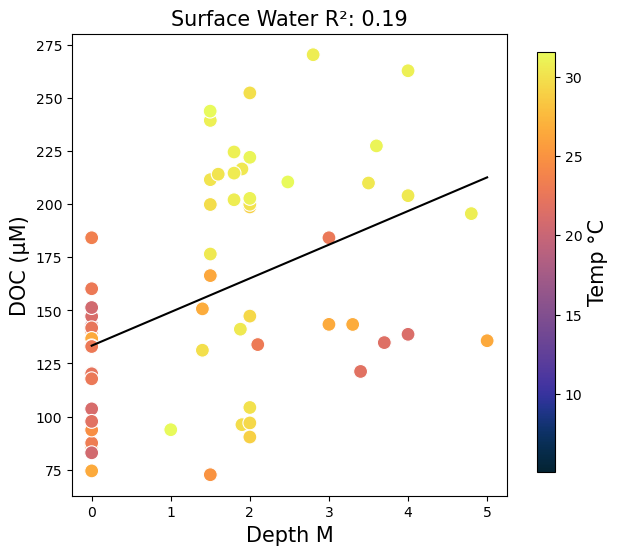

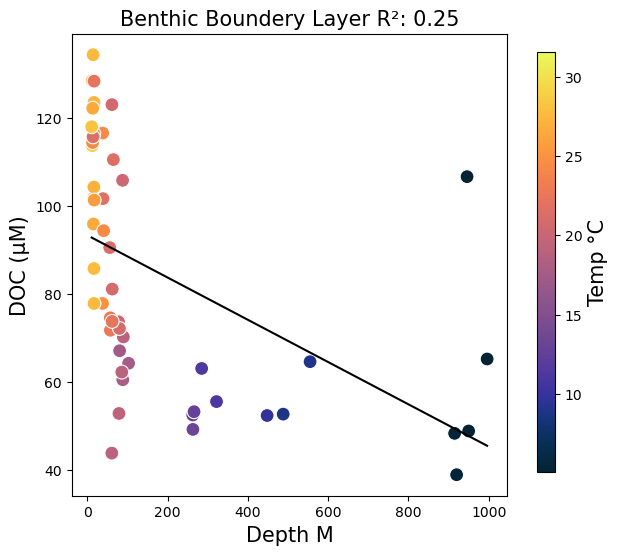

Index(['code', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth', 'Campaign',
       'Location', 'Ts', 'density_kg_m3', 'density_kg_l', 'ox_umol_kg',
       'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'rgn'],
      dtype='object')

In [23]:
x_var = 'Depth'
y_var = 'NPOC_uM'

x_var_lab = 'Depth M'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = ""
save_name = 'depth_sal_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'depth_sal_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'depth_sal_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'depth_sal_bbl'
xyplotcolor(data_wc_bbl)

x_var = 'Depth'
y_var = 'NPOC_uM'

x_var_lab = 'Depth M'
y_var_lab = 'DOC (µM)'

z_var = 'temp'
z_var_lab = 'Temp °C' 
z_var_color = cmo.thermal

titel = ""
save_name = 'depth_temp_all'
xyplotcolor(data_wc_all)
titel = "Water Column "
save_name = 'depth_temp_wc'
xyplotcolor(data_wc)
titel = "Surface Water "
save_name = 'depth_temp_surf'
xyplotcolor(data_wc_surf)
titel = "Benthic Boundery Layer "
save_name = 'depth_temp_bbl'
xyplotcolor(data_wc_bbl)

data_wc.columns

def xyplotcolor_oxy(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = 300

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


x_var = 'Depth'
y_var = 'NPOC_uM'

x_var_lab = 'Depth M'
y_var_lab = 'DOC (µM)'

z_var = 'ox'
z_var_lab = 'O$_2$ (µM)'
z_var_color = cmo.oxy

titel = ""
save_name = 'depth_ox_all'
xyplotcolor_oxy(data_wc_all)
titel = "Water Column "
save_name = 'depth_ox_wc'
xyplotcolor_oxy(data_wc)
titel = "Surface Water "
save_name = 'depth_ox_surf'
xyplotcolor_oxy(data_wc_surf)
titel = "Benthic Boundery Layer"
save_name = 'depth_ox_bbl'
xyplotcolor_oxy(data_wc_bbl)


x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ox'
z_var_lab = 'O$_2$ (µM)'
z_var_color = cmo.oxy

titel = "High PSU Benthic Boundery Layer "
save_name = 'aou_ox_hsal_bbl'
xyplotcolor_oxy(data_bbl_hsal)
titel = "Low PSU Benthic Boundery Layer "
save_name = 'aou_ox_lsal_bbl'
xyplotcolor_oxy(data_bbl_lsal)

x_var = 'temp'
y_var = 'NPOC_uM'

x_var_lab = 'Temp °C'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

data_wc_low_o2 = data_wc_all[data_wc_all['ox'] <= 60]
data_wc_high_o2 = data_wc_all[data_wc_all['ox'] >= 260]
data_wc_typical_o2 = data_wc_all[data_wc_all['ox'] <= 260]
data_wc_typical_o2 = data_wc_typical_o2[data_wc_typical_o2['ox'] >= 60]

titel = "High O$_2$ (µM) "
save_name = 'temp_sal_o2_high'
xyplotcolor(data_wc_high_o2)
titel = "Low O$_2$ (µM) "
save_name = 'temp_sal_o2_low'
xyplotcolor(data_wc_low_o2)
titel = "Typical O$_2$ (µM) "
save_name = 'temp_sal_o2_typical'
xyplotcolor(data_wc_typical_o2)

x_var = 'sal'
y_var = 'temp' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'Temp °C' 

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

z_var = 'ox'
z_var_lab = 'O$_2$ (µM)'
z_var_color = cmo.oxy

titel = "Benthic Boundery Layer "
save_name = 'sal_temp_ox_bbl'
xyplotcolor_oxy(data_wc_bbl)

x_var = 'sal'
y_var = 'temp' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'Temp °C' 

z_var = 'NPOC_uM'
z_var_lab = 'DOC (µM)'
z_var_color = cmo.matter

titel = "Benthic Boundery Layer "
save_name = 'sal_temp_doc_bbl'
xyplotcolor(data_wc_bbl)


x_var = 'ox'
y_var = 'temp' 

x_var_lab = 'O$_2$ (µM)'
y_var_lab = 'Temp °C' 

z_var = 'NPOC_uM'
z_var_lab = 'DOC (µM)'
z_var_color = cmo.matter

titel = "Benthic Boundery Layer "
save_name = 'ox_temp_doc_bbl'
xyplotcolor(data_wc_bbl)

x_var = 'ox'
y_var = 'sal' 

x_var_lab = 'O$_2$ (µM)'
y_var_lab = 'Salinity PSU' 

z_var = 'NPOC_uM'
z_var_lab = 'DOC (µM)'
z_var_color = cmo.matter

titel = "Benthic Boundery Layer "
save_name = 'ox_sal_doc_bbl'
xyplotcolor(data_wc_bbl)


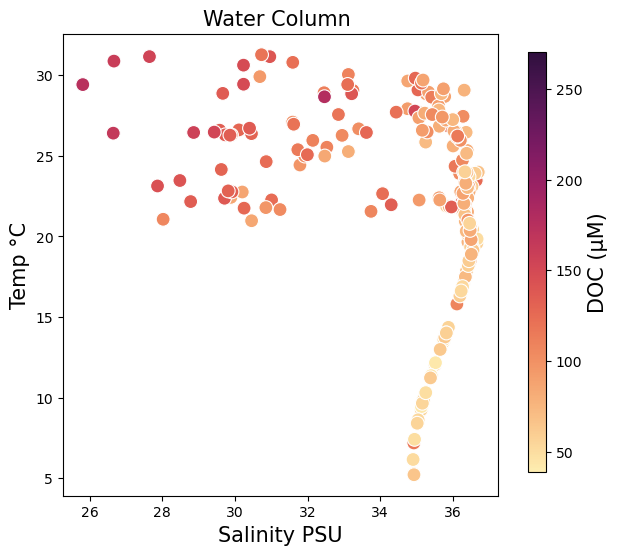

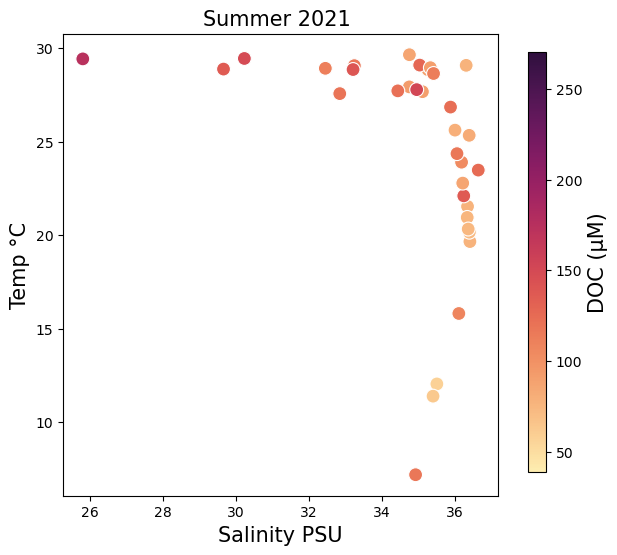

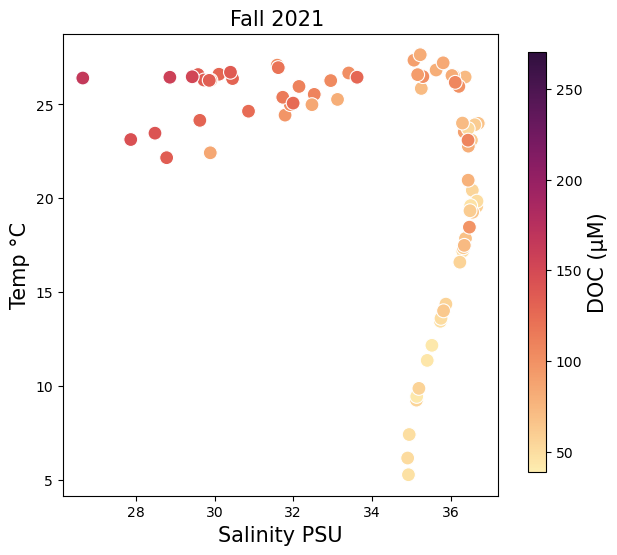

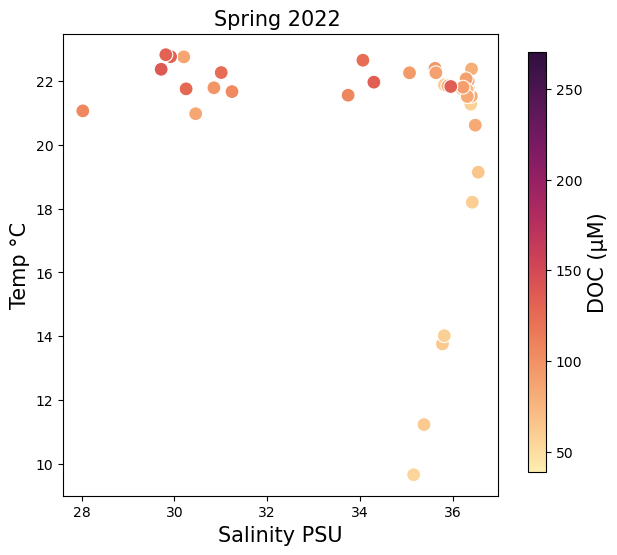

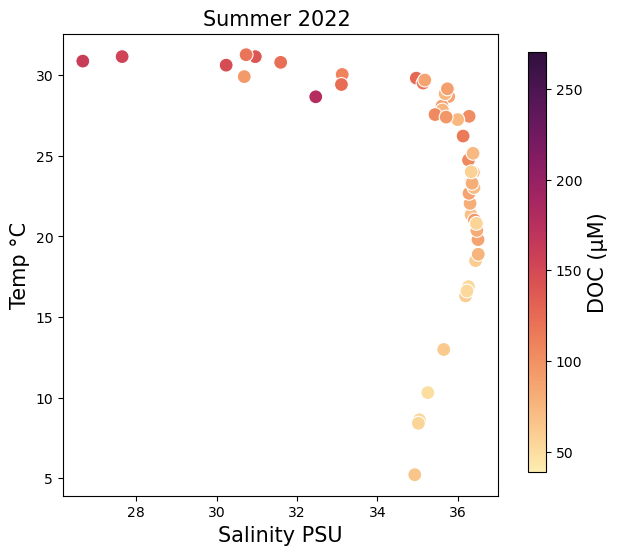

In [24]:
def xyplotcolor_noline(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
x_var = 'sal'
y_var = 'temp' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'Temp °C' 

z_var = 'NPOC_uM'
z_var_lab = 'DOC (µM)'
z_var_color = cmo.matter

titel = "Water Column "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc)

titel = "Summer 2021 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc[data_wc['Campaign'] == 'GOM2021'])

titel = "Fall 2021 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc[data_wc['Campaign'] == 'GOM21FA'])

titel = "Spring 2022 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc[data_wc['Campaign'] == 'GOM22SP'])

titel = "Summer 2022 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc[data_wc['Campaign'] == 'GOM22SU'])

In [25]:
data_wc_all['rgn'].unique()

array(['Slope', 'Distal Shelf', 'Proximal Shelf', 'Hypoxic Shelf'],
      dtype=object)

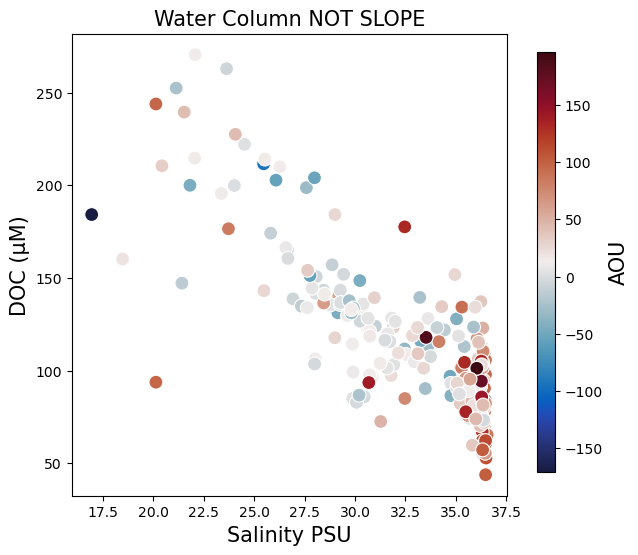

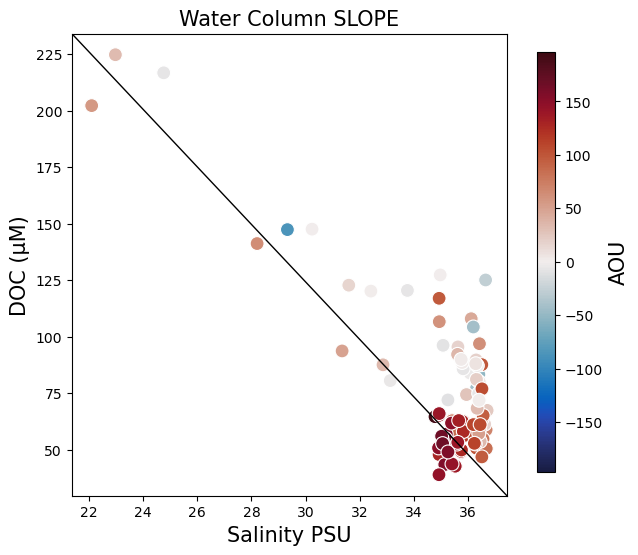

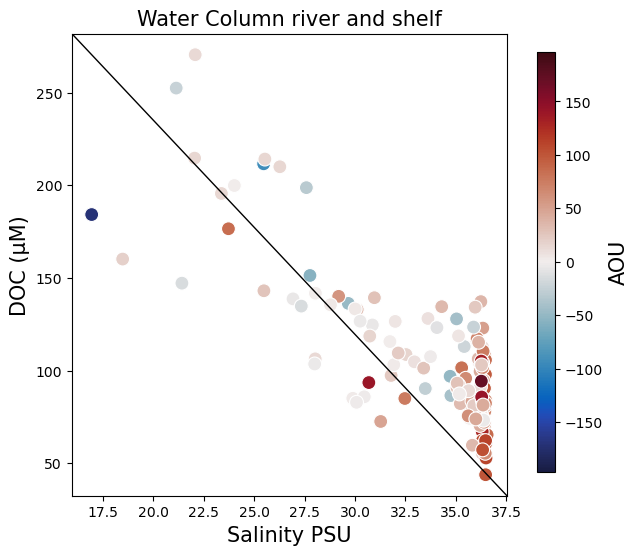

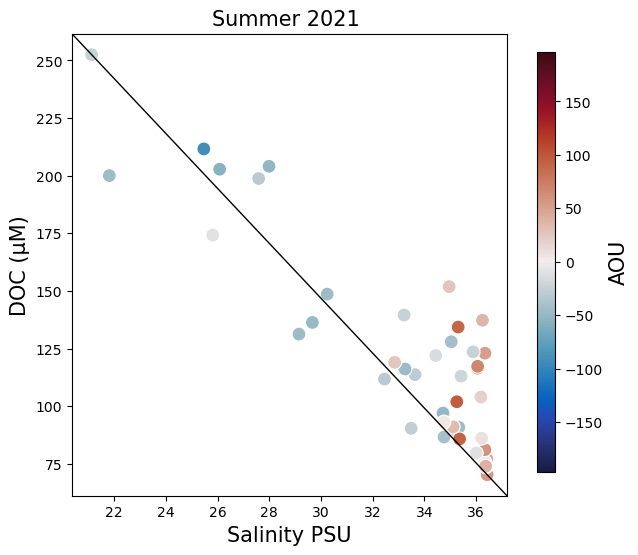

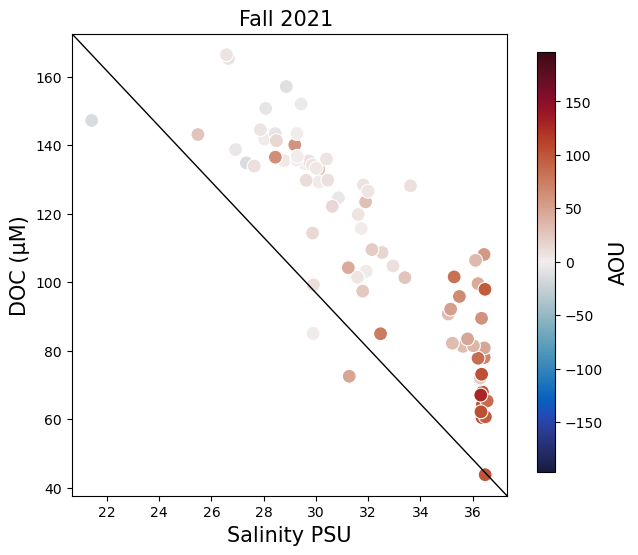

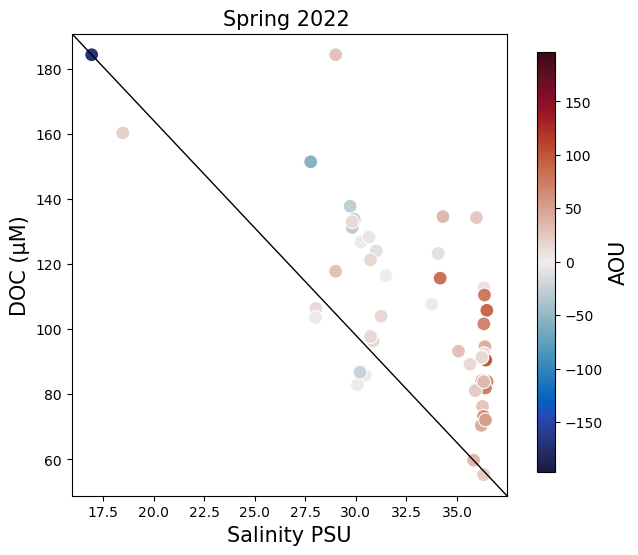

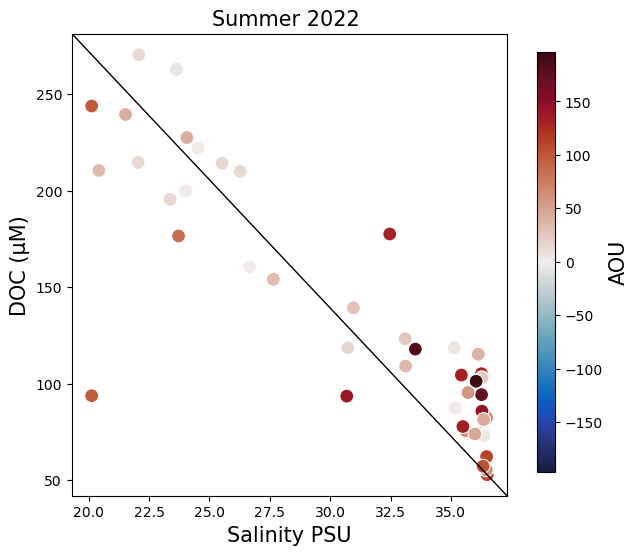

In [26]:
def xyplotcolor_line_ab(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].max()*-1
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance


data_wc_all_no_slope = data_wc_all[data_wc_all['rgn'] != 'Slope']
data_wc_all_slope = data_wc_all[data_wc_all['rgn'] == 'Slope']

titel = "Water Column NOT SLOPE"
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc_all[data_wc_all['rgn'] != 'Slope'])

titel = "Water Column SLOPE"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all[data_wc_all['rgn'] == 'Slope'])

titel = "Water Column river and shelf"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all[data_wc_all['rgn'].isin(['Distal Shelf', 'Proximal Shelf'])])

titel = "Summer 2021 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM2021'])

titel = "Fall 2021 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM21FA'])

titel = "Spring 2022 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM22SP'])

titel = "Summer 2022 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM22SU'])

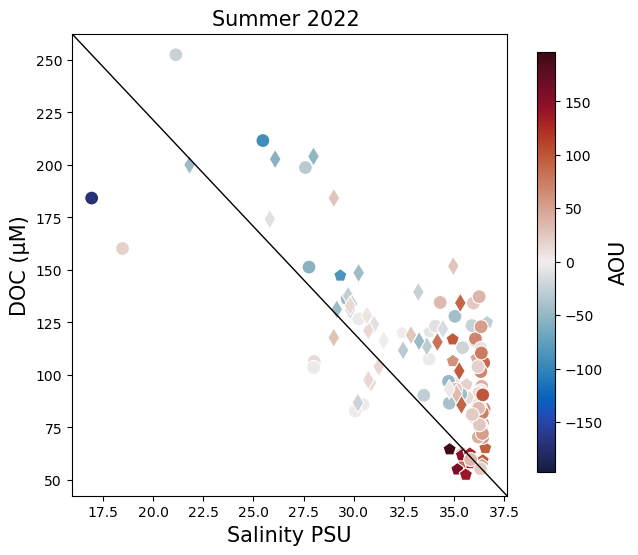

In [27]:

marker_map = {
    'Slope': 'p',
    'Shelf': 'o',
    'River Delta': 's',
    'Hypoxic Shelf': 'd'
}
                

def xyplotcolor_line_ab(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subrgn = data['rgn'].tolist()
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].max()*-1
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    for region in data['rgn'].unique():
        subset = data[data['rgn'] == region]
        colors = subset[z_var].astype(float)
        sns.scatterplot(x=x_var, y=y_var, 
                        c=colors, cmap=z_var_color,
                        s=100, data=subset, 
                        ax=axes, legend=False,
                        vmin=vmin, vmax=vmax, 
                        marker=marker_map.get(region, 'o'))


    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    colors = data[z_var].astype(float)
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance

xyplotcolor_line_ab(data_wc_all[data_wc_all['Campaign'].isin(['GOM2021', 'GOM22SP'])])

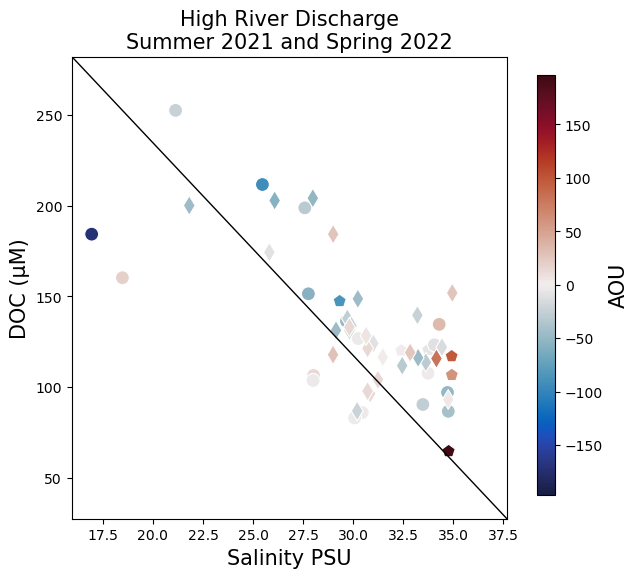

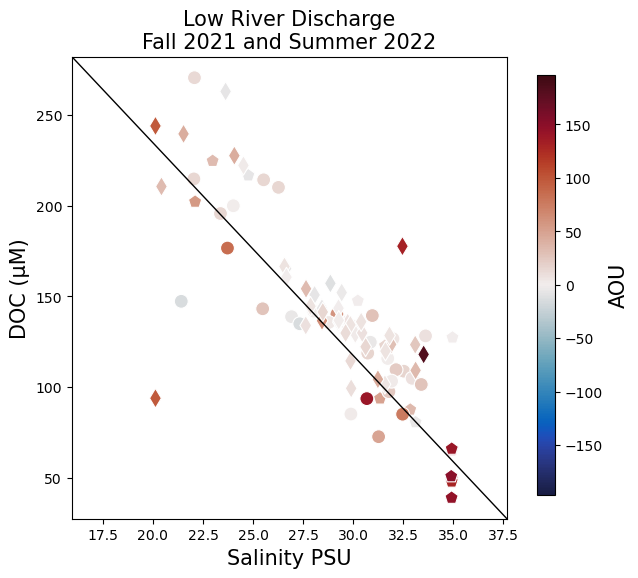

In [28]:
#high flow times Summer 2021 and Spring 2022 
#low flow regimes Fall 2021 and Summer 2022

marker_map = {
    'Slope': 'p',
    'Shelf': 'o',
    'River Delta': 's',
    'Hypoxic Shelf': 'd'
}
                

def xyplotcolor_line_ab(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subrgn = data['rgn'].tolist()
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].max()*-1
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    for region in data['rgn'].unique():
        subset = data[data['rgn'] == region]
        colors = subset[z_var].astype(float)
        sns.scatterplot(x=x_var, y=y_var, 
                        c=colors, cmap=z_var_color,
                        s=100, data=subset, 
                        ax=axes, legend=False,
                        vmin=vmin, vmax=vmax, 
                        marker=marker_map.get(region, 'o'))


    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    colors = data[z_var].astype(float)
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data_wc_all[x_var].min(), data_wc_all[y_var].max()), (data_wc_all[x_var].max(), data_wc_all[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance

high_flow = data_wc_all[data_wc_all['Campaign'].isin(['GOM2021', 'GOM22SP'])]
low_flow = data_wc_all[data_wc_all['Campaign'].isin(['GOM21FA', 'GOM22SU'])]

titel = r'High River Discharge' + '\n' + 'Summer 2021 and Spring 2022'
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(high_flow[high_flow['sal'] <= 35])


titel = r'Low River Discharge' + '\n' + 'Fall 2021 and Summer 2022'
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(low_flow[low_flow['sal'] <= 35])


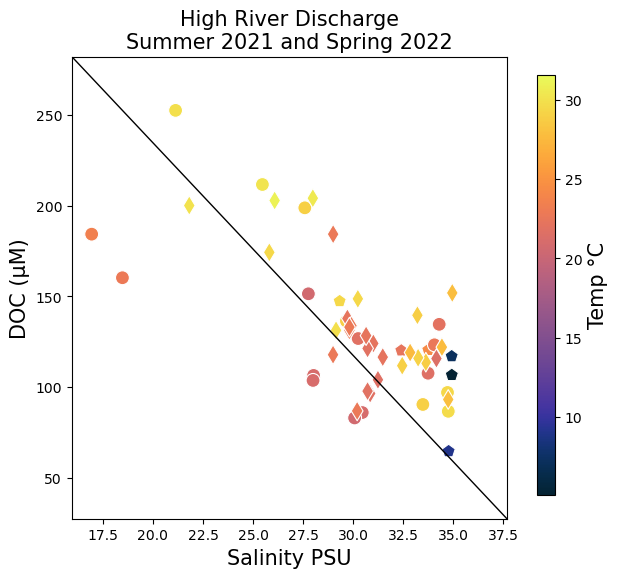

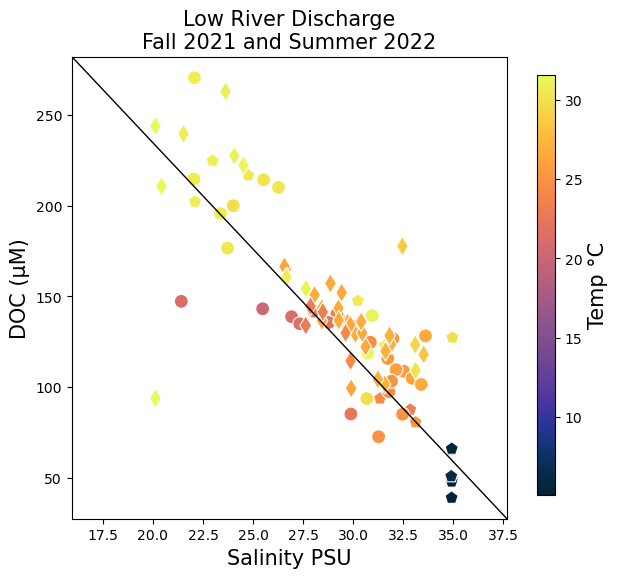

In [29]:

def xyplotcolor_line_ab(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subrgn = data['rgn'].tolist()
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    for region in data['rgn'].unique():
        subset = data[data['rgn'] == region]
        colors = subset[z_var].astype(float)
        sns.scatterplot(x=x_var, y=y_var, 
                        c=colors, cmap=z_var_color,
                        s=100, data=subset, 
                        ax=axes, legend=False,
                        vmin=vmin, vmax=vmax, 
                        marker=marker_map.get(region, 'o'))


    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    colors = data[z_var].astype(float)
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data_wc_all[x_var].min(), data_wc_all[y_var].max()), (data_wc_all[x_var].max(), data_wc_all[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'temp'
z_var_lab = 'Temp °C'
z_var_color = cmo.thermal

high_flow = data_wc_all[data_wc_all['Campaign'].isin(['GOM2021', 'GOM22SP'])]
low_flow = data_wc_all[data_wc_all['Campaign'].isin(['GOM21FA', 'GOM22SU'])]

titel = r'High River Discharge' + '\n' + 'Summer 2021 and Spring 2022'
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(high_flow[high_flow['sal'] <= 35])


titel = r'Low River Discharge' + '\n' + 'Fall 2021 and Summer 2022'
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(low_flow[low_flow['sal'] <= 35])


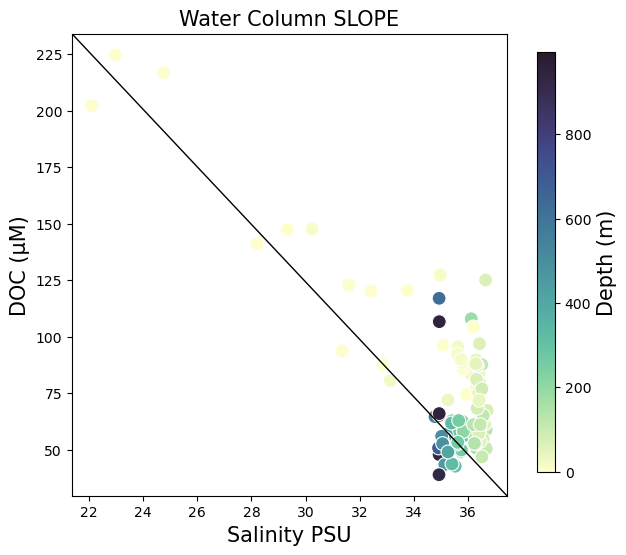

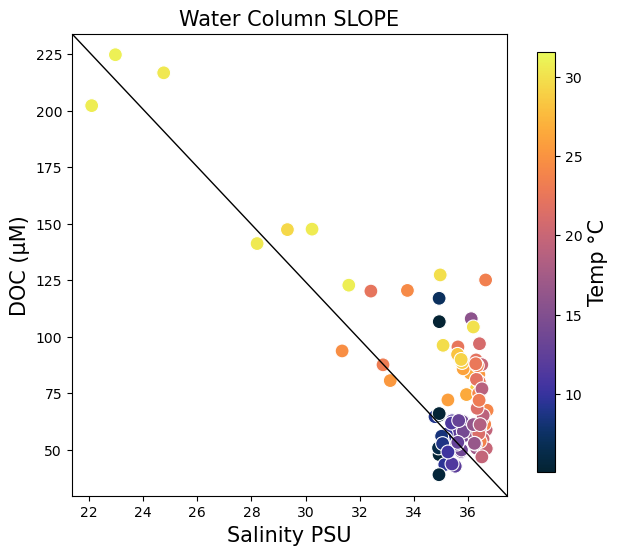

In [30]:
def xyplotcolor_line_ab_thermal(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'Depth'
z_var_lab = 'Depth (m)'
z_var_color = cmo.deep

titel = "Water Column SLOPE"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab_thermal(data_wc_all_slope)

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'temp'
z_var_lab = 'Temp °C' 
z_var_color = cmo.thermal

titel = "Water Column SLOPE"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab_thermal(data_wc_all_slope)



In [31]:
data_wc_all_slope['Location'].unique()

array(['St.11', 'St.13', 'St.15', 'St.12'], dtype=object)

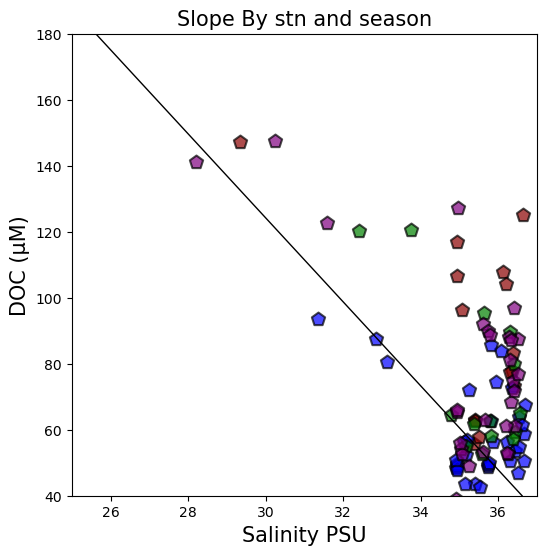

In [32]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'St.11': 'p',
    'St.13': 'p',
    'St.15': 'p',
    'St.12': 'p'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'Location']]
    subcat = data['Campaign'].tolist()
    subrgn = data['Location'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['Location'].unique():
            subset = data[(data[z_var] == campaign) & (data['Location'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')


    axes.set_ylim(40, 180)
    axes.set_xlim(25, 37)

    axes.set_title(titel, size=15)
    
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = "Slope By stn and season"
save_name = 'kk'
xyplotcolor_cat_color(data_wc_all_slope)


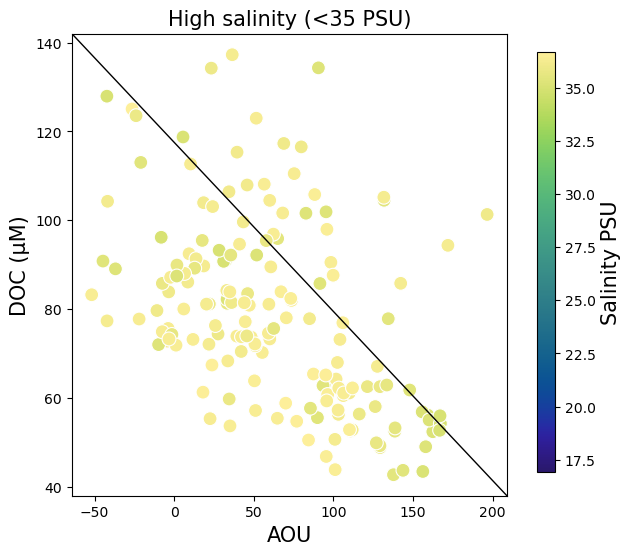

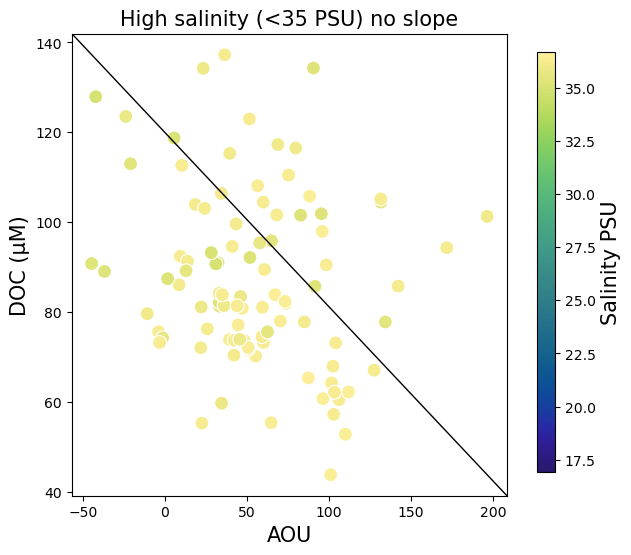

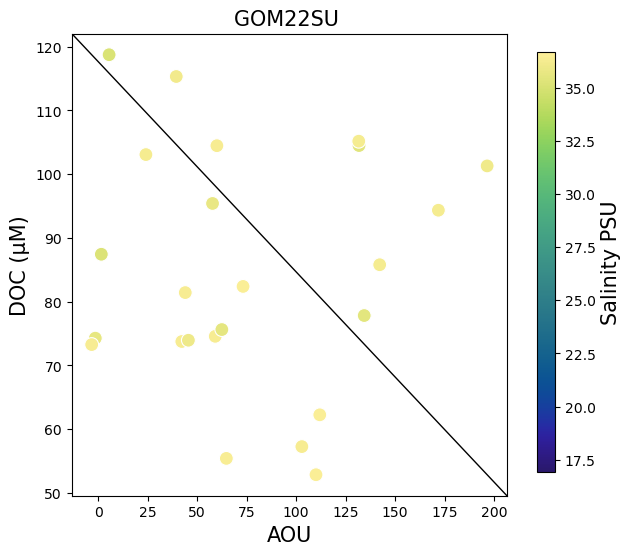

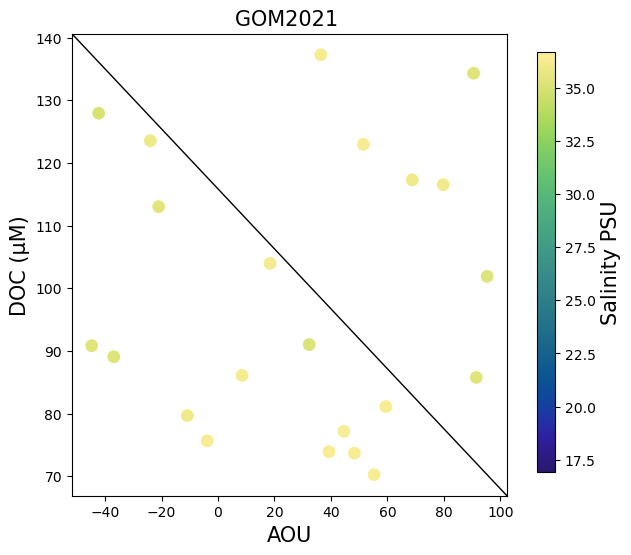

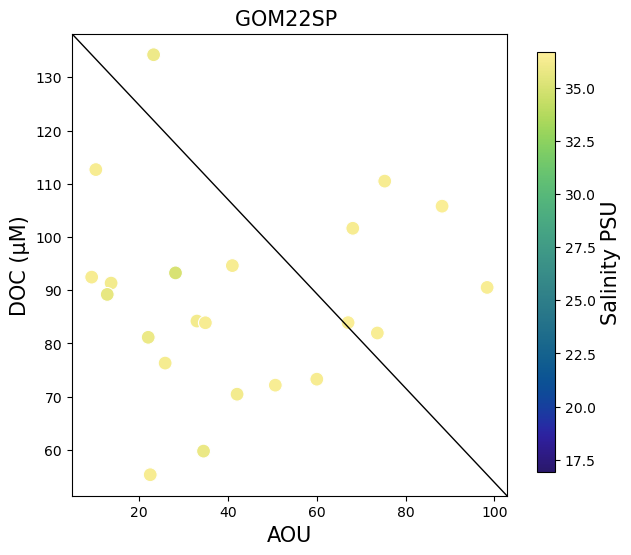

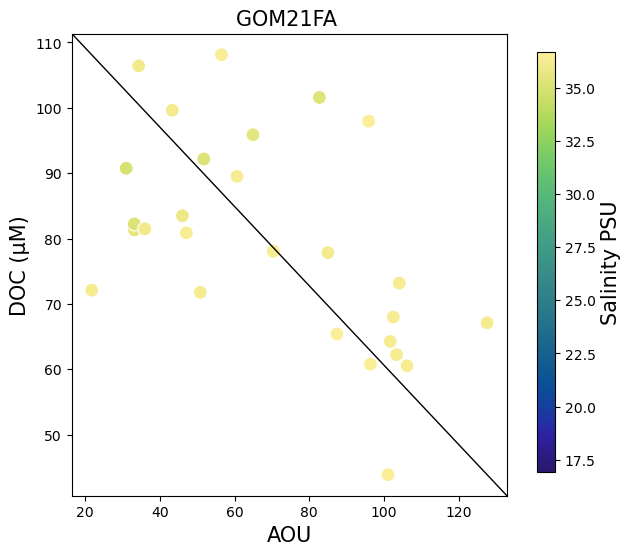

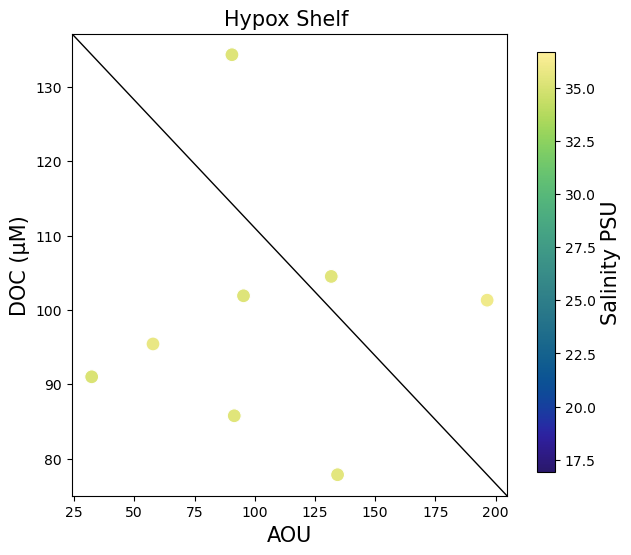

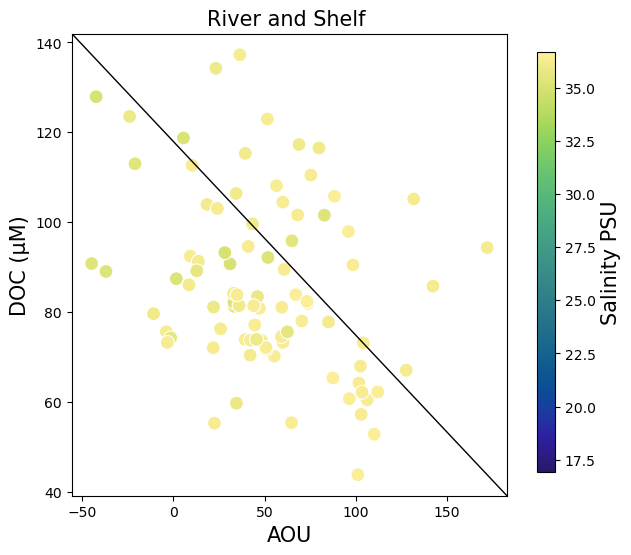

In [33]:
def xyplotcolor_line_ab(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


data_wc_all_no_slope = data_wc_all[data_wc_all['rgn'] != 'Slope']
data_wc_all_slope = data_wc_all[data_wc_all['rgn'] == 'Slope']

data_wc_all_no_slope_sum22 = data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM22SU']
data_wc_all_no_slope_sum21 = data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM2021']
data_wc_all_no_slope_spr22 = data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM22SP']
data_wc_all_no_slope_fal21 = data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM21FA']

data_wc_all_Shelf = data_wc_all_no_slope[data_wc_all_no_slope['rgn'].isin(['Distal Shelf', 'Proximal Shelf'])]
data_wc_all_Hypox = data_wc_all_no_slope[data_wc_all_no_slope['rgn'].isin(['Hypoxic Shelf'])]


y_var = 'NPOC_uM'
z_var = 'sal' 

z_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

x_var = 'aou'
x_var_lab = 'AOU'
z_var_color = cmo.haline

titel = "High salinity (<35 PSU)"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all[data_wc_all['sal'] >= 35])

titel = "High salinity (<35 PSU) no slope"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all_no_slope[data_wc_all_no_slope['sal'] >= 35])

titel = "GOM22SU "
xyplotcolor_line_ab(data_wc_all_no_slope_sum22[data_wc_all_no_slope_sum22['sal'] >= 35])

titel = "GOM2021 "
xyplotcolor_line_ab(data_wc_all_no_slope_sum21[data_wc_all_no_slope_sum21['sal'] >= 35])

titel = "GOM22SP "
xyplotcolor_line_ab(data_wc_all_no_slope_spr22[data_wc_all_no_slope_spr22['sal'] >= 35])

titel = "GOM21FA "
xyplotcolor_line_ab(data_wc_all_no_slope_fal21[data_wc_all_no_slope_fal21['sal'] >= 35])

titel = "Hypox Shelf "
xyplotcolor_line_ab(data_wc_all_Hypox[data_wc_all_Hypox['sal'] >= 35])

titel = "River and Shelf "
xyplotcolor_line_ab(data_wc_all_Shelf[data_wc_all_Shelf['sal'] >= 35])



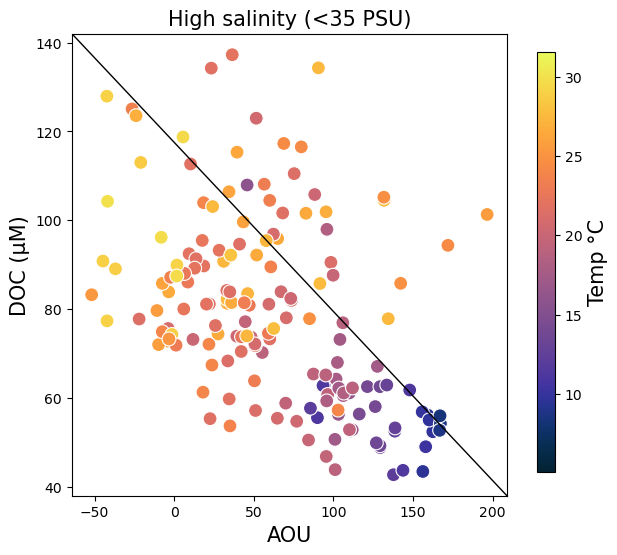

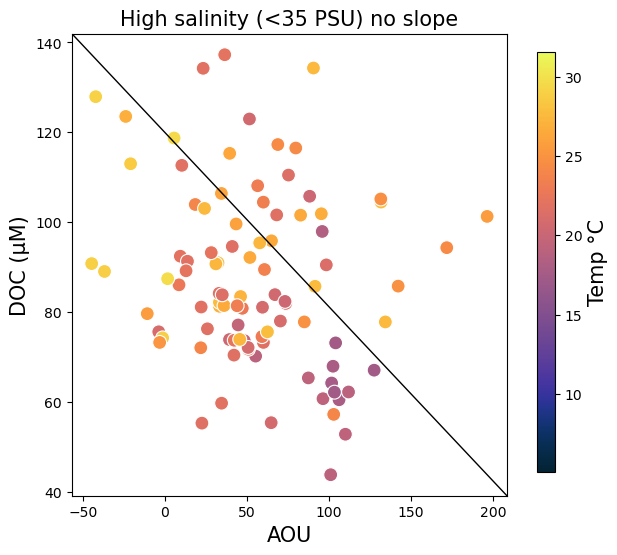

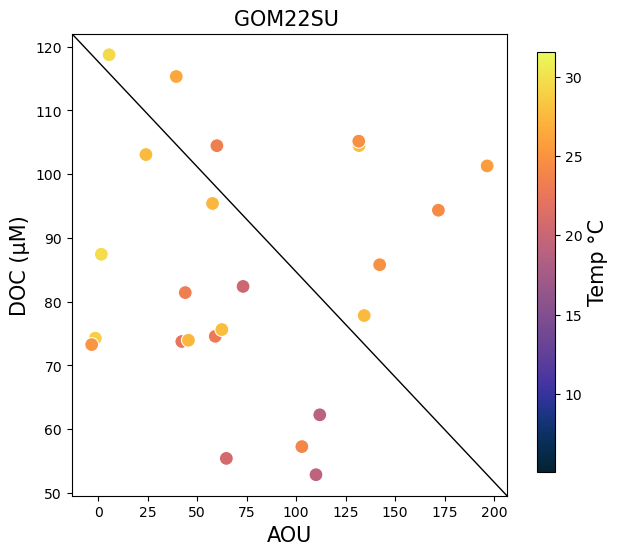

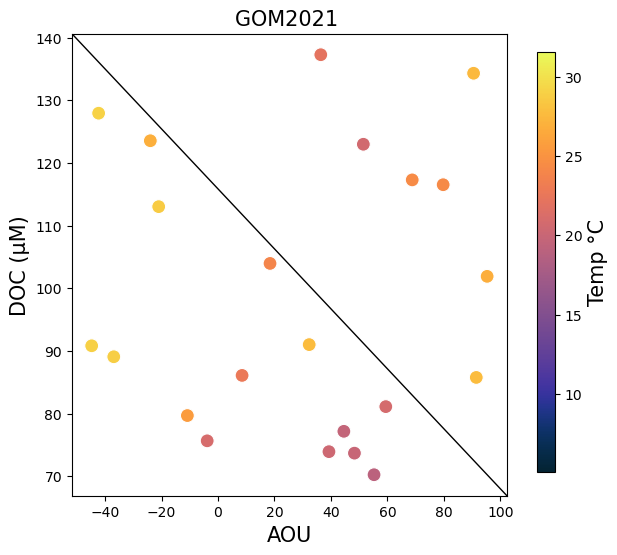

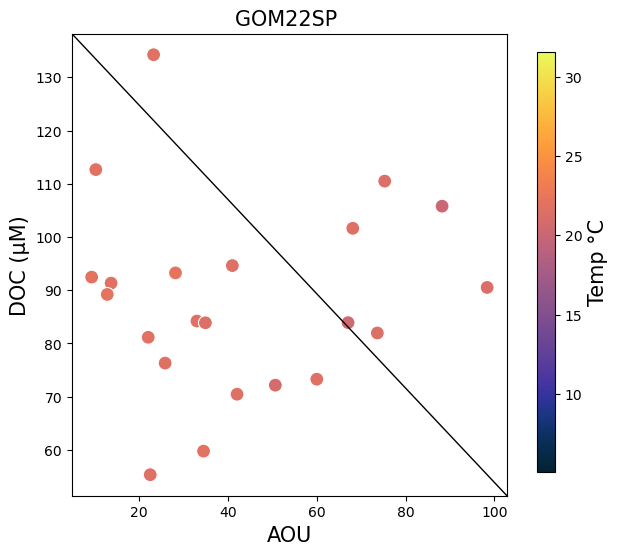

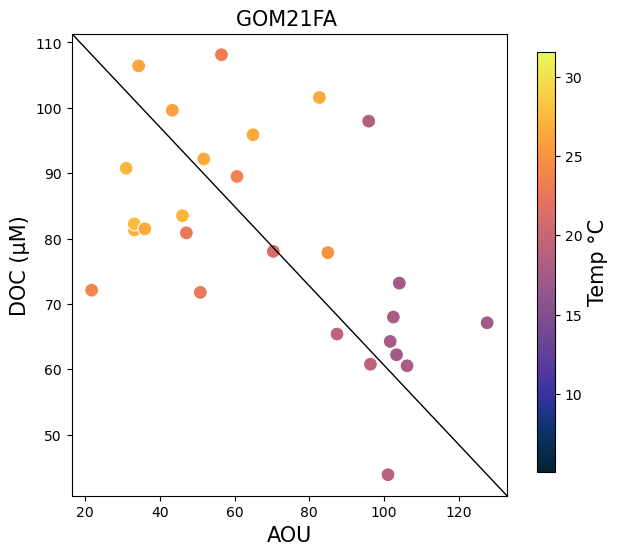

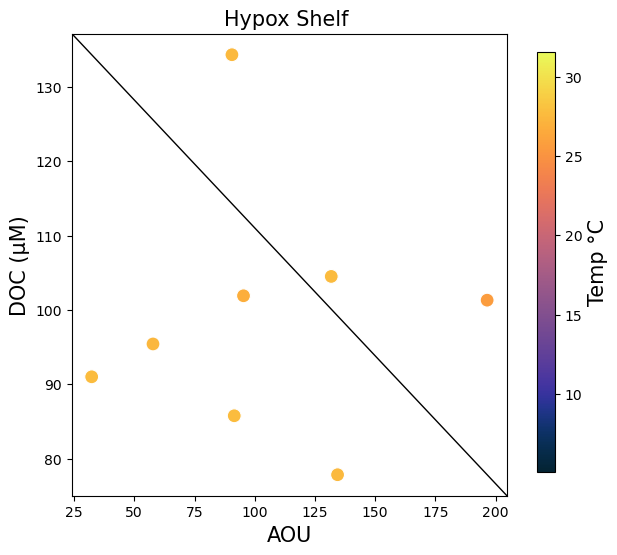

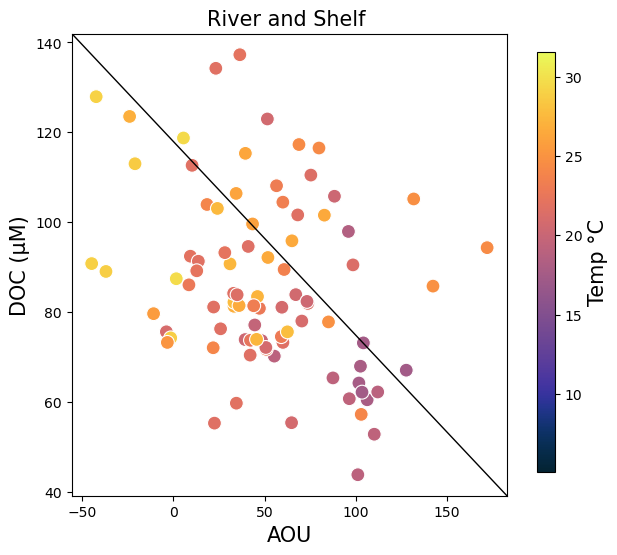

In [34]:
def xyplotcolor_line_ab(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
z_var = 'temp' 

z_var_lab = 'Temp °C' 
y_var_lab = 'DOC (µM)' 

x_var = 'aou'
x_var_lab = 'AOU'
z_var_color = cmo.thermal

titel = "High salinity (<35 PSU)"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all[data_wc_all['sal'] >= 35])

titel = "High salinity (<35 PSU) no slope"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all_no_slope[data_wc_all_no_slope['sal'] >= 35])

titel = "GOM22SU "
xyplotcolor_line_ab(data_wc_all_no_slope_sum22[data_wc_all_no_slope_sum22['sal'] >= 35])

titel = "GOM2021 "
xyplotcolor_line_ab(data_wc_all_no_slope_sum21[data_wc_all_no_slope_sum21['sal'] >= 35])

titel = "GOM22SP "
xyplotcolor_line_ab(data_wc_all_no_slope_spr22[data_wc_all_no_slope_spr22['sal'] >= 35])

titel = "GOM21FA "
xyplotcolor_line_ab(data_wc_all_no_slope_fal21[data_wc_all_no_slope_fal21['sal'] >= 35])

titel = "Hypox Shelf "
xyplotcolor_line_ab(data_wc_all_Hypox[data_wc_all_Hypox['sal'] >= 35])

titel = "River and Shelf "
xyplotcolor_line_ab(data_wc_all_Shelf[data_wc_all_Shelf['sal'] >= 35])


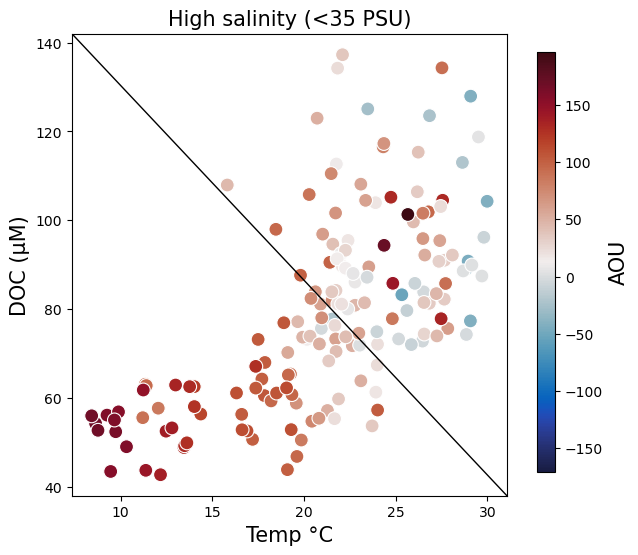

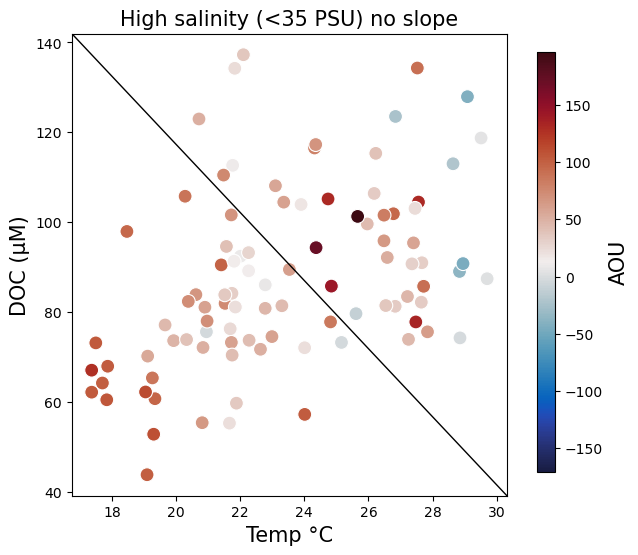

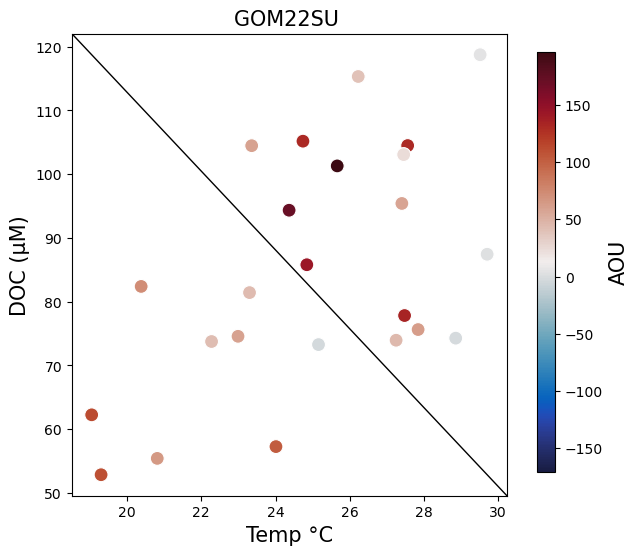

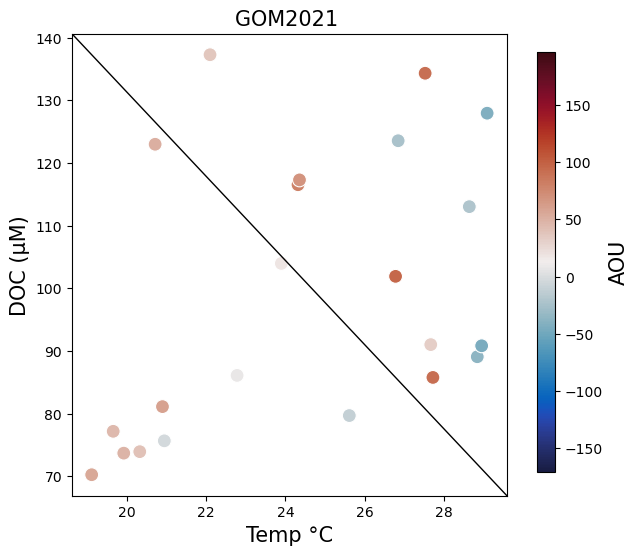

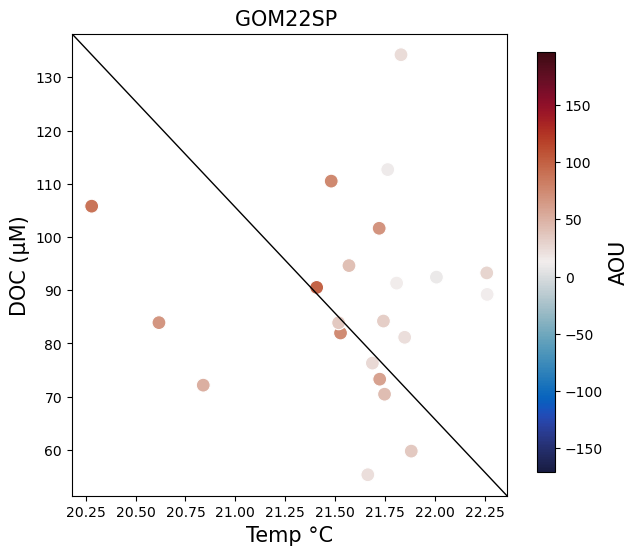

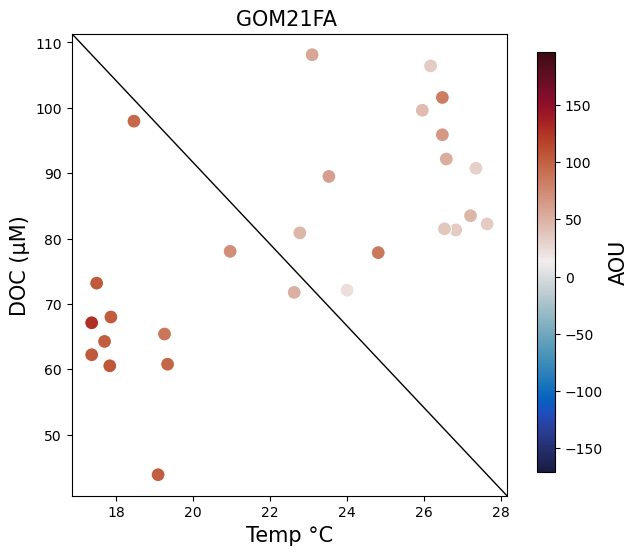

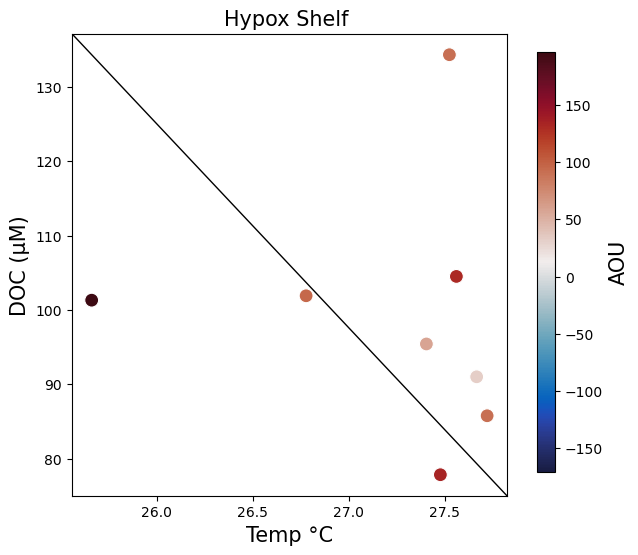

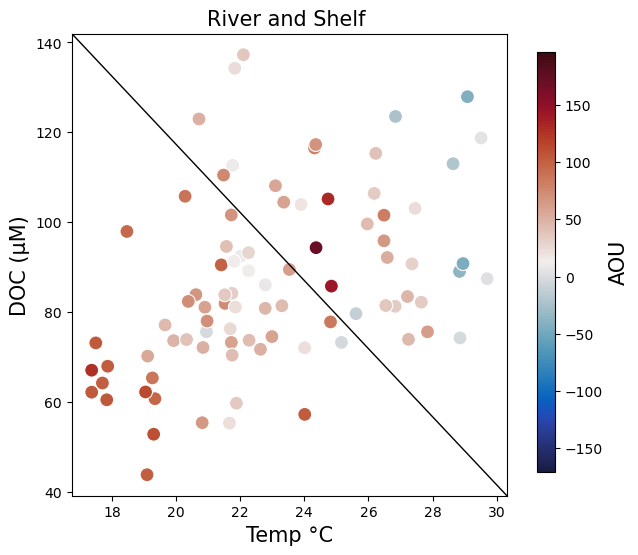

In [35]:
def xyplotcolor_line_ab_aou(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].max()*-1
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


y_var = 'NPOC_uM'
x_var = 'temp' 

x_var_lab = 'Temp °C' 
y_var_lab = 'DOC (µM)' 

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance

titel = "High salinity (<35 PSU)"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all[data_wc_all['sal'] >= 35])

titel = "High salinity (<35 PSU) no slope"
save_name = 'sal_temp_doc_wc'
xyplotcolor_line_ab(data_wc_all_no_slope[data_wc_all_no_slope['sal'] >= 35])

titel = "GOM22SU "
xyplotcolor_line_ab(data_wc_all_no_slope_sum22[data_wc_all_no_slope_sum22['sal'] >= 35])

titel = "GOM2021 "
xyplotcolor_line_ab(data_wc_all_no_slope_sum21[data_wc_all_no_slope_sum21['sal'] >= 35])

titel = "GOM22SP "
xyplotcolor_line_ab(data_wc_all_no_slope_spr22[data_wc_all_no_slope_spr22['sal'] >= 35])

titel = "GOM21FA "
xyplotcolor_line_ab(data_wc_all_no_slope_fal21[data_wc_all_no_slope_fal21['sal'] >= 35])

titel = "Hypox Shelf "
xyplotcolor_line_ab(data_wc_all_Hypox[data_wc_all_Hypox['sal'] >= 35])

titel = "River and Shelf "
xyplotcolor_line_ab(data_wc_all_Shelf[data_wc_all_Shelf['sal'] >= 35])

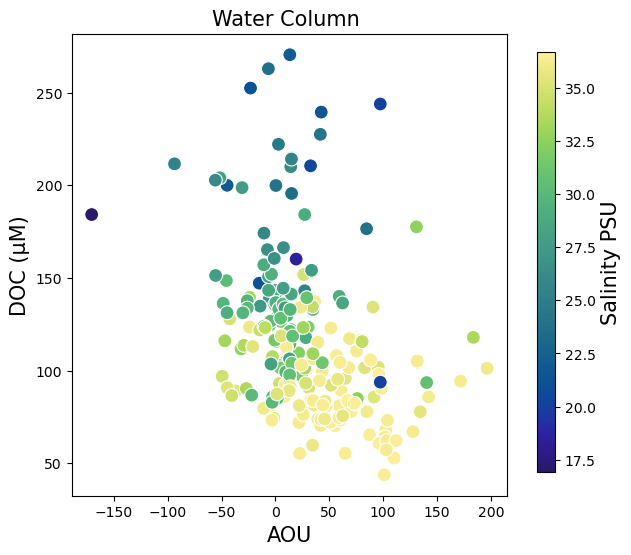

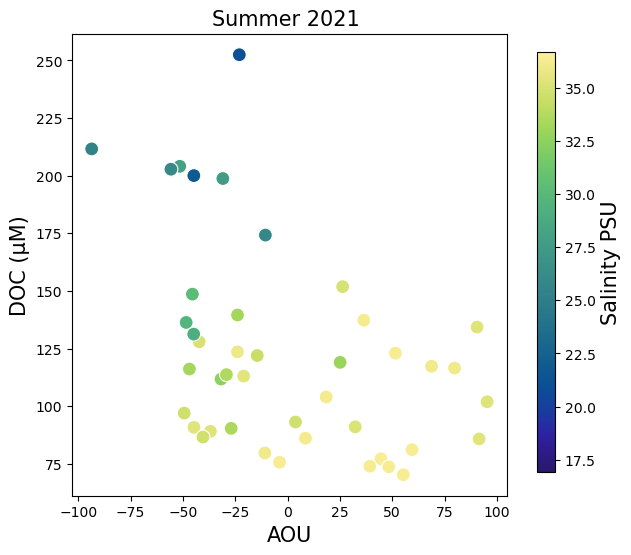

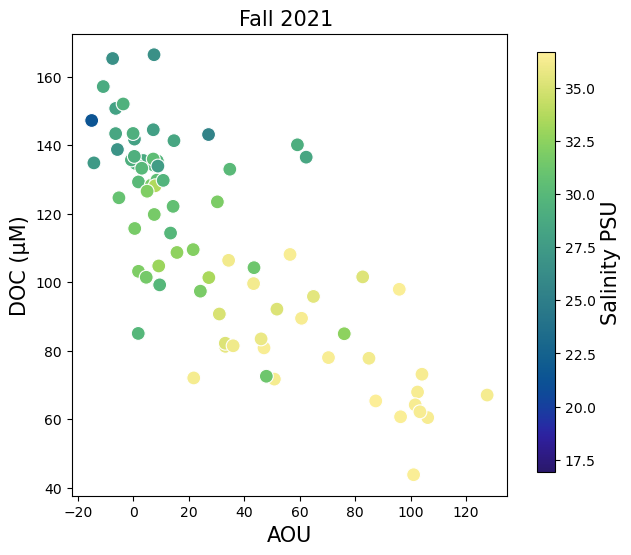

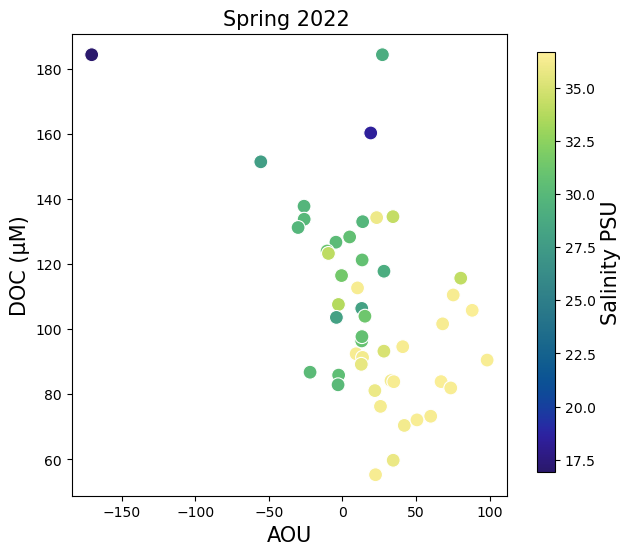

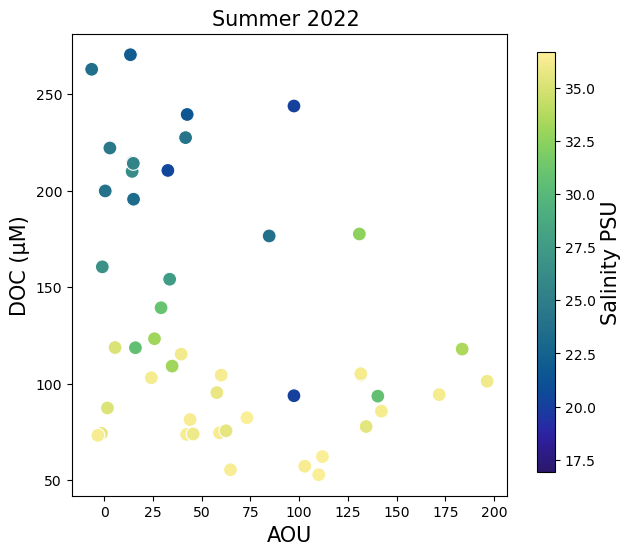

In [36]:
y_var = 'NPOC_uM'
x_var = 'aou' 

z_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'sal'
x_var_lab = 'AOU'
z_var_color = cmo.haline

titel = "Water Column "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc_all[data_wc_all['rgn'] != 'Slope'])

data_wc_all_no_slope = data_wc_all[data_wc_all['rgn'] != 'Slope']

titel = "Summer 2021 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM2021'])

titel = "Fall 2021 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM21FA'])

titel = "Spring 2022 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM22SP'])

titel = "Summer 2022 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc_all_no_slope[data_wc_all_no_slope['Campaign'] == 'GOM22SU'])

In [37]:
data_wc_all[data_wc_all['aou'] < -150]

,code,Press,ox,temp,sal,NPOC_uM,Depth,Campaign,Location,Ts,...,doc_mol_per_m3_0_to_5cm,OC_mol_per_m3_0_to_5cm,pw_flux_doc,Cox,percent_doc_resp,ratio_flux_2_stock,ratio_pw_flux_doc_2_cox,ratio_doc_2_fet,ratio_oc_2_fet,rgn
code,,,,,,,,,,,,,,,,,,,,,
St.2_GOM22SP,St.2_GOM22SP,1.544,412.96,23.4818,16.9354,184.25,0.0,GOM22SP,St.2,-0.076928,...,0.391753,54856.627611,4.176038,4683.370105,-77.8054,10.659869,0.000892,6.547223,766560.840281,Proximal Shelf


In [38]:
data_wc_all

,code,Press,ox,temp,sal,NPOC_uM,Depth,Campaign,Location,Ts,...,doc_mol_per_m3_0_to_5cm,OC_mol_per_m3_0_to_5cm,pw_flux_doc,Cox,percent_doc_resp,ratio_flux_2_stock,ratio_pw_flux_doc_2_cox,ratio_doc_2_fet,ratio_oc_2_fet,rgn
code,,,,,,,,,,,,,,,,,,,,,
St.11_GOM2021,St.11_GOM2021,946.000,250.6848,5.1116,34.9340,106.625000,946.000,GOM2021,St.11,0.051742,...,0.923105,NaN,2.277446,578.856789,127.328283,2.467158,0.003934,39.698806,NaN,Slope
St.11_GOM2021,St.11_GOM2021,621.025,196.6240,7.1954,34.9277,116.958333,621.000,GOM2021,St.11,0.037145,...,0.923105,NaN,2.277446,578.856789,85.831127,2.467158,0.003934,39.698806,NaN,Slope
St.11_GOM2021,St.11_GOM2021,180.018,198.5504,15.8122,36.1124,107.937500,180.000,GOM2021,St.11,-0.023192,...,0.923105,NaN,2.277446,578.856789,169.831693,2.467158,0.003934,39.698806,NaN,Slope
St.11_GOM2021,St.11_GOM2021,68.202,239.5744,23.4754,36.6439,125.062500,68.200,GOM2021,St.11,-0.076883,...,0.923105,NaN,2.277446,578.856789,-340.051957,2.467158,0.003934,39.698806,NaN,Slope
St.11_GOM2021,St.11_GOM2021,2.076,234.0288,29.9853,36.1905,104.270833,2.000,GOM2021,St.11,-0.122578,...,0.923105,NaN,2.277446,578.856789,-179.335853,2.467158,0.003934,39.698806,NaN,Slope
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
St.MK_GOM22SU,St.MK_GOM22SU,5.280,164.0256,31.1527,27.6493,154.166667,5.290,GOM22SU,St.MK,-0.130784,...,0.311114,NaN,3.162215,1795.146349,330.980831,10.164171,0.001762,16.579623,NaN,Hypoxic Shelf
St.MK_GOM22SU,St.MK_GOM22SU,3.597,160.2400,31.1229,24.0658,227.541667,3.600,GOM22SU,St.MK,-0.130575,...,0.311114,NaN,3.162215,1795.146349,392.811380,10.164171,0.001762,16.579623,NaN,Hypoxic Shelf
St.MK_GOM22SU,St.MK_GOM22SU,2.483,172.5728,31.5218,20.4221,210.541667,2.480,GOM22SU,St.MK,-0.133380,...,0.311114,NaN,3.162215,1795.146349,464.744416,10.164171,0.001762,16.579623,NaN,Hypoxic Shelf


                            OLS Regression Results                            
Dep. Variable:                NPOC_uM   R-squared:                       0.715
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                     385.4
Date:                Thu, 27 Jun 2024   Prob (F-statistic):           1.91e-84
Time:                        11:48:20   Log-Likelihood:                -1420.5
No. Observations:                 310   AIC:                             2847.
Df Residuals:                     307   BIC:                             2858.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    369.2896     11.341     32.563      0.0

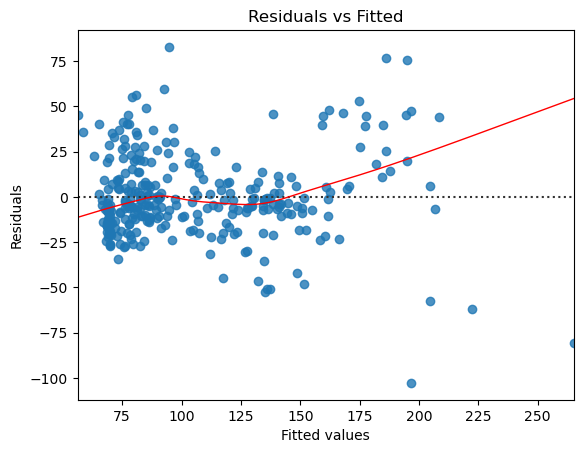

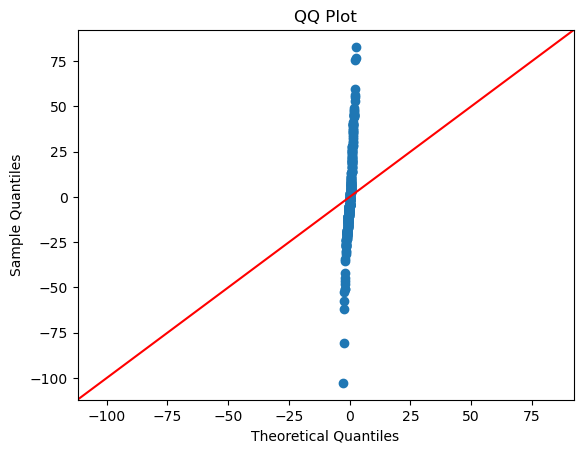

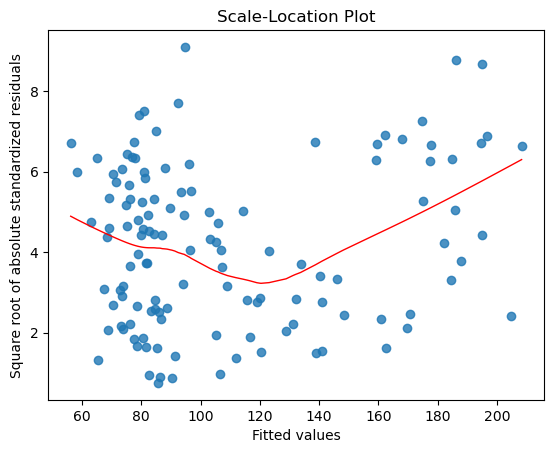

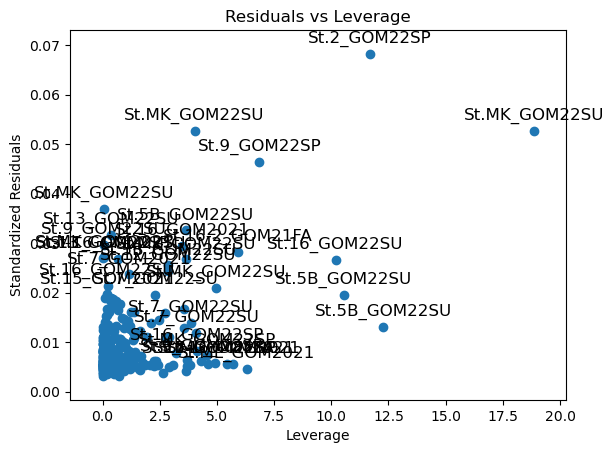

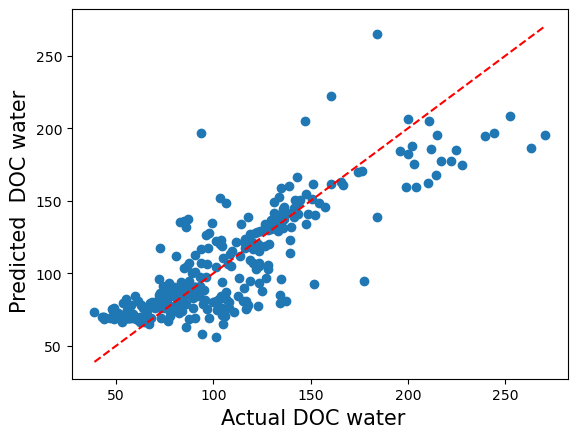

MSE: 564.8447470547259
RMSE: 23.766462653384618
NPOC_uM = 369.2896 * Intercept + -0.1633 * aou + -7.7965 * sal 


In [64]:
# Define the formula for linear regression

Val = 'NPOC_uM'

formula = 'NPOC_uM ~ aou+sal' 

#sal*aou*temp r2 = 0.663
#sal*aou*temp r2 = 0.712

data_wc_all_no_slope = data_wc_all[data_wc_all['rgn'] != 'Slope']
data_wc_all_slope = data_wc_all[data_wc_all['rgn'] == 'Slope']

data_wc_all_no_slope_sum22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SU']
data_wc_all_no_slope_sum21 = data_wc_all[data_wc_all['Campaign'] == 'GOM2021']
data_wc_all_no_slope_spr22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SP']
data_wc_all_no_slope_fal21 = data_wc_all[data_wc_all['Campaign'] == 'GOM21FA']

data_wc_no_bbl = data_wc_all[data_wc_all['group'] != 'BBL']
data_wc_no_bbl_high_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] > 35] 
data_wc_no_bbl_low_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] < 35] 

data_wc_all['max_depth'] = data_wc_all.groupby('code.1')['Depth'].transform('max')
data_wc_all['depth_from_bottom'] = data_wc_all['max_depth'] - data_wc_all['Depth']


df_OM = data_wc_all

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual DOC water  ', size = 15)
plt.ylabel('Predicted  DOC water  ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Extracting specific error metrics
mse = model.mse_resid  # Mean Squared Error
rmse = mse**0.5  # Root Mean Squared Error

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

# Print out the equation nicely
print("NPOC_uM =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()



# Make predictions
predicted = model.predict(data_wc_bbl)

# Insert predictions back to dataframe
data_wc_bbl['pred_doc'] = predicted

scatter = plt.scatter(data_wc_bbl['NPOC_uM'], data_wc_bbl['pred_doc'], c=data_wc_bbl['pw_flux_doc'])
plt.xlabel(r'Actual DOC (µM)')
plt.ylabel('Predicted DOC (µM)')
plt.title('')
plt.plot([data_wc['NPOC_uM'].min(), data_wc['NPOC_uM'].max()], 
         [data_wc['NPOC_uM'].min(), data_wc['NPOC_uM'].max()], 'r--')
plt.colorbar(scatter, label='DOC Flux')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("NPOC_uM =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()

# Make predictions
predicted = model.predict(data_wc_bbl)

# Insert predictions back to dataframe
data_wc_bbl['pred_doc'] = predicted

scatter = plt.scatter(data_wc_bbl['NPOC_uM'], data_wc_bbl['pred_doc'], c=data_wc_bbl['pw_flux_doc'])
plt.xlabel(r'Actual DOC (µM)')
plt.ylabel('Predicted DOC (µM)')
plt.title('')
plt.plot([data_wc['NPOC_uM'].min(), data_wc['NPOC_uM'].max()], 
         [data_wc['NPOC_uM'].min(), data_wc['NPOC_uM'].max()], 'r--')
plt.colorbar(scatter, label='DOC Flux')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("NPOC_uM =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()


# Define the formula for linear regression

Val = 'NPOC_uM'

formula = 'NPOC_uM ~ aou*temp*Depth' 


data_wc_all_no_slope = data_wc_all[data_wc_all['rgn'] != 'Slope']
data_wc_all_slope = data_wc_all[data_wc_all['rgn'] == 'Slope']

data_wc_all_no_slope_sum22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SU']
data_wc_all_no_slope_sum21 = data_wc_all[data_wc_all['Campaign'] == 'GOM2021']
data_wc_all_no_slope_spr22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SP']
data_wc_all_no_slope_fal21 = data_wc_all[data_wc_all['Campaign'] == 'GOM21FA']

data_wc_no_bbl = data_wc_all[data_wc_all['group'] != 'BBL']
data_wc_no_bbl_high_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] > 35] 
data_wc_no_bbl_low_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] < 35] 


df_OM = data_wc_no_bbl_high_sal

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual DOC water  ', size = 15)
plt.ylabel('Predicted  DOC water  ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("NPOC_uM =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\2636048294.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'high' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  data_wc_all.loc[data_wc_all['Campaign'] == 'GOM2021', 'flow_redg'] = 'high'
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\2636048294.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl.loc[data_wc_bbl['Campaign'] == 'GOM2021', 'flow_redg_number'] = 0


                            OLS Regression Results                            
Dep. Variable:                NPOC_uM   R-squared:                       0.825
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     177.1
Date:                Thu, 27 Jun 2024   Prob (F-statistic):          4.92e-109
Time:                        10:49:00   Log-Likelihood:                -1345.2
No. Observations:                 310   AIC:                             2708.
Df Residuals:                     301   BIC:                             2742.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept         -161.3522     67.234  

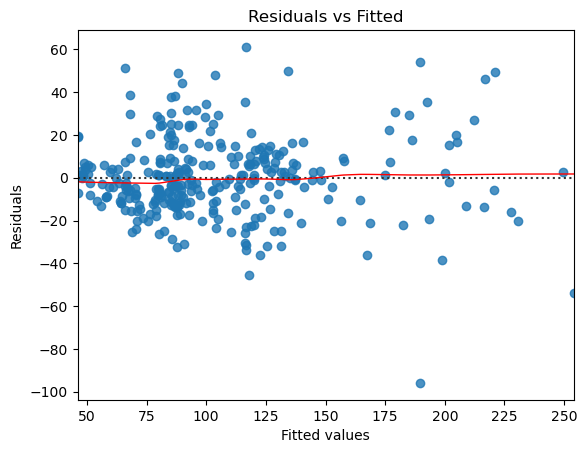

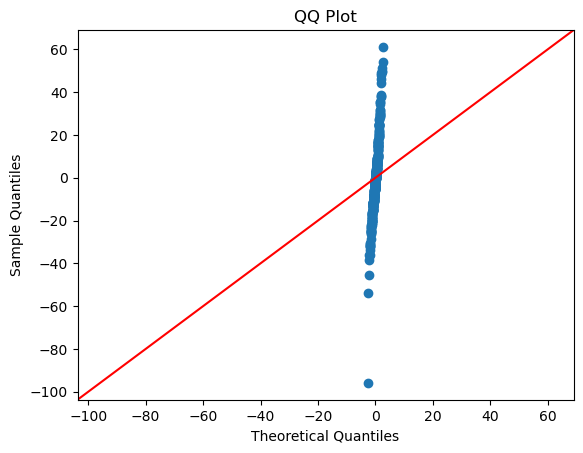

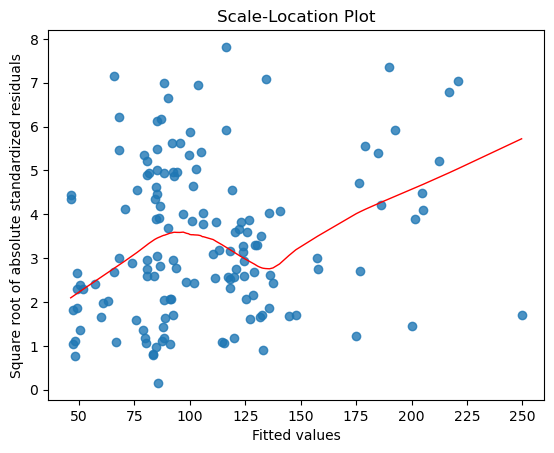

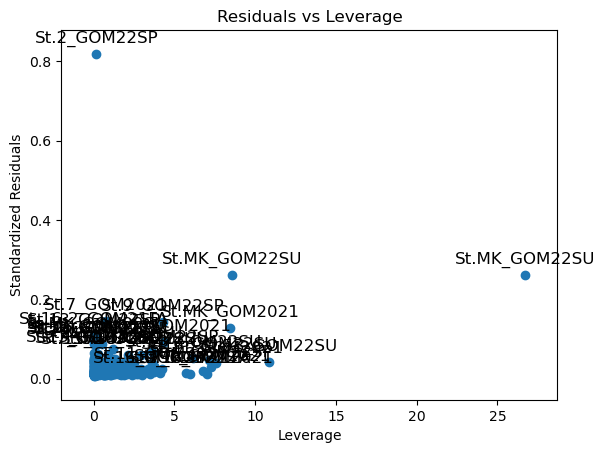

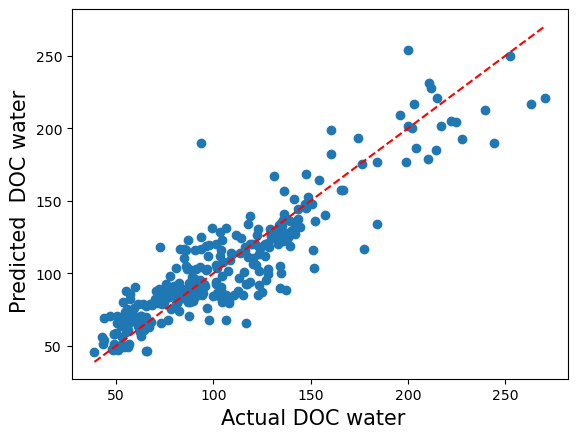

MSE: 354.441799846564
RMSE: 18.826624759806627
NPOC_uM = -161.3522 * Intercept + 6.7003 * sal + 6.4574 * aou + -0.1912 * sal:aou + 20.2972 * temp + -0.5506 * sal:temp + -0.2597 * aou:temp + 0.0077 * sal:aou:temp + -8.4822 * flow_redg_number 


In [40]:
# Define the formula for linear regression

Val = 'NPOC_uM'

formula = 'NPOC_uM ~ sal*aou*temp+flow_redg_number' 

data_wc_all['flow_redg'] = np.nan
data_wc_all['flow_redg_number'] = np.nan


data_wc_all.loc[data_wc_all['Campaign'] == 'GOM2021', 'flow_redg'] = 'high'
data_wc_all.loc[data_wc_all['Campaign'] == 'GOM22SP', 'flow_redg'] = 'high'
data_wc_all.loc[data_wc_all['Campaign'] == 'GOM22SU', 'flow_redg'] = 'low'
data_wc_all.loc[data_wc_all['Campaign'] == 'GOM21FA', 'flow_redg'] = 'low'


data_wc_all.loc[data_wc_all['Campaign'] == 'GOM2021', 'flow_redg_number'] = 0
data_wc_all.loc[data_wc_all['Campaign'] == 'GOM22SP', 'flow_redg_number'] = 0
data_wc_all.loc[data_wc_all['Campaign'] == 'GOM22SU', 'flow_redg_number'] = 1
data_wc_all.loc[data_wc_all['Campaign'] == 'GOM21FA', 'flow_redg_number'] = 1


data_wc_bbl.loc[data_wc_bbl['Campaign'] == 'GOM2021', 'flow_redg_number'] = 0
data_wc_bbl.loc[data_wc_bbl['Campaign'] == 'GOM22SP', 'flow_redg_number'] = 0
data_wc_bbl.loc[data_wc_bbl['Campaign'] == 'GOM22SU', 'flow_redg_number'] = 1
data_wc_bbl.loc[data_wc_bbl['Campaign'] == 'GOM21FA', 'flow_redg_number'] = 1



data_wc_all_sum22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SU'] # 0.875
data_wc_all_sum21 = data_wc_all[data_wc_all['Campaign'] == 'GOM2021'] # 0.753
data_wc_all_spr22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SP'] # 0.647
data_wc_all_fal21 = data_wc_all[data_wc_all['Campaign'] == 'GOM21FA'] #  0.875
data_wc_all #0.814 
#with flow redge 0.820

data_wc_no_bbl = data_wc_all[data_wc_all['group'] != 'BBL']
data_wc_no_bbl_high_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] > 35] 
data_wc_no_bbl_low_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] < 35] 


df_OM = data_wc_all

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual DOC water  ', size = 15)
plt.ylabel('Predicted  DOC water  ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()

# Extracting specific error metrics
mse = model.mse_resid  # Mean Squared Error
rmse = mse**0.5  # Root Mean Squared Error

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

# Print out the equation nicely
print("NPOC_uM =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\909602322.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['NPOC_predict'] = -161.3522 + (-8.4822 * data_wc_bbl['flow_redg_number']) + (6.7003 * data_wc_bbl['sal']) + (6.4574 * data_wc_bbl['aou']) + (-0.1912  * data_wc_bbl['sal'] * data_wc_bbl['aou']) + (20.2972  * data_wc_bbl['temp']) + (-0.5506 * data_wc_bbl['sal'] * data_wc_bbl['temp']) + (-0.2597 * data_wc_bbl['aou'] * data_wc_bbl['temp']) + (0.0077 * data_wc_bbl['sal'] * data_wc_bbl['aou'] * data_wc_bbl['temp'])


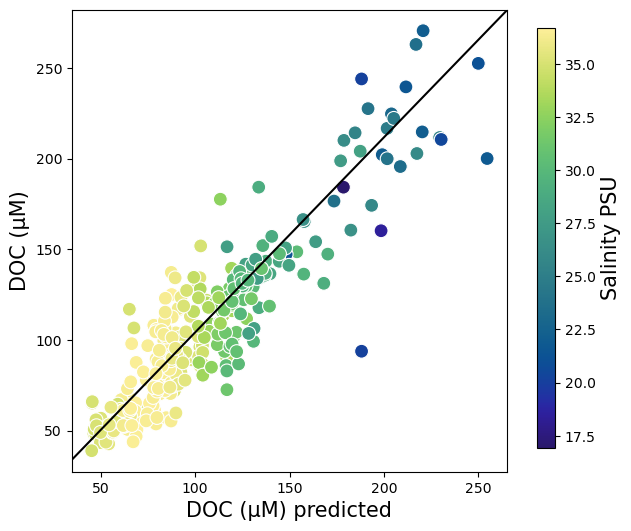

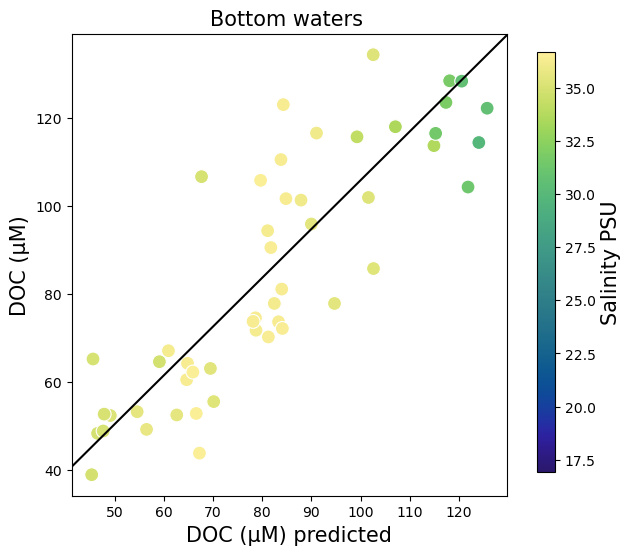

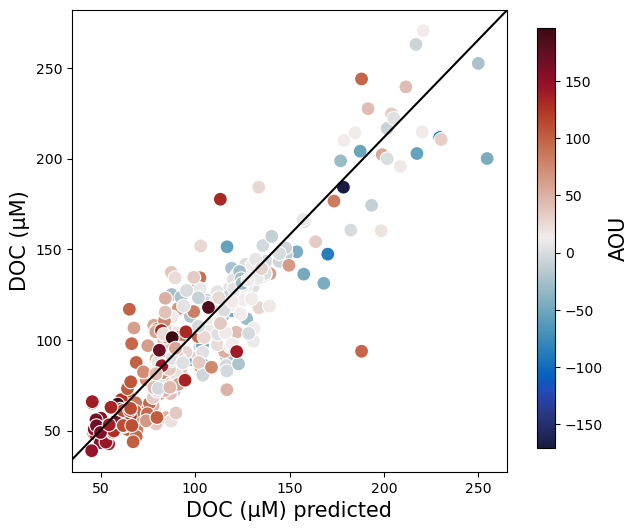

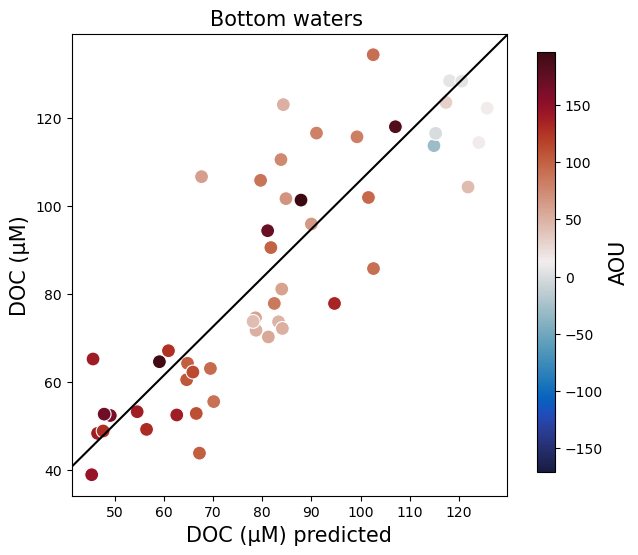

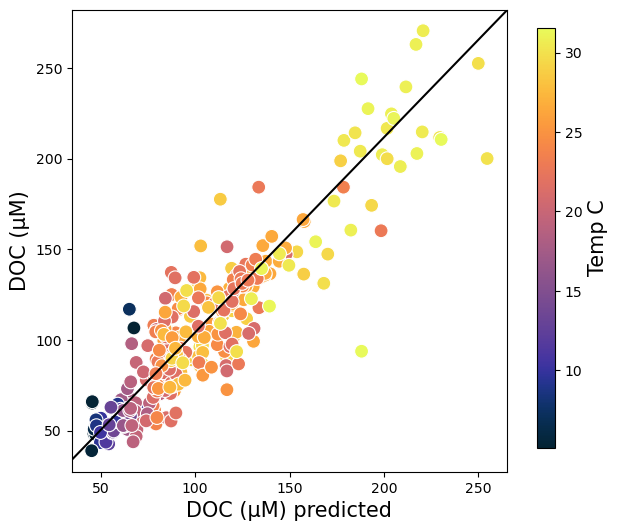

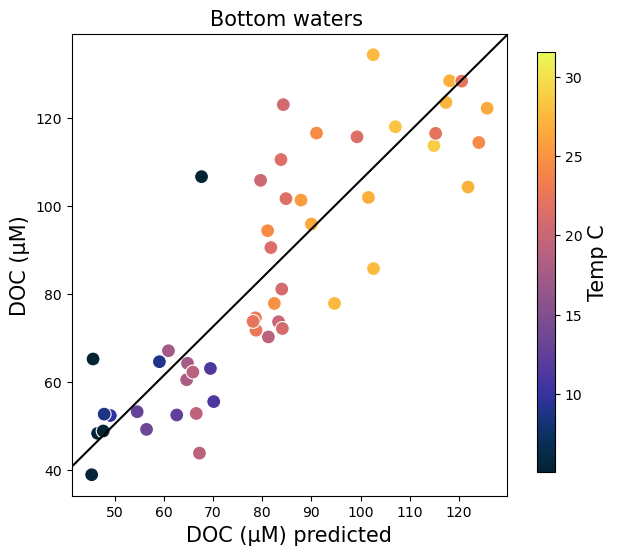

In [41]:

data_wc_bbl['NPOC_predict'] = -161.3522 + (-8.4822 * data_wc_bbl['flow_redg_number']) + (6.7003 * data_wc_bbl['sal']) + (6.4574 * data_wc_bbl['aou']) + (-0.1912  * data_wc_bbl['sal'] * data_wc_bbl['aou']) + (20.2972  * data_wc_bbl['temp']) + (-0.5506 * data_wc_bbl['sal'] * data_wc_bbl['temp']) + (-0.2597 * data_wc_bbl['aou'] * data_wc_bbl['temp']) + (0.0077 * data_wc_bbl['sal'] * data_wc_bbl['aou'] * data_wc_bbl['temp'])  
data_wc_all['NPOC_predict'] = -161.3522 + (-8.4822 * data_wc_all['flow_redg_number']) + (6.7003 * data_wc_all['sal']) + (6.4574 * data_wc_all['aou']) + (-0.1912  * data_wc_all['sal'] * data_wc_all['aou']) + (20.2972  * data_wc_all['temp']) + (-0.5506 * data_wc_all['sal'] * data_wc_all['temp']) + (-0.2597 * data_wc_all['aou'] * data_wc_all['temp']) + (0.0077 * data_wc_all['sal'] * data_wc_all['aou'] * data_wc_all['temp'])  

#data_wc_bbl['NPOC_predict'] = 275.6898 + (-11.1674 * data_wc_bbl['flow_redg_number']) + (-7.2830 * data_wc_bbl['sal']) + (0.1655 * data_wc_bbl['aou']) + (3.2215  * data_wc_bbl['temp']) + (-0.0056 * data_wc_bbl['temp'] * data_wc_bbl['aou'])
#data_wc_all['NPOC_predict'] = 275.6898 + (-11.1674 * data_wc_all['flow_redg_number']) + (-7.2830 * data_wc_all['sal']) + (0.1655 * data_wc_all['aou']) + (3.2215  * data_wc_all['temp']) + (-0.0056 * data_wc_all['temp'] * data_wc_all['aou'])

#NPOC_uM = -192.9358  + 7.7244 * sal + 6.0903 * aou + -0.1823 * sal:aou + 21.0723 * temp + -0.5817 * sal:temp + -0.2470 * aou:temp + 0.0073 * sal:aou:temp 


def xyplotcolor_fluxes_model(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    axes.axline(( data[x_var].min(), data[x_var].min()), (data[x_var].max(), data[y_var].max()), linewidth=1.5, color='black')
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'NPOC_predict' 

y_var_lab = 'DOC (µM)'
x_var_lab = 'DOC (µM) predicted'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = ""
save_name = 'DOC_model_sal_temp_aou'
xyplotcolor_fluxes_model(data_wc_all)

titel = "Bottom waters "
save_name = 'sal_temp_doc_wc'
xyplotcolor_fluxes_model(data_wc_bbl)

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance

titel = ""
save_name = 'DOC_model_sal_temp_aou'
xyplotcolor_fluxes_model(data_wc_all)


titel = "Bottom waters "
save_name = 'sal_temp_doc_wc'
xyplotcolor_fluxes_model(data_wc_bbl)


z_var = 'temp'
z_var_lab = 'Temp C'
z_var_color = cmo.thermal

titel = ""
save_name = 'DOC_model_sal_temp_aou'
xyplotcolor_fluxes_model(data_wc_all)


titel = "Bottom waters "
save_name = 'sal_temp_doc_wc'
xyplotcolor_fluxes_model(data_wc_bbl)


In [42]:
data_wc_all.columns

Index(['code', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth', 'Campaign',
       'Location', 'Ts', 'density_kg_m3', 'density_kg_l', 'ox_umol_kg',
       'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'rgn', 'max_depth', 'depth_from_bottom', 'flow_redg',
       'flow_redg_number', 'pred', 'NPOC_predict'],
      dtype='object')

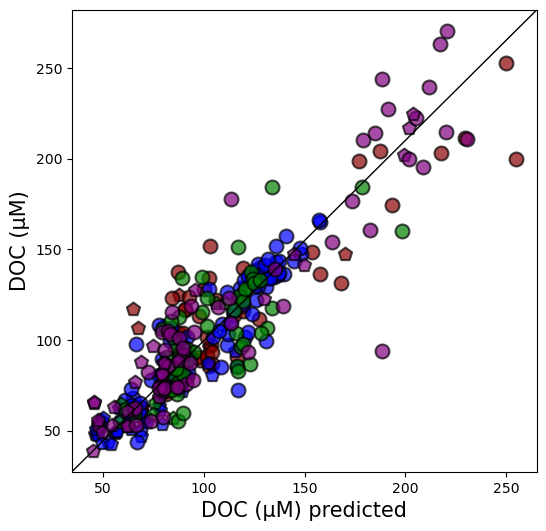

In [43]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'St.11': 'p',
    'St.13': 'p',
    'St.15': 'p',
    'St.12': 'p'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'Location']]
    subcat = data['Campaign'].tolist()
    subrgn = data['Location'].tolist()
    
    for campaign in data[z_var].unique():
        for region in data['Location'].unique():
            subset = data[(data[z_var] == campaign) & (data['Location'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    axes.axline((data[x_var].min(), data[y_var].min()), (data[x_var].max(), data[y_var].max()), linewidth=1, color='black')


    #axes.set_ylim(40, 180)
    #axes.set_xlim(25, 37)

    axes.set_title(titel, size=15)
    
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'NPOC_uM'
x_var = 'NPOC_predict' 

y_var_lab = 'DOC (µM)'
x_var_lab = 'DOC (µM) predicted'

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = ""
save_name = 'model_outputs'
xyplotcolor_cat_color(data_wc_all)

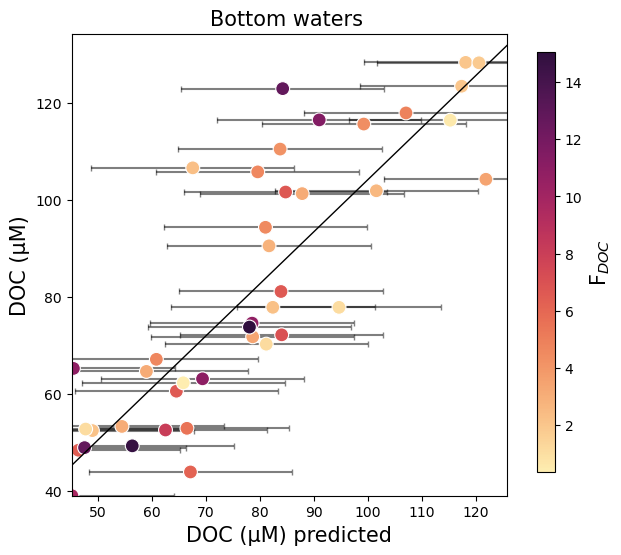

In [44]:
def xyplotcolor_fluxes_model(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var, z_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    # Add error bars
    error_value = rmse
    axes.errorbar(data[x_var], data[y_var], xerr=error_value, linestyle='None', color='black', capsize=2, alpha = .5, zorder=1)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax, zorder=2)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(data_wc_bbl[x_var].min(), data_wc_bbl[x_var].max())
    axes.set_ylim(data_wc_bbl[y_var].min(), data_wc_bbl[y_var].max())

    axes.set_title(titel, size = 15)

    axes.axline(( data_wc_all[x_var].min(), data_wc_all[x_var].min()), (data_wc_all[x_var].max(), data_wc_all[y_var].max()), linewidth=1, color='black')
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'NPOC_predict' 

y_var_lab = 'DOC (µM)'
x_var_lab = 'DOC (µM) predicted'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = "Bottom waters "
save_name = 'sal_temp_doc_wc'
xyplotcolor_fluxes_model(data_wc_bbl)


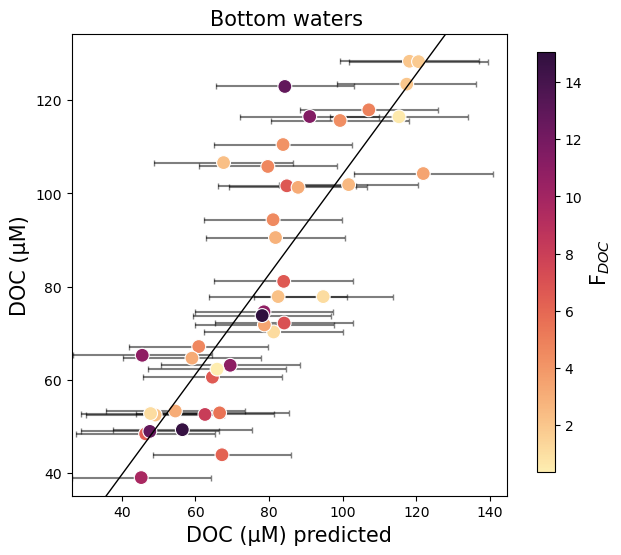

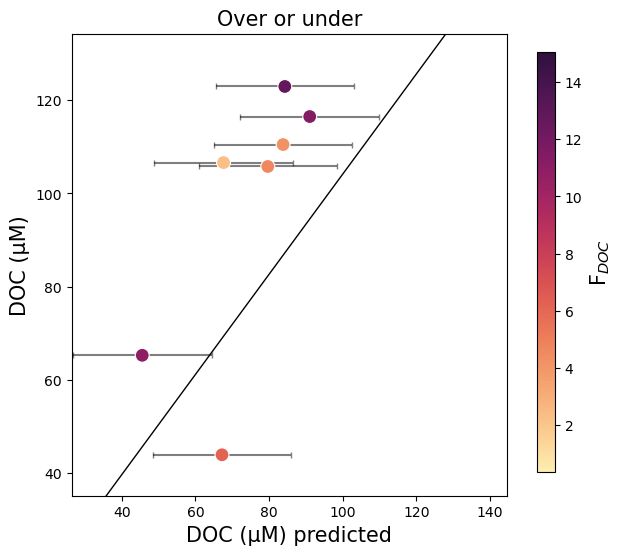

In [45]:

def xyplotcolor_fluxes_model(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var, z_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    # Add error bars
    error_value = rmse
    axes.errorbar(data[x_var], data[y_var], xerr=error_value, linestyle='None', color='black', capsize=2, alpha = .5, zorder=1)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax, zorder=2)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_ylim(data_wc_bbl[y_var].min()*.9, data_wc_bbl[y_var].max())
    axes.set_xlim(data_wc_bbl[x_var].min()-rmse, data_wc_bbl[x_var].max()+rmse)

    axes.set_title(titel, size = 15)

    axes.axline(( data_wc_all[x_var].min(), data_wc_all[x_var].min()), (data_wc_all[x_var].max(), data_wc_all[y_var].max()), linewidth=1, color='black')
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'NPOC_predict' 

y_var_lab = 'DOC (µM)'
x_var_lab = 'DOC (µM) predicted'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = "Bottom waters "
save_name = 'sal_temp_doc_wc'
xyplotcolor_fluxes_model(data_wc_bbl)


titel = "Over or under"
save_name = 'sal_temp_doc_wc'

xyplotcolor_fluxes_model(data_wc_bbl[abs(data_wc_bbl['NPOC_predict'] - data_wc_bbl['NPOC_uM']) >= rmse])



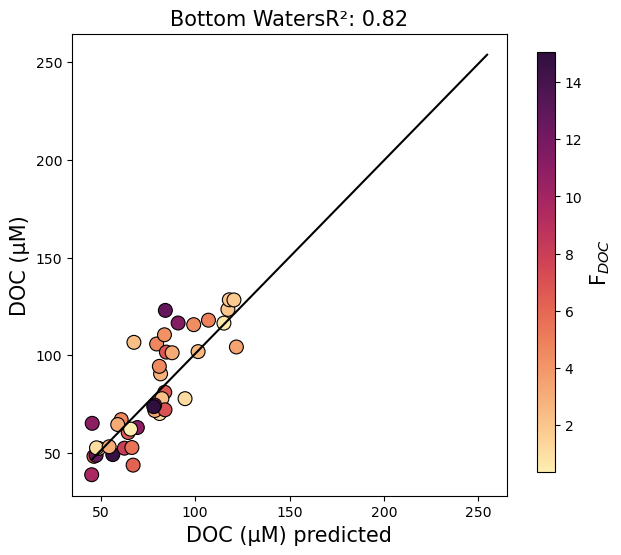

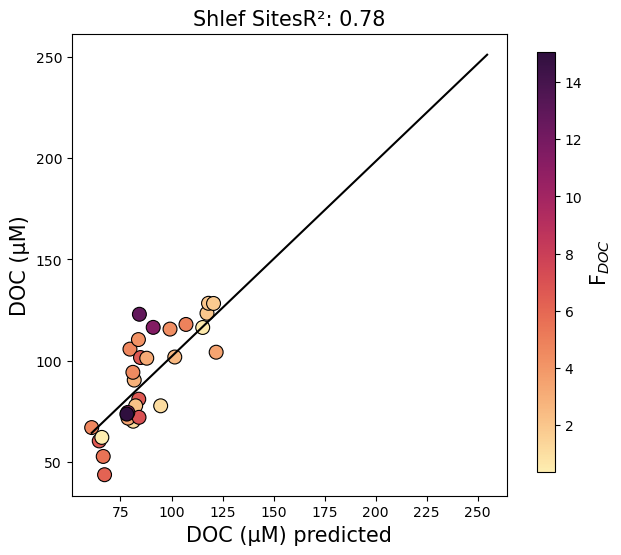

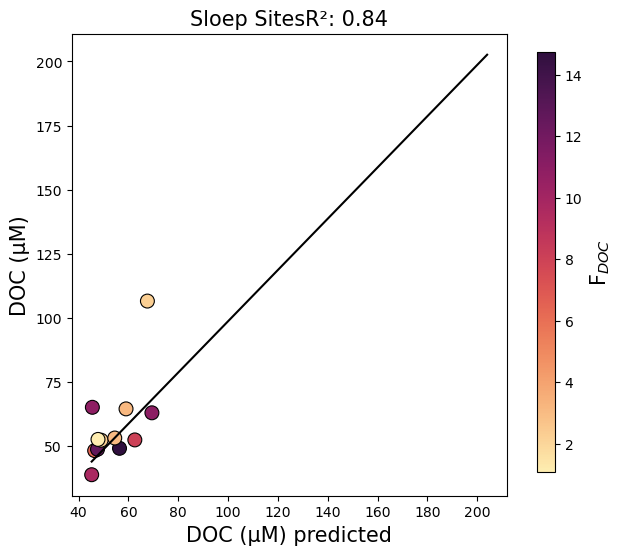

In [46]:
def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var]]
    #colors = data[z_var].astype(float)

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    vmin = data2[z_var].min()
    vmax = data2[z_var].max() 
    
    #sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = 'black', ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    

y_var = 'NPOC_uM'
x_var = 'NPOC_predict' 

y_var_lab = 'DOC (µM)'
x_var_lab = 'DOC (µM) predicted'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = "Bottom Waters"
save_name = 'sal_temp_doc_wc'
xyplotcolor_2data(data_wc_all, data_wc_bbl)

titel = "Shlef Sites"
save_name = 'sal_temp_doc_wc'
xyplotcolor_2data(data_wc_all[data_wc_all['rgn'] != 'Slope'], data_wc_bbl[data_wc_bbl['rgn'] != 'Slope'])

titel = "Sloep Sites"
save_name = 'sal_temp_doc_wc'
xyplotcolor_2data(data_wc_all[data_wc_all['rgn'] == 'Slope'], data_wc_bbl[data_wc_bbl['rgn'] == 'Slope'])



In [47]:
data_wc_bbl['pw_flux_doc']

code
St.11_GOM2021       2.277446
St.13_GOM2021            NaN
St.14_GOM2021       1.147054
St.15_GOM2021      10.964420
St.16_GOM2021      12.783071
St.2_GOM2021        6.635362
St.4_GOM2021             NaN
St.5B_GOM2021            NaN
St.7_GOM2021       11.408700
St.9_GOM2021             NaN
St.MK_GOM2021       2.585098
St.ML_GOM2021            NaN
St.11_GOM21FA       6.453406
St.12_GOM21FA      12.712592
St.13_GOM21FA       2.156332
St.14_GOM21FA       6.610491
St.14.5_GOM21FA          NaN
St.15_GOM21FA      14.752037
St.16_GOM21FA       3.391259
St.16-2_GOM21FA          NaN
St.2_GOM21FA        6.178479
St.4_GOM21FA        1.981856
St.5B_GOM21FA       1.978069
St.6_GOM21FA             NaN
St.7_GOM21FA        2.235714
St.9_GOM21FA        4.639452
St.MK_GOM21FA       3.453165
St.MK-2_GOM21FA          NaN
St.13_GOM22SP       3.154154
St.14_GOM22SP       4.614289
St.15_GOM22SP       8.065378
St.16_GOM22SP       2.871026
St.2_GOM22SP        4.176038
St.4_GOM22SP        0.582342
St.5B_GOM

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\2195642269.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['DOC_pred_error'] = data_wc_bbl['NPOC_uM'] - data_wc_bbl['NPOC_predict']


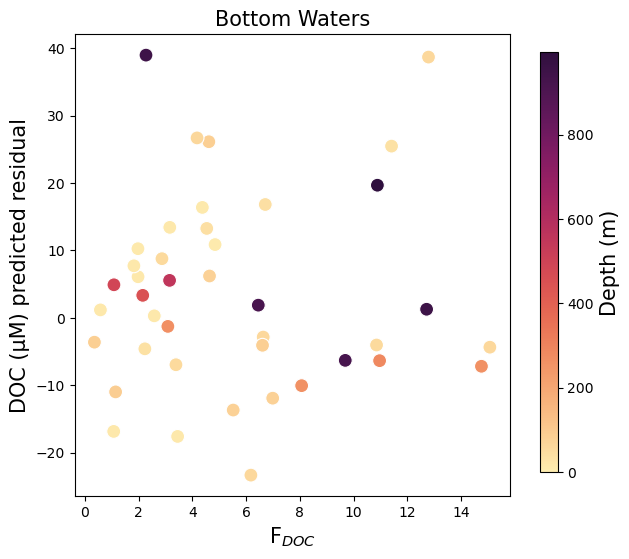

In [48]:
data_wc_bbl['DOC_pred_error'] = data_wc_bbl['NPOC_uM'] - data_wc_bbl['NPOC_predict']
data_wc_all['DOC_pred_error'] = data_wc_all['NPOC_uM'] - data_wc_all['NPOC_predict']



y_var = 'DOC_pred_error'
x_var = 'pw_flux_doc' 

y_var_lab = 'DOC (µM) predicted residual'
x_var_lab = 'F$_{DOC}$'

z_var = 'Depth'
z_var_lab = 'Depth (m)'
z_var_color = cmo.matter

titel = "Bottom Waters"
save_name = 'sal_temp_doc_wc'
xyplotcolor_noline(data_wc_bbl)


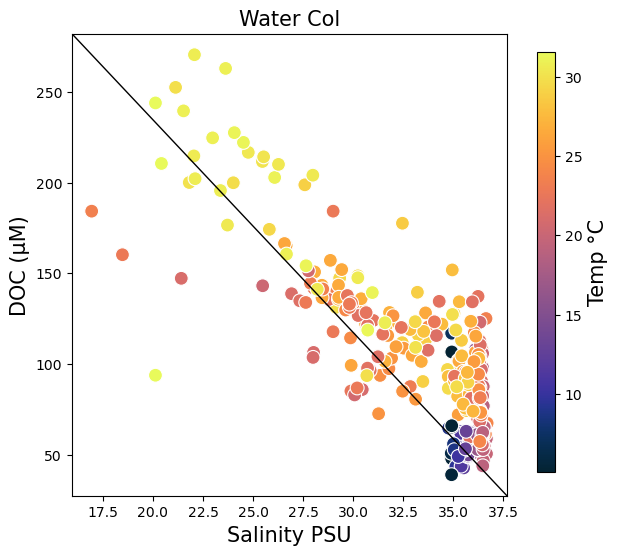

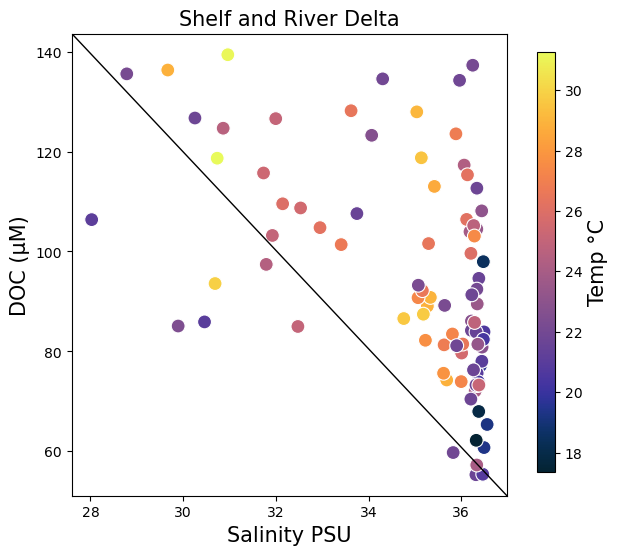

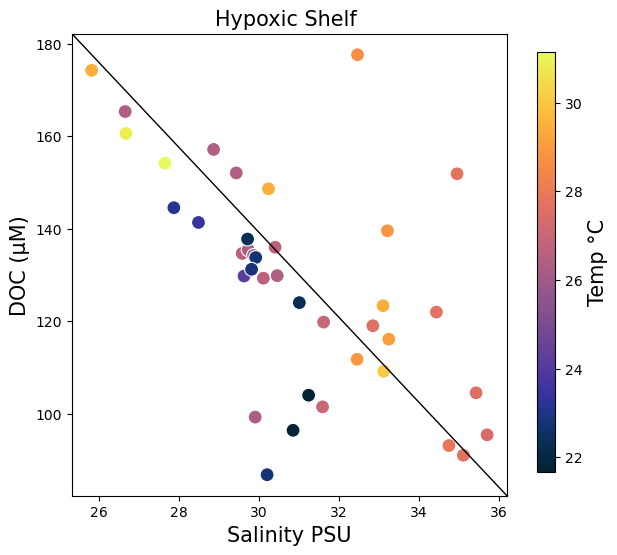

In [49]:

def xyplotcolor_noline_mix(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'temp'
z_var_lab = 'Temp °C'
z_var_color = cmo.thermal


titel = "Water Col"
save_name = 'Conserv_mix_thermal'
xyplotcolor_noline_mix(data_wc_all)

titel = "Shelf and River Delta"
save_name = 'Conserv_mix_rive_shel'
xyplotcolor_noline_mix(data_wc[data_wc['rgn'].isin(['Proximal Shelf', 'Distal Shelf'])])

titel = "Hypoxic Shelf "
save_name = 'Conserv_mix_rive_shel'
xyplotcolor_noline_mix(data_wc[data_wc['rgn'].isin(['Hypoxic Shelf'])])


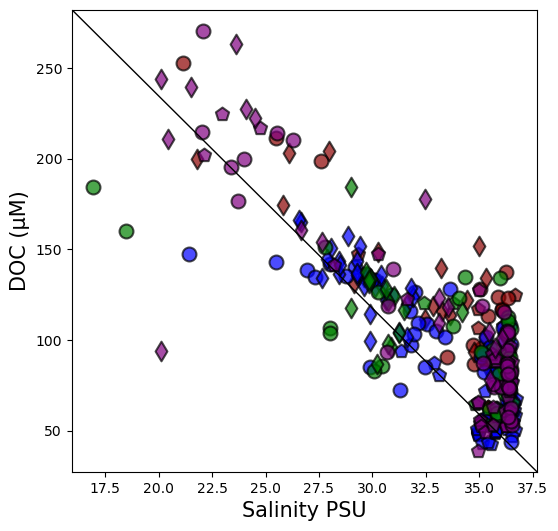

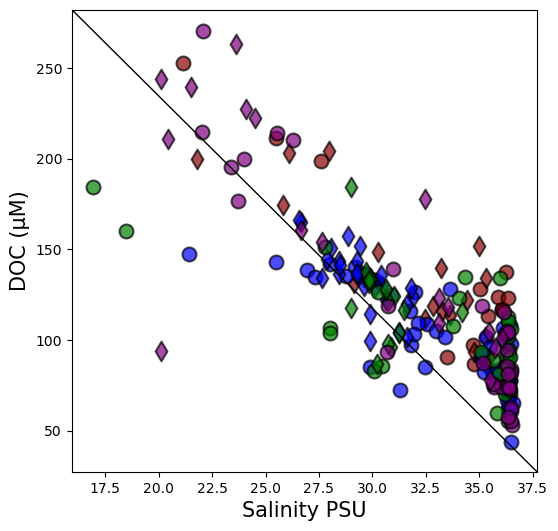

ValueError: Found array with 0 sample(s) (shape=(0, 1)) while a minimum of 1 is required by LinearRegression.

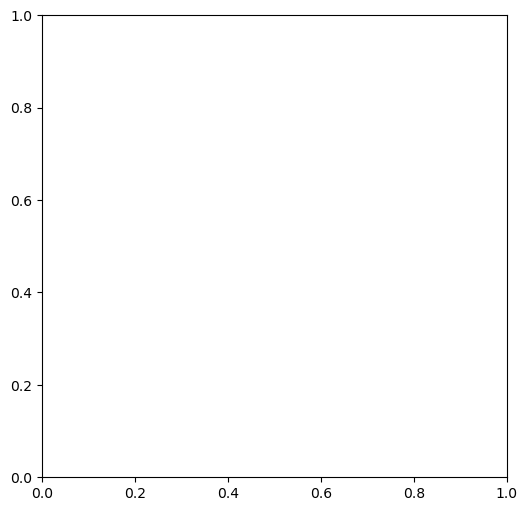

In [50]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Shelf': 'o',
    'River Delta': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    axes.axline(( data_wc_all[x_var].min(), data_wc_all[y_var].max()), (data_wc_all[x_var].max(), data_wc_all[y_var].min()), linewidth=1, color='black')


    axes.set_title(titel, size=15)
    
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = ""
save_name = 'Conservative_mixing_model'
xyplotcolor_cat_color(data_wc_all)

titel = ""
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc_all[data_wc_all['rgn'] != 'Slope'])

titel = "Shelf "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc_all[data_wc_all['rgn'] == 'Shelf'])

titel = "River Delta "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc_all[data_wc_all['rgn'] == 'River Delta'])

titel = "Hypoxic Shelf "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc_all[data_wc_all['rgn'] == 'Hypoxic Shelf'])

titel = "Slope "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc_all[data_wc_all['rgn'] == 'Slope'])

In [ ]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')


    axes.set_ylim(40, 180)
    axes.set_xlim(25, 37)

    axes.set_title(titel, size=15)
    
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = ""
save_name = 'Conservative_mixing_model'
xyplotcolor_cat_color(data_wc[data_wc['rgn'] != 'Slope'])

titel = "GOM2021 "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc[data_wc['Campaign'] == 'GOM2021'])

titel = "GOM21FA "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc[data_wc['Campaign'] == 'GOM21FA'])

titel = "GOM22SP "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc[data_wc['Campaign'] == 'GOM22SP'])

titel = "GOM22SU "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc[data_wc['Campaign'] == 'GOM22SU'])

In [ ]:
titel = ""
save_name = 'Conservative_mixing_model'
xyplotcolor_cat_color(data_wc_surf[data_wc_surf['rgn'] != 'Slope'])

In [ ]:


def xyplotcolor_flux_catagoty(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor='black', 
                linewidth=1, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    #axes.set_ylim(0, 180)
    #axes.set_xlim(25, 37)

    axes.set_title(titel, size=15)
    
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


z_var = 'Campaign'
z_var_lab = 'Camp'

y_var = 'NPOC_uM'
y_var_lab = 'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

w_var = 'aou'
w_var_lab = 'AOU'
w_var_color = cmo.matter

titel = " "
save_name = 'flux_bottom_water_seas_rgn'
xyplotcolor_flux_catagoty(data_wc_bbl)

In [ ]:


def xyplotcolor_flux_catagoty(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var, w_var])
    data = sub[[x_var, y_var, z_var, w_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    vmin = df[w_var].min()
    vmax = df[w_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            wcolor = subset[w_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                s=100, 
                edgecolor=color_map.get(campaign, 'grey'), 
                c=wcolor, 
                cmap=z_var_color, 
                vmin=vmin, vmax=vmax,
                linewidth=1.25, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #axes.axline(( data[x_var].min(), data[y_var].max()), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    #axes.set_ylim(0, 180)
    #axes.set_xlim(25, 37)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=w_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(w_var_lab, size=15)

    axes.set_title(titel, size=15)
    
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


z_var = 'Campaign'
z_var_lab = 'Camp'

y_var = 'NPOC_uM'
y_var_lab = 'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

w_var = 'aou'
w_var_lab = 'AOU'
w_var_color = cmo.matter

titel = " "
save_name = 'flux_bottom_water_seas_rgn'
xyplotcolor_flux_catagoty(data_wc_bbl)

In [ ]:
data_wc_bbl

color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

color_edge = {
    'Slope': 'black',
    'Shelf': 'yellow',
    'River Delta': 'green',
    'Hypoxic Shelf': 'red'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()


    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, color=[color_map[c] for c in subcat], edgecolor=[color_edge[c] for c in subrgn],
                    s=100, data=data, ax=axes, legend=True, alpha = .75)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_ylim(data[y_var].min()*.99,data[y_var].max()*1.01)
    axes.set_xlim(data[x_var].min()*.99,data[x_var].max()*1.01)

    axes.set_title(titel, size = 15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

titel = "Shelf and River Delta"
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc[data_wc['rgn'].isin(['Shelf', 'River Delta'])])

titel = "Hypoxic Shelf "
save_name = 'sal_temp_doc_wc'
xyplotcolor_cat_color(data_wc[data_wc['rgn'] == 'Hypoxic Shelf'])
#NOTE: the off data points at the bottom are from 4 and 5b in the summer. 

In [ ]:


def xyplotcolor_topbot(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, 'station']]  # 'station' column represents the categories
    station_categories = data['station'].unique()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, hue='station', palette='tab10', s=100, data=data, ax=axes)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

# Example variables
x_var = 'NPOC_uM'
y_var = 'NPOC_uM_surf' 
x_var_lab = 'DOC (µM) bottom'
y_var_lab = 'DOC (µM) Surface' 
titel = "Benthic Boundery Layer vs Surface "
save_name = 'doc_surf_bbl'

df2 = df[df['Pressure_dbar_bottom'] <= 200]
df2 = df2[df2['longitude_surface'] >= -90]


# Example usage
xyplotcolor_topbot(df2)


In [ ]:
def xyplotcolor_topbot(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = df[z_var].min()
    vmax = df[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

x_var = 'NPOC_uM'
y_var = 'NPOC_uM_surf' 

x_var_lab = 'DOC (µM) bottom'
y_var_lab = 'DOC (µM) Surface' 

z_var = 'temp_bottom'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = "Benthic Boundery Layer vs Surface "
save_name = 'doc_surf_bbl'
xyplotcolor_topbot(df)

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cmocean.cm as cmo  # Assuming you are using the cmocean colormap library

# Assuming data_wc_bbl is already defined and contains the necessary columns

fig = plt.figure(figsize=(12, 8))  # Increase the figure size
ax = fig.add_subplot(111, projection='3d')

ys = data_wc_bbl['sal'].ravel()
xs = data_wc_bbl['temp'].ravel()
zs = data_wc_bbl['aou'].ravel()
colors = data_wc_bbl['NPOC_uM'].ravel()

scatter = ax.scatter(xs, ys, zs, c=colors, cmap=cmo.matter, s = 50)

# Set custom axis ranges
ax.set_ylim([max(ys), min(ys)])  # Replace with desired min and max values for y-axis
ax.set_zlim([min(zs), max(zs)])  # Replace with desired min and max values for z-axis

ax.set_ylabel('Salinity')
ax.set_xlabel('Temperature')
ax.set_zlabel('AOU')

cbar = fig.colorbar(scatter, ax=ax, label='NPOC (uM)', shrink=0.75)  # Adjust the color bar to avoid overlap

plt.show()

fig = plt.figure(figsize=(12, 8))  # Increase the figure size
ax = fig.add_subplot(111, projection='3d')

ys = data_wc_bbl['sal'].ravel()
xs = data_wc_bbl['temp'].ravel()
zs = data_wc_bbl['aou'].ravel()
colors = data_wc_bbl['pw_flux_doc'].ravel()

scatter = ax.scatter(xs, ys, zs, c=colors, cmap=cmo.matter, s = 50)

# Set custom axis ranges
ax.set_ylim([max(ys), min(ys)])  # Replace with desired min and max values for y-axis
ax.set_zlim([min(zs), max(zs)])  # Replace with desired min and max values for z-axis

ax.set_ylabel('Salinity')
ax.set_xlabel('Temperature')
ax.set_zlabel('AOU')

cbar = fig.colorbar(scatter, ax=ax, label='flux DOC', shrink=0.75)  # Adjust the color bar to avoid overlap

plt.show()


In [ ]:


# Assuming data_wc_bbl is already defined and contains the necessary columns

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ys = data_wc_bbl['sal'].ravel()
xs = data_wc_bbl['temp'].ravel()
zs = data_wc_bbl['aou'].ravel()
colors = data_wc_bbl['NPOC_uM'].ravel()

scatter = ax.scatter(xs, ys, zs, c=colors, cmap=cmo.matter)  # You can choose other colormaps like 'plasma', 'inferno', etc.

# Set custom axis ranges
#ax.set_xlim([min(xs), max(xs)])  # Replace with desired min and max values for x-axis
ax.set_ylim([max(ys), min(ys)])  # Replace with desired min and max values for y-axis
ax.set_zlim([min(zs), max(zs)])  # Replace with desired min and max values for z-axis

ax.set_ylabel('Salinity')
ax.set_xlabel('Temperature')
ax.set_zlabel('AOU')

fig.colorbar(scatter, ax=ax, label='NPOC (uM)')  # Adds a color bar to the side

plt.show()


def xyplotcolor_flux(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = flux_doc_pw_join.min()
    vmax = flux_doc_pw_join.max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = "High PSU Benthic Boundery Layer "
save_name = 'aou_hsal_bbl_doc'
xyplotcolor_flux(data_bbl_hsal)

titel = "Low PSU Benthic Boundery Layer "
save_name = 'aou_lsal_bbl_doc'
xyplotcolor_flux(data_bbl_lsal)

titel = "Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux(data_wc_bbl)



#array(['Slope', 'Shelf', 'River Delta', 'Hypoxic Shelf'], dtype=object)


titel = "Slope: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux(data_wc_bbl[data_wc_bbl['rgn'] == 'Slope'])

titel = "Shelf: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux(data_wc_bbl[data_wc_bbl['rgn'] == 'Shelf'])

titel = "River Delta: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux(data_wc_bbl[data_wc_bbl['rgn'] == 'River Delta'])

titel = "Hypoxic Shelf: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux(data_wc_bbl[data_wc_bbl['rgn'] == 'Hypoxic Shelf'])

In [ ]:
def xyplotcolor_flux3(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
z_var = 'aou'
y_var = 'NPOC_uM'

z_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = "All PSU Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux3(data_wc_bbl)


titel = "low sal PSU Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux3(data_bbl_lsal)


titel = "high sal PSU Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux3(data_bbl_hsal)

In [ ]:
titel = "Slope: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux3(data_wc_bbl[data_wc_bbl['rgn'] == 'Slope'])

titel = "Shelf: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux3(data_wc_bbl[data_wc_bbl['rgn'] == 'Distal Shelf'])

titel = "River Delta: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux3(data_wc_bbl[data_wc_bbl['rgn'] == 'Proximal Shelf'])

titel = "Hypoxic Shelf: Benthic Boundery Layer "
save_name = 'aou_all_bbl_doc'
xyplotcolor_flux3(data_wc_bbl[data_wc_bbl['rgn'] == 'Hypoxic Shelf'])

In [ ]:
data_bbl_hsal['pw_flux_doc']

In [ ]:
def xyplotcolor_flux2(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

z_var = 'aou'
y_var = 'NPOC_uM'

z_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = "High PSU Benthic Boundery Layer "
save_name = 'aou_hsal_bbl_doc'
xyplotcolor_flux2(data_bbl_hsal)

titel = "Low PSU Benthic Boundery Layer "
save_name = 'aou_lsal_bbl_doc'
xyplotcolor_flux2(data_bbl_lsal)

titel = " Benthic Boundery Layer "
save_name = 'aou_all_sal_bbl_doc'
xyplotcolor_flux2(data_wc_bbl)

In [ ]:
data_bbl_hsal.columns

                            OLS Regression Results                            
Dep. Variable:                    aou   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.166
Method:                 Least Squares   F-statistic:                     5.383
Date:                Thu, 27 Jun 2024   Prob (F-statistic):             0.0305
Time:                        11:51:00   Log-Likelihood:                -113.81
No. Observations:                  23   AIC:                             231.6
Df Residuals:                      21   BIC:                             233.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept     116.9627     13.344      8.765      

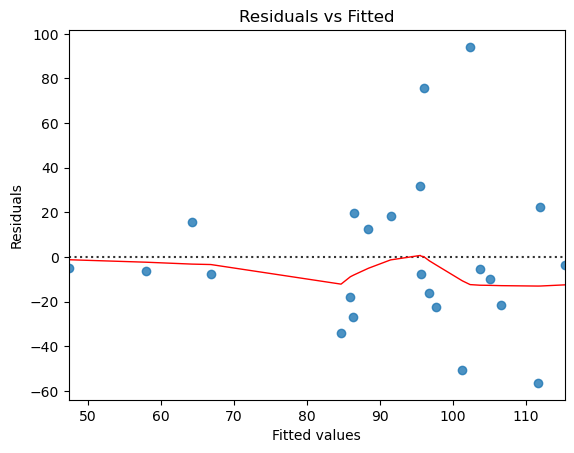

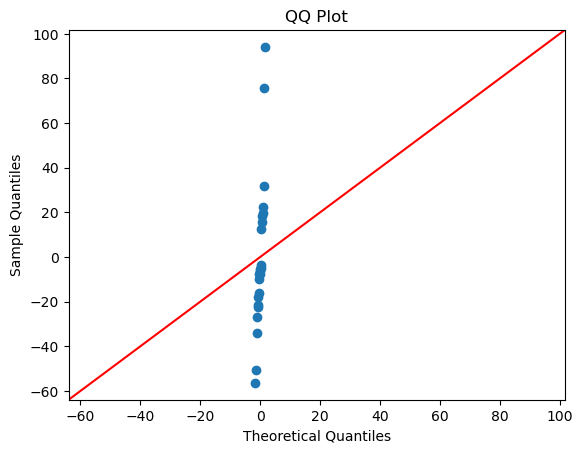

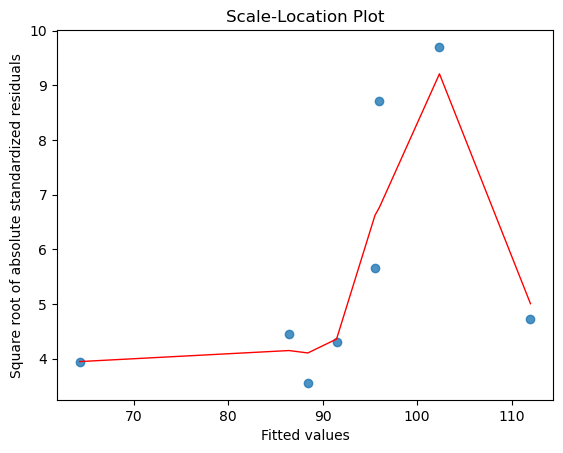

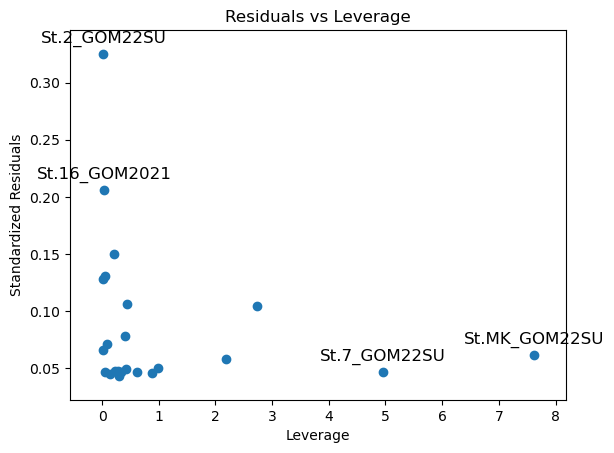

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\4066780182.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['NPOC_pred'] = predicted


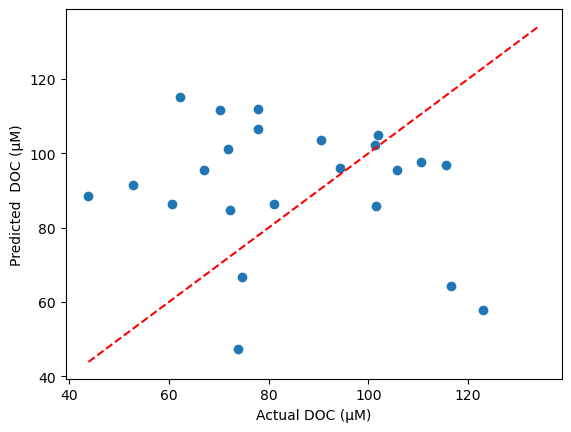

NPOC_uM = 116.9627 * Intercept + -4.6207 * pw_flux_doc 


In [68]:
# Define the formula for linear regression

formula = 'aou-ceq_doc_diff ~ pw_flux_doc'
df_OM = data_bbl_hsal[data_bbl_hsal['rgn'] != "Slope"]

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['NPOC_pred'] = predicted

# Plot
plt.scatter(df_OM['NPOC_uM'], predicted)
plt.xlabel(r'Actual DOC (µM)')
plt.ylabel('Predicted  DOC (µM)')
plt.title('')
plt.plot([df_OM['NPOC_uM'].min(), df_OM['NPOC_uM'].max()], 
         [df_OM['NPOC_uM'].min(), df_OM['NPOC_uM'].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()



# Print out the equation nicely
print("NPOC_uM =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()

### DOC excess here

                            OLS Regression Results                            
Dep. Variable:                NPOC_uM   R-squared:                       0.715
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                     385.4
Date:                Thu, 27 Jun 2024   Prob (F-statistic):           1.91e-84
Time:                        11:51:28   Log-Likelihood:                -1420.5
No. Observations:                 310   AIC:                             2847.
Df Residuals:                     307   BIC:                             2858.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    369.2896     11.341     32.563      0.0

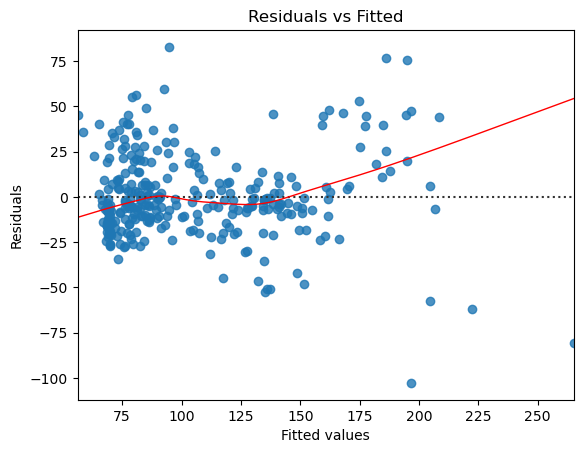

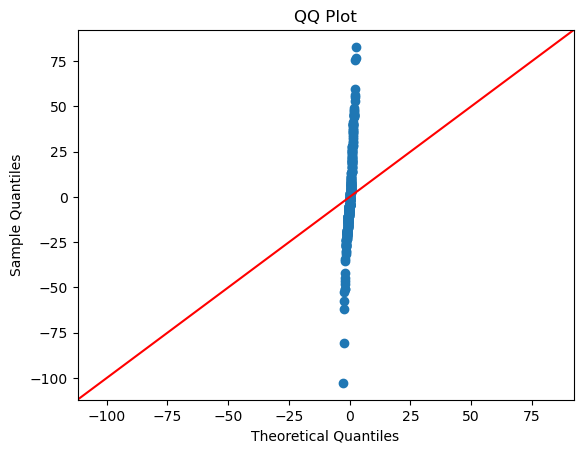

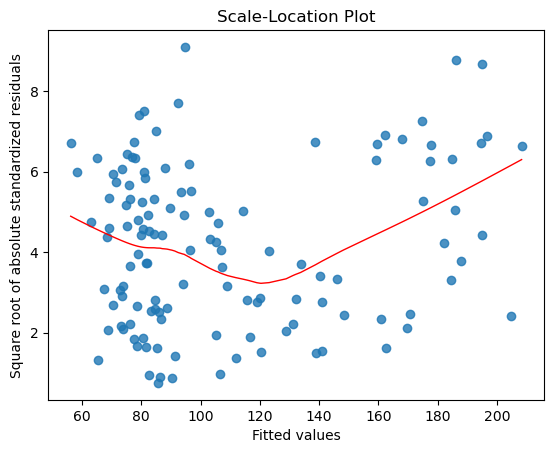

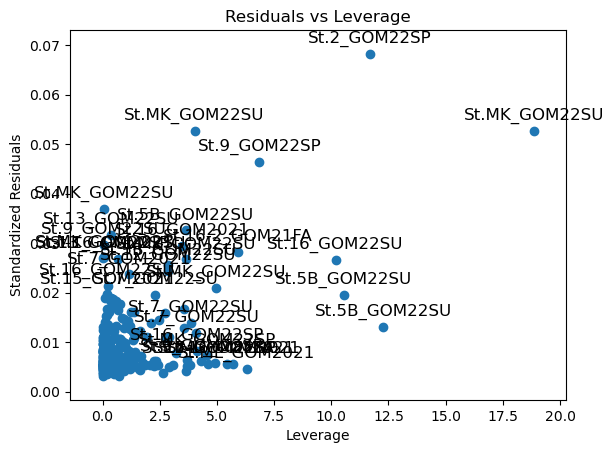

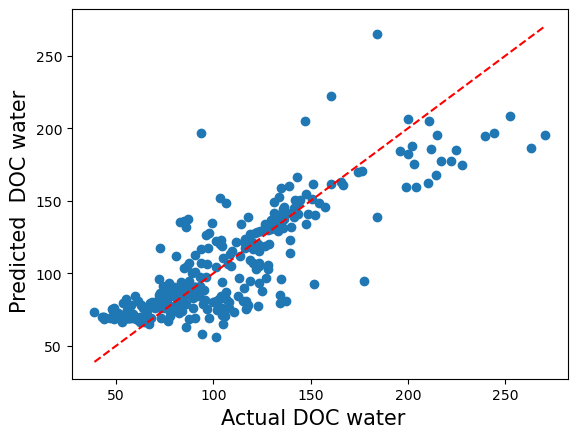

MSE: 564.8447470547259
RMSE: 23.766462653384618
NPOC_uM = 369.2896 * Intercept + -0.1633 * aou + -7.7965 * sal 


In [70]:
# Define the formula for linear regression

Val = 'NPOC_uM'

formula = 'NPOC_uM ~ aou+sal' 

#sal*aou*temp r2 = 0.663
#sal*aou*temp r2 = 0.712

data_wc_all_no_slope = data_wc_all[data_wc_all['rgn'] != 'Slope']
data_wc_all_slope = data_wc_all[data_wc_all['rgn'] == 'Slope']

data_wc_all_no_slope_sum22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SU']
data_wc_all_no_slope_sum21 = data_wc_all[data_wc_all['Campaign'] == 'GOM2021']
data_wc_all_no_slope_spr22 = data_wc_all[data_wc_all['Campaign'] == 'GOM22SP']
data_wc_all_no_slope_fal21 = data_wc_all[data_wc_all['Campaign'] == 'GOM21FA']

data_wc_no_bbl = data_wc_all[data_wc_all['group'] != 'BBL']
data_wc_no_bbl_high_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] > 35] 
data_wc_no_bbl_low_sal = data_wc_no_bbl[data_wc_no_bbl['sal'] < 35] 

data_wc_all['max_depth'] = data_wc_all.groupby('code.1')['Depth'].transform('max')
data_wc_all['depth_from_bottom'] = data_wc_all['max_depth'] - data_wc_all['Depth']


df_OM = data_wc_all

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual DOC water  ', size = 15)
plt.ylabel('Predicted  DOC water  ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Extracting specific error metrics
mse = model.mse_resid  # Mean Squared Error
rmse = mse**0.5  # Root Mean Squared Error

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

# Print out the equation nicely
print("NPOC_uM =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\2922379833.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_hsal['aou-ceq_doc'] = data_wc_hsal['aou-ceq'] * (1-.57)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\2922379833.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_bbl_hsal['aou-ceq_doc'] = data_bbl_hsal['aou-ceq'] * (1-.57)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\2922379833.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

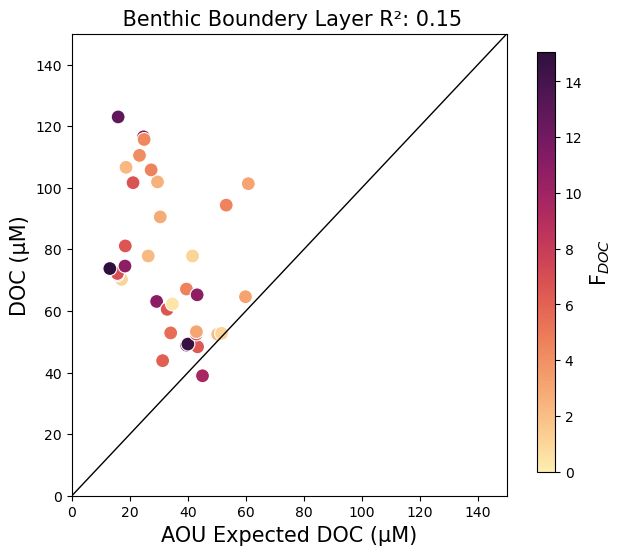

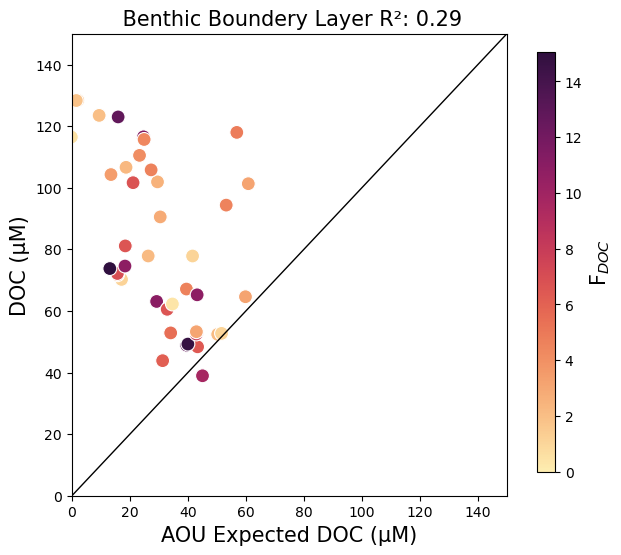

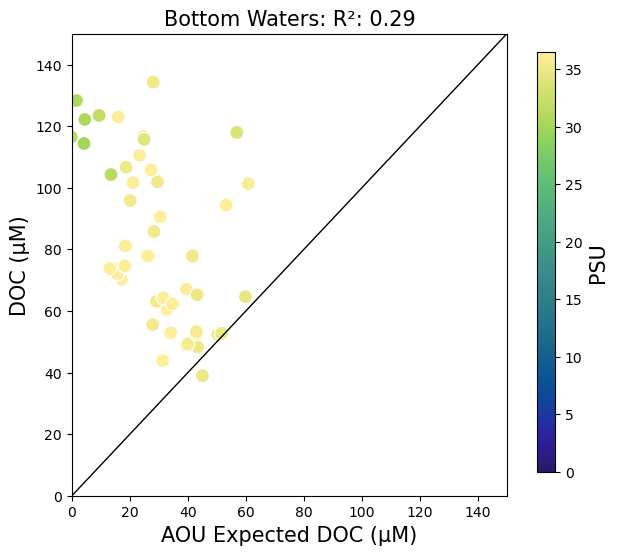

In [93]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    axes.set_xlim(0, 150)
    axes.set_ylim(0, 150)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( 0,0), (130,130), linewidth=1, color='black')

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


data_wc_hsal['rgn'].unique()

data_wc_hsal.columns

data_wc_hsal['aou-ceq_doc'] = data_wc_hsal['aou-ceq'] * (1-.57) 
data_bbl_hsal['aou-ceq_doc'] = data_bbl_hsal['aou-ceq'] * (1-.57) 
data_wc_bbl['aou-ceq_doc'] = data_wc_bbl['aou-ceq'] * (1-.57) 


data_wc_hsal['aou-ceq_doc_diff'] = data_wc_hsal['NPOC_uM']  - data_wc_hsal['aou-ceq_doc'] 
data_bbl_hsal['aou-ceq_doc_diff'] = data_bbl_hsal['NPOC_uM'] -  data_bbl_hsal['aou-ceq_doc'] 
data_wc_bbl['aou-ceq_doc_diff'] = data_wc_bbl['NPOC_uM'] -  data_wc_bbl['aou-ceq_doc'] 



x_var = 'aou-ceq_doc'
y_var = 'NPOC_uM'

x_var_lab = 'AOU Expected DOC (µM)'
y_var_lab = 'DOC (µM)'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " Benthic Boundery Layer "
save_name = 'aou_all_sal_bbl_doc'
xyplotcolor_flux_pred(data_bbl_hsal)


titel = " Benthic Boundery Layer "
save_name = 'aou_all_sal_bbl_doc'
xyplotcolor_flux_pred(data_wc_bbl)

z_var = 'sal'
z_var_lab = 'PSU'
z_var_color = cmo.haline

titel = "Bottom Waters: "
save_name = 'aou_all_sal_bbl_doc'
xyplotcolor_flux_pred(data_wc_bbl)




C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\1470013894.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_hsal['aou-ceq_doc'] = data_wc_hsal['aou-ceq'] * (1-.57)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\1470013894.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_bbl_hsal['aou-ceq_doc'] = data_bbl_hsal['aou-ceq'] * (1-.57)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_11100\1470013894.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

Intercept (TLS): 5.9514763679585965
Slope (TLS): 0.003299075021936406


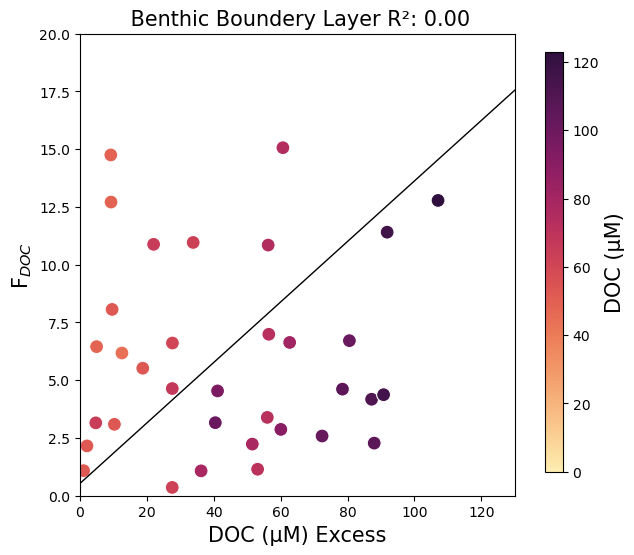

Intercept (TLS): 7.5105261348621974
Slope (TLS): -0.02559677621881768


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


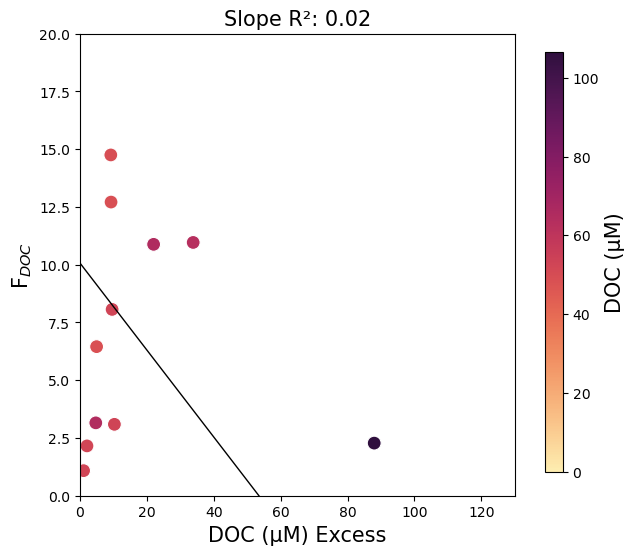

Intercept (TLS): 1.91999273755834
Slope (TLS): 0.06066278020589316


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


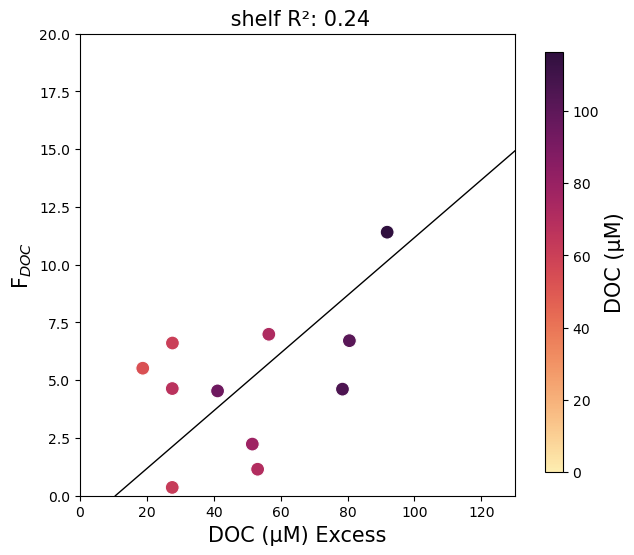

Intercept (TLS): 5.053018520303379
Slope (TLS): 0.04284076209549491


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


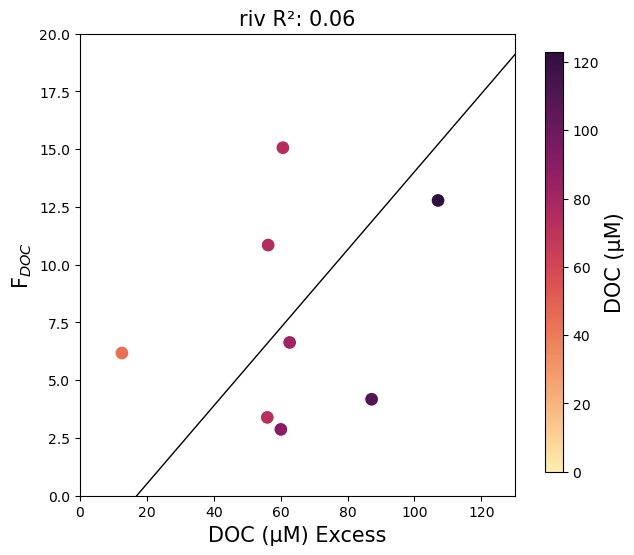

Intercept (TLS): 0.46507418592990035
Slope (TLS): 0.038927838153476085


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


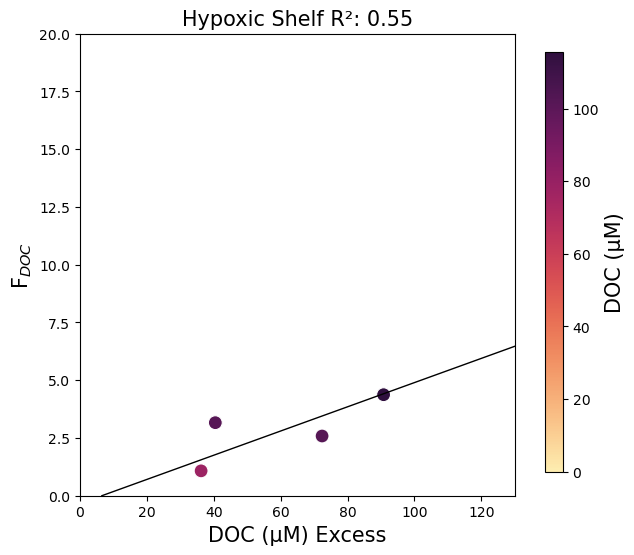

Intercept (TLS): 2.4316230808871357
Slope (TLS): 0.055503996414167034


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


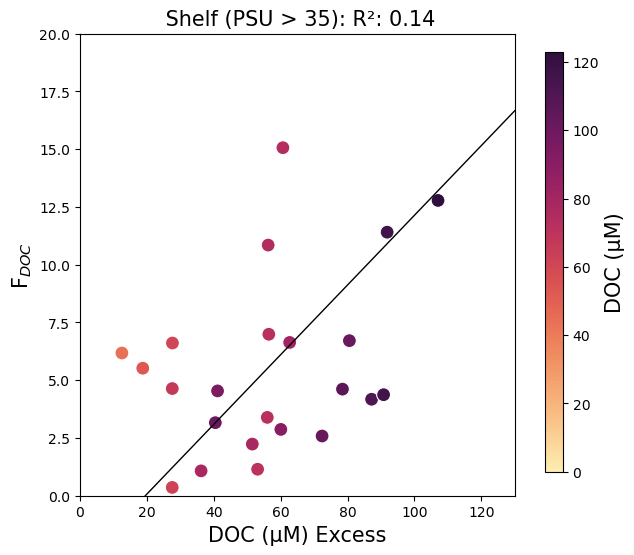

In [95]:
from pylr2 import regress2

def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 130)
    axes.set_ylim(0, 20)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


data_wc_hsal['rgn'].unique()

data_wc_hsal.columns

data_wc_hsal['aou-ceq_doc'] = data_wc_hsal['aou-ceq'] * (1-.57) 
data_bbl_hsal['aou-ceq_doc'] = data_bbl_hsal['aou-ceq'] * (1-.57) 

data_wc_hsal['aou-ceq_doc_diff'] = data_wc_hsal['NPOC_uM']  - data_wc_hsal['aou-ceq_doc'] 
data_bbl_hsal['aou-ceq_doc_diff'] = data_bbl_hsal['NPOC_uM'] -  data_bbl_hsal['aou-ceq_doc'] 


x_var = 'aou-ceq_doc_diff'
z_var = 'NPOC_uM'

x_var_lab = r'DOC (µM) Excess'
z_var_lab = 'DOC (µM)'

y_var = 'pw_flux_doc'
y_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " Benthic Boundery Layer "
save_name = 'aou_all_sal_bbl_doc'
xyplotcolor_flux_pred(data_bbl_hsal)

titel = "Slope "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred( data_bbl_hsal[data_bbl_hsal['rgn'] == "Slope"])

titel = " shelf "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_bbl_hsal[data_bbl_hsal['rgn'] == "Distal Shelf"])

titel = "riv "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_bbl_hsal[data_bbl_hsal['rgn'] == "Proximal Shelf"])


titel = "Hypoxic Shelf "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_bbl_hsal[data_bbl_hsal['rgn'] == "Hypoxic Shelf"])


titel = " Shelf (PSU > 35): "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred( data_bbl_hsal[data_bbl_hsal['rgn'] != "Slope"])

Intercept (TLS): 6.669604155108269
Slope (TLS): -0.021477416253865945


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


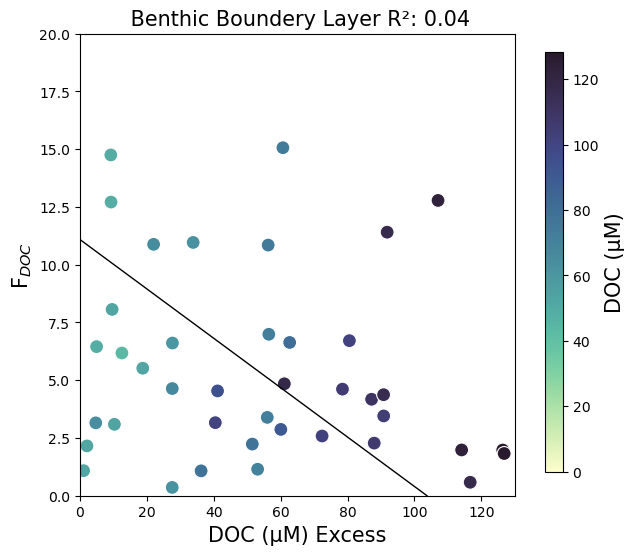

Intercept (TLS): 7.5105261348621974
Slope (TLS): -0.02559677621881768


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


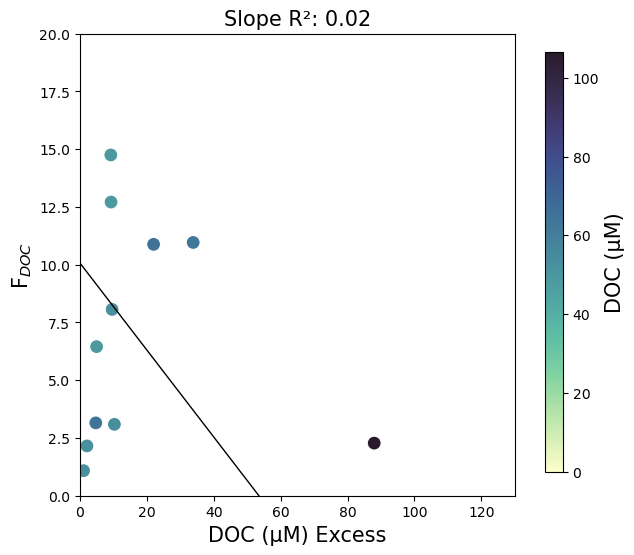

Intercept (TLS): 5.197117830261577
Slope (TLS): -0.004202864604306657


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


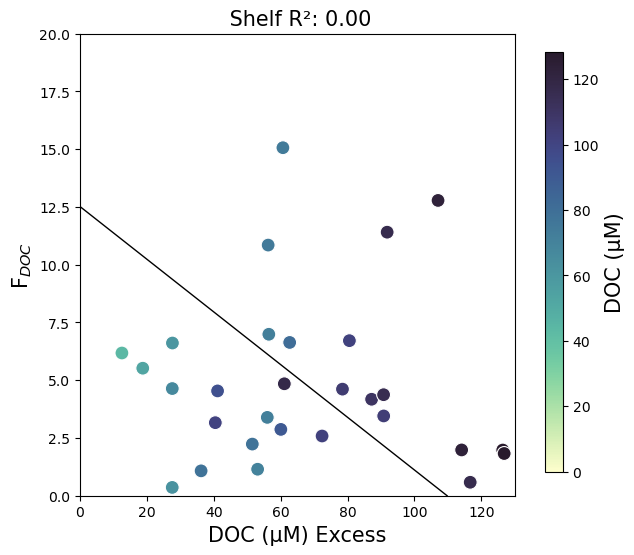

In [96]:

x_var = 'aou-ceq_doc_diff'
z_var = 'NPOC_uM'

x_var_lab = r'DOC (µM) Excess'
z_var_lab = 'DOC (µM)'

y_var = 'pw_flux_doc'
y_var_lab = 'F$_{DOC}$'
z_var_color = cmo.deep

titel = " Benthic Boundery Layer "
save_name = 'aou_all_sal_bbl_doc'
xyplotcolor_flux_pred(data_wc_bbl)

titel = "Slope "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['rgn'] == "Slope"])

titel = " Shelf "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred( data_wc_bbl[data_wc_bbl['rgn'] != "Slope"])

In [101]:
df.columns

Index(['camp', 'station', 'date', 'Max_pressure', 'Pressure_dbar_surface',
       'O2_mgL_surface', 'latitude_surface', 'longitude_surface',
       'Pressure_dbar_bottom', 'O2_mgL_bottom', 'latitude_bottom',
       'longitude_bottom', 'temp_surface', 'temp_bottom', 'sal_surface',
       'sal_bottom', 'O2_uM_surface', 'O2_uM_bottom', 'code.1', 'Slope',
       'Slope_pressure', 'Slope_pressure_percent', 'code.2', 'NPOC_uM',
       'TN_uM', 'Depth', 'NPOC_uM_std', 'TN_uM_std', 'NPOC_uM_surf', 'NPOC_ow',
       'aou-ceq_doc_diff'],
      dtype='object')

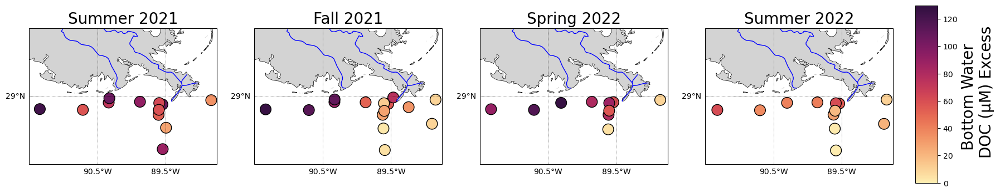

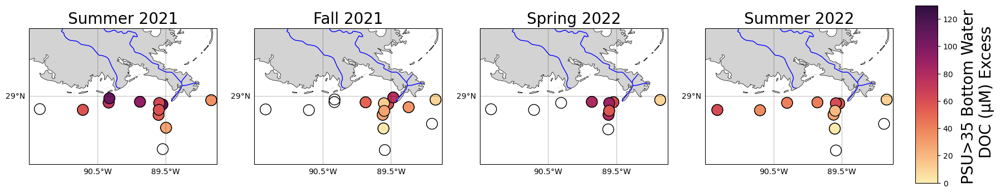

In [112]:
df['aou-ceq_doc_diff'] = data_wc_bbl['aou-ceq_doc_diff']


def map_doc_excess(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.matter,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=130,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()


data_f = df
topic = 'aou-ceq_doc_diff'
cb_name = 'Bottom Water \n DOC (µM) Excess'
map_doc_excess(data_f, topic, cb_name)


def map_doc_excess(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):

        sal_subset = data_f[data_f['camp'] == camp]
        mappable = axes[i].scatter(sal_subset['longitude_bottom'], sal_subset['latitude_bottom'],
                                   edgecolor='k',
                                   color="None",
                                   s=200,
                                   transform=ccrs.PlateCarree())
        
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.matter,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=130,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()

df['aou_ceq_doc_diff'] = df['aou-ceq_doc_diff'].where(df['sal_bottom'] >= 33, np.nan)

data_f = df
topic = 'aou_ceq_doc_diff'
cb_name = 'PSU>35 Bottom Water \n DOC (µM) Excess'
map_doc_excess(data_f, topic, cb_name)

In [ ]:
def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var]]
    #colors = data[z_var].astype(float)

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    vmin = data2[z_var].min()
    vmax = data2[z_var].max()
    
    #sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = 'black', ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    


    
x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal)

titel = "BBL and Water Col all Sal "
save_name = 'aou_all_wc_and_bbl'
xyplotcolor_2data(data_wc, data_wc_bbl)


In [ ]:
def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var]]
    #colors = data[z_var].astype(float)

    X = data[[x_var]] 
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    vmin = data2[z_var].min()
    vmax = data2[z_var].max()
    
    #sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = 'black', ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    


x_var = 'aou-ceq_doc'
z_var = 'pw_flux_doc'

x_var_lab = 'DOC uM given AOU and DOC utilization prediction'
z_var_lab = 'F$_{DOC}$'

y_var = 'NPOC_uM'
y_var_lab = 'DOC (µM)'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal)


In [65]:
import numpy as np

def tls_regression(x, y):
    # Add a column of ones to x to represent the intercept
    X = np.column_stack((np.ones(len(x)), x))

    # Compute the SVD of X
    U, s, Vt = np.linalg.svd(X, full_matrices=False)

    # Compute the pseudo-inverse of X
    X_inv = np.dot(Vt.T / s, U.T)

    # Compute the TLS regression coefficients
    beta_tls = np.dot(X_inv, y)

    return beta_tls

# Assuming you have your data x_var and y_var
x_var = data_wc_hsal['aou-ceq']
y_var = data_wc_hsal['NPOC_uM']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls
print("Intercept (TLS):", intercept_tls)
print("Slope (TLS):", slope_tls)

from pylr2 import regress2
results = regress2(x_var, y_var, _method_type_2="reduced major axis")

results

Intercept (TLS): 93.0129260875483
Slope (TLS): -0.3187706930311297


{'slope': -0.5789549566770666,
 'intercept': 103.40847359968495,
 'r': -0.5505967076622436,
 'std_slope': 0.046723821483449064,
 'std_intercept': 2.6233692637723576,
 'predict': code
 St.11_GOM2021     62.511033
 St.11_GOM2021     84.333525
 St.11_GOM2021    114.446504
 St.13_GOM2021     67.756233
 St.13_GOM2021    112.602026
                     ...    
 St.9_GOM22SU      60.519121
 St.9_GOM22SU     104.778597
 St.9_GOM22SU      84.409279
 St.9_GOM22SU     102.745242
 St.MK_GOM22SU     79.329669
 Name: aou-ceq, Length: 140, dtype: float64}

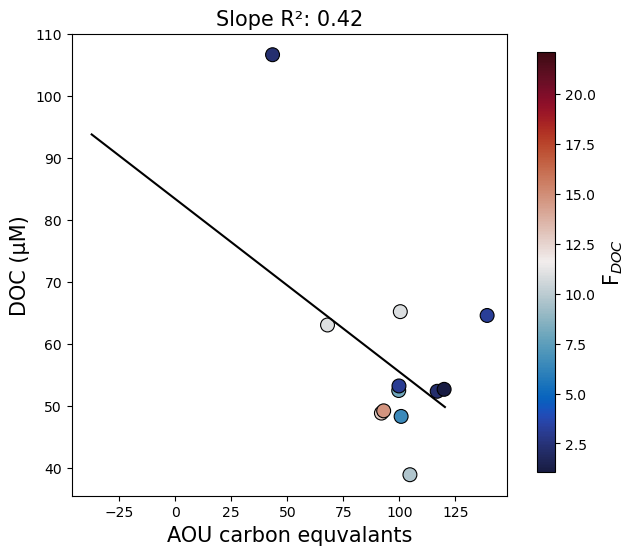

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\seaborn\utils.py:105: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin', 'vmax' will be ignored
  scout = method(scout_x, scout_y, **kws)


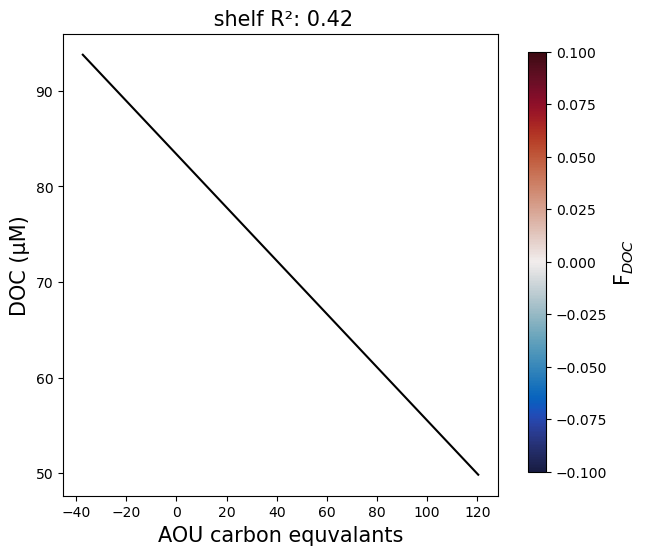

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\seaborn\utils.py:105: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin', 'vmax' will be ignored
  scout = method(scout_x, scout_y, **kws)


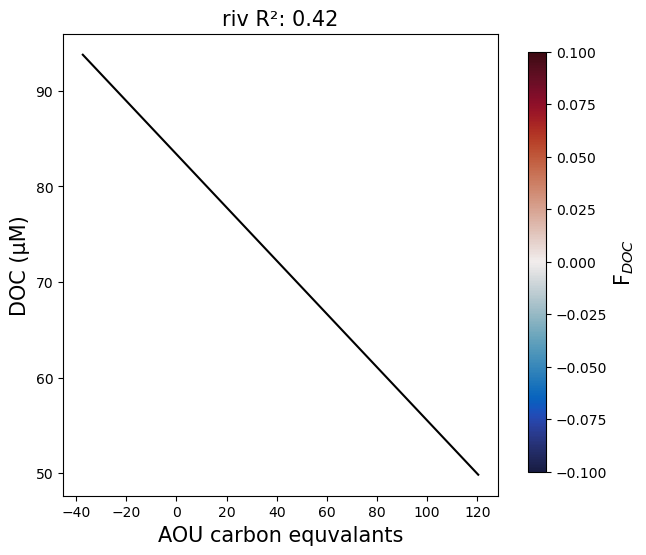

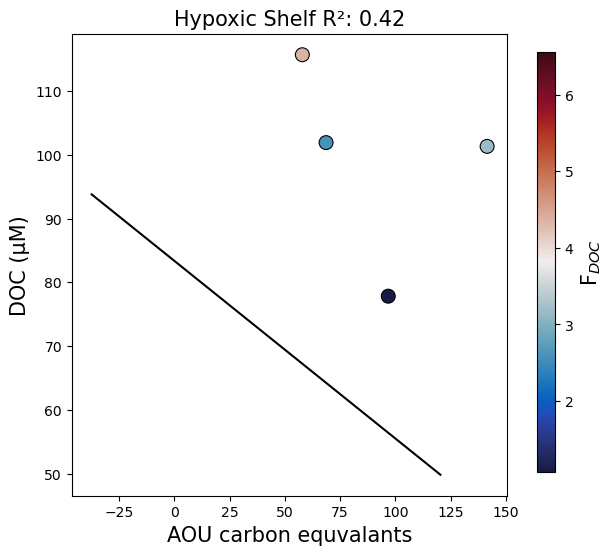

In [66]:

def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var]]
    #colors = data[z_var].astype(float)

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    vmin = df2[z_var].min()
    vmax = df2[z_var].max()*1.5
    
    #sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = 'black', ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


x_var = 'aou-ceq'
y_var = 'NPOC_uM'

x_var_lab = 'AOU carbon equvalants'
y_var_lab = 'DOC (µM)'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.balance

titel = "Slope "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal[data_wc_hsal['rgn'] == "Slope"], data_bbl_hsal[data_bbl_hsal['rgn'] == "Slope"])

titel = " shelf "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal[data_wc_hsal['rgn'] == "Slope"], data_bbl_hsal[data_bbl_hsal['rgn'] == "Shelf"])

titel = "riv "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal[data_wc_hsal['rgn'] == "Slope"], data_bbl_hsal[data_bbl_hsal['rgn'] == "River Delta"])


titel = "Hypoxic Shelf "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal[data_wc_hsal['rgn'] == "Slope"], data_bbl_hsal[data_bbl_hsal['rgn'] == "Hypoxic Shelf"])


titel = "BBL and Water Col Slope "
save_name = 'aou_all_wc_and_slope'
xyplotcolor_2data(data_wc, data_wc_bbl[data_wc_bbl['rgn'] == 'Slope'])

titel = "BBL and Water Col Shelf "
save_name = 'aou_all_wc_and_shelf'
xyplotcolor_2data(data_wc, data_wc_bbl[data_wc_bbl['rgn'] == 'Shelf'])

titel = "BBL and Water Col River Delta "
save_name = 'aou_all_wc_and_delta'
xyplotcolor_2data(data_wc, data_wc_bbl[data_wc_bbl['rgn'] == 'River Delta'])

titel = "BBL and Water Col Hypoxic Shelf "
save_name = 'aou_all_wc_and_hypox_shelf'
xyplotcolor_2data(data_wc, data_wc_bbl[data_wc_bbl['rgn'] == 'Hypoxic Shelf'])


In [ ]:
# Assuming you have your data x_var and y_var
x_var = data_wc_hsal['aou']
y_var = data_wc_hsal['NPOC_uM']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls
print("Intercept (TLS):", intercept_tls)
print("Slope (TLS):", slope_tls)


data_bbl_hsal['NPOC_pred_wc'] = (data_bbl_hsal['aou']*slope_tls) + intercept_tls
data_bbl_hsal['NPOC_off'] = data_bbl_hsal['NPOC_uM'] - data_bbl_hsal['NPOC_pred_wc']

data_bbl_hsal['NPOC_off']

In [ ]:


def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var]]
    #colors = data[z_var].astype(float)

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    vmin = data2[z_var].min()
    vmax = data2[z_var].max()
    
    #sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    edgecolor = np.where(data2[z_var] <= data2[z_var].mean(), '#F6B46A', '#6E1580')

    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = edgecolor, ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()



x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = " "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal)

x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = " "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_lsal, data_bbl_lsal)


x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = " "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc, data_wc_bbl)


x_var = 'aou-ceq'
y_var = 'NPOC_uM'

x_var_lab = 'AOU Carbon Equveletns'
y_var_lab = 'DOC (µM)'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'ratio_flux_2_stock'
z_var_color = cmo.matter

titel = " "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal)


In [ ]:

x_var = 'pw_flux_doc'
y_var = 'Cox'

x_var_lab = 'pw_flux_doc'
y_var_lab = 'Cox'

z_var = 'aou'
z_var_lab = 'aou'
z_var_color = cmo.matter

titel = " "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal)

data_bbl_hsal.columns


In [ ]:
list_stn = ['St.11', 'St.13', 'St.14', 'St.15' ,'St.16', 'St.2', 'St.7', 'St.9',  'St.12', 'St.14.5', 'St.16-2']
#list_stn = ['St.6', 'St.4', 'St.MK', 'St.5B']
data_wc_sub = data_wc[data_wc['Location'].isin(list_stn)]
data_wc_bbl_sub = data_wc_bbl[data_wc_bbl['Location'].isin(list_stn)]


x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = " "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_sub, data_wc_bbl_sub)

In [ ]:
data_wc_bbl.columns


In [ ]:
# Define the formula for linear regression

Val = 'pw_flux_doc'

formula = 'pw_flux_doc ~ doc_mol_per_m3_0_to_5cm + NPOC_uM * aou ' 
#percent_doc_resp ' #r=0.683 all ponits significant 
#NPOC_uM ' #r=0.707 CI 95 did not work 
#aou ' #r=0.619

list_stn = ['St.11', 'St.13', 'St.14', 'St.15' ,'St.16', 'St.2', 'St.7', 'St.9',  'St.12']
#list_stn = ['St.6', 'St.4', 'St.MK', 'St.5B']
data_wc_bbl_sub = data_wc_bbl[data_wc_bbl['Location'].isin(list_stn)]

df_OM = data_bbl_hsal

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual F$_{DOC}$ ', size = 15)
plt.ylabel('Predicted  F$_{DOC}$  ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("pw_flux_doc =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()


In [ ]:
import statsmodels.api as sm
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define the formula for linear regression
Val = 'pw_flux_doc'
formula = 'pw_flux_doc ~ doc_mol_per_m3_0_to_5cm + NPOC_uM' 

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Make predictions
predicted = model.predict(df_OM)

# Calculate residuals
residuals = df_OM[Val] - predicted

# Calculate effect sizes (Cohen's d)
def cohen_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx - 1) * np.var(x) + (ny - 1) * np.var(y)) / dof)

# Calculate effect size for each predictor variable
for var in model.params.index[1:]:
    effect_size = cohen_d(df_OM[var], predicted)
    print(f"Effect size (Cohen's d) for {var}: {effect_size}")


In [ ]:
# Calculate correlation between predictors and response
corr_doc = df_OM['doc_mol_per_m3_0_to_5cm'].corr(df_OM['pw_flux_doc'])
corr_percent = df_OM['NPOC_uM'].corr(df_OM['pw_flux_doc'])
df_OM['aou_doc_inter'] = df_OM['aou']*df_OM['NPOC_uM']
corr_aou = df_OM['aou'].corr(df_OM['pw_flux_doc'])
corr_inter = df_OM['aou_doc_inter'].corr(df_OM['pw_flux_doc'])


# Calculate proportion of variability explained
prop_var_explained_doc = corr_doc ** 2
prop_var_explained_percent = corr_percent ** 2
prop_var_explained_aou = corr_aou ** 2
prop_var_explained_inter = corr_inter ** 2


print("Proportion of variability in pw_flux_doc explained by doc_mol_per_m3_0_to_5cm:", prop_var_explained_doc * 100)
print("Proportion of variability in pw_flux_doc explained by NPOC_uM:", prop_var_explained_percent * 100)
print("Proportion of variability in pw_flux_doc explained by AOU:", prop_var_explained_aou * 100)
print("Proportion of variability in pw_flux_doc explained by interactive:", prop_var_explained_inter * 100)



print("")

# Calculate squared semi-partial correlation coefficient for doc_mol_per_m3_0_to_5cm
semipartial_corr_doc = model.pvalues['doc_mol_per_m3_0_to_5cm'] / (model.pvalues['doc_mol_per_m3_0_to_5cm'] + model.resid.std() ** 2)

# Calculate squared semi-partial correlation coefficient for percent_doc_resp
semipartial_corr_percent = model.pvalues['NPOC_uM'] / (model.pvalues['NPOC_uM'] + model.resid.std() ** 2)

print("Squared semi-partial correlation coefficient for doc_mol_per_m3_0_to_5cm:", semipartial_corr_doc)
print("Squared semi-partial correlation coefficient for NPOC_uM:", semipartial_corr_percent)


In [ ]:
STOP HERE FOR CTD PROFILES

### PART 1 CTD PROFILES ####

In [ ]:
#get ctd files 
files = glob.glob('../Dissertation_projects/Data/CTD/DOWNCAST_RENAME/*.csv') 

#make vars 
stations = ['St.11', 'St.12', 'St.13', 'St.14-2', 'St.14', 'St.16-2',
            'St.16', 'St.2', 'St.4', 'St.6', 'St.7',
            'St.9', 'St.MK-2', 'St.MK', 'St.15', 'St.5B']
camps = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

select = camps[0] #0 to 2
selectstn = stations[0] #0 to 15

#pick out the vars you need
df1 = pd.read_csv(files[0])
cols_to_select = df1.columns.tolist()

#make the data frame 

frames = []

for f in files: 
    df = pd.read_csv(f)
    
    ID = f.split("\\")[1]
    ID = ID[:-4].split("_")
    
    camp = ID[1]
    station = ID[2]
    sample_id = ID[3]
    date = ID[4]
    
    maxd = df['Pressure [dbar]'].max()
    lat = df['latitude'].mean()
    lon = df['longitude'].mean()
    
    df_new = df.loc[:, cols_to_select]
    
    df_new['camp'] = camp
    df_new['station'] = station
    df_new['sample_id'] = sample_id
    df_new['date'] = date
    df_new['maxd'] = maxd
    df_new['lat'] = lat
    df_new['lon'] = lon
    
    frames.append(df_new)
    
ds = pd.concat(frames, axis=0)

ds['date_time'] = pd.to_datetime(ds['date'])
ds['dates'] = ds['date_time'].dt.date


ds_copy = ds['wetCDOM'].copy()
ds_copy.loc[ds_copy < -1] = np.nan
ds_copy.loc[ds_copy > 125] = np.nan
ds = pd.merge(ds, ds_copy, left_index=True, right_index=True, how='outer')
ds = ds.rename(columns={'wetCDOM_x': 'wetCDOM', 'wetCDOM_y': 'wetCDOM_clean'})

# get the unique values for each group
station_vals = ds['station'].unique()
camp_vals = ds['camp'].unique()

ds['ox_uM'] = ds['sbeox0Mg/L'] / 1000 * 32 * 1000 


ds['Ts'] = (298.15 - ds['t090C']) / (273.15 + ds['t090C'])
ds['Ts'] = np.log(ds['Ts'] ) 


ds['density_kg_m3'] = seawater.dens(ds['sal00'], ds['t090C'], ds['Pressure [dbar]'])  # density at specified pressure (in kg/m^3)
ds['density_kg_l'] = ds['density_kg_m3'] / 1000

ds['ox_umol_kg'] = ds['ox_uM'] / ds['density_kg_l']

con1 = 5.80871
con2 = 3.20291
con3 = 4.17887 
con4 = 5.10006 
con5 = 9.86643e-2
con6 = 3.80369 

cof1 = -7.01577e-3
cof2 = -7.70028e-3
cof3 = -1.13864e-2
cof4 = -9.51519e-3
cof5 = -2.75915e-7

ds['sal'] = ds['sal00']

#as per book 
ds['ox_sat'] = con1+ds['Ts']*con2+(ds['Ts']**2)*con3+(ds['Ts']**3)*con4+(ds['Ts']**4)*con5+(ds['Ts']**5)*con6
ds['ox_sat'] = ds['ox_sat'] + ds['sal']*(cof1 + cof2*ds['Ts'] + cof3*ds['Ts']**2 + cof4*ds['Ts']**3 + cof5*ds['sal']**2)
ds['ox_sat'] = np.exp(ds['ox_sat'])

ds['aou'] = ds['ox_sat'] - ds['ox_umol_kg'] 

In [ ]:
df_doc = pd.read_csv('../Dissertation_projects/Data/TOC/TOC_GOM.csv', sep=',', index_col=0)

#make all BDL a 0 
df_doc.loc[df_doc['NPOC_uM'] == 'BLD', 'NPOC_uM'] = 0
df_doc.loc[df_doc['TN_uM'] == 'BLD', 'TN_uM'] = 0

df_doc.loc[df_doc['NPOC_uM'] < 0, 'NPOC_uM'] = 0
df_doc.loc[df_doc['TN_uM'] < 0, 'TN_uM'] = 0

#fix date time 
df_doc['date_time'] = pd.to_datetime(df_doc['Date'])
df_doc['Date'] = df_doc['date_time'].dt.date

df_doc['NPOC_uM'] = pd.to_numeric(df_doc['NPOC_uM'], errors='coerce')
df_doc['NPOC_uM'] = df_doc['NPOC_uM'].where(pd.notna(df_doc['NPOC_uM']), other=np.nan)

df_doc['TN_uM'] = pd.to_numeric(df_doc['TN_uM'], errors='coerce')
df_doc['TN_uM'] = df_doc['TN_uM'].where(pd.notna(df_doc['TN_uM']), other=np.nan)

df_doc['Time'] = pd.to_numeric(df_doc['Time'], errors='coerce')
df_doc['Time'] = df_doc['Time'].where(pd.notna(df_doc['Time']), other=np.nan)

df_doc['code'] = df_doc['Location'] + '_' + df_doc['Campaign']

df_doc = df_doc.drop(222101, axis=0)
df_doc = df_doc.drop(212211, axis=0)


###################################################

#get WC data sets 
df_doc_wc = df_doc[df_doc['Type'] == 'WC']

codes = df_doc_wc['code'].unique()

df_doc_wc_plot = df_doc_wc[df_doc_wc['code'].isin(codes)]

max_depth_per_code = df_doc_wc_plot.groupby('code')['Depth'].max().reset_index()
df_doc_wc_plot = pd.merge(df_doc_wc_plot, max_depth_per_code, on='code', suffixes=('', '_max'))
df_doc_wc_plot = df_doc_wc_plot[df_doc_wc_plot['Depth'] == df_doc_wc_plot['Depth_max']]
df_doc_wc_plot.drop(columns=['Depth_max'], inplace=True)



#mean_doc = df_doc_wc_plot.groupby('code')['NPOC_uM'].mean().reset_index()
#mean_tn = df_doc_wc_plot.groupby('code')['TN_uM'].mean().reset_index()
#std_doc = df_doc_wc_plot.groupby('code')['NPOC_uM_std'].mesuan().reset_index()
#stc_tn = df_doc_wc_plot.groupby('code')['NPOC_uM_std'].mean().reset_index()

df_doc_wc_plot['Depth_sample'] = df_doc_wc_plot['Depth']
df_doc_wc_plot['Depth'] = -0.5

# Calculate the mean of "NPOC_uM", "TN_uM", and "Depth" for each group in 'code'
df_doc_wc_plot = df_doc_wc_plot.groupby('code').agg({'NPOC_uM': 'mean', 'TN_uM': 'mean', 'Depth': 'mean', 'NPOC_uM_std': 'sum', 'TN_uM_std': 'sum'}).reset_index()


# Display the result dataframe
df_doc_wc_plot.index = df_doc_wc_plot['code']
df_doc_wc_plot

In [ ]:
stations = ['St.MK', 'St.MK-2', 'St.ML','St.14', 'St.14.5', 'St.16', 'St.16-2']
trips = ['GOM2021','GOM21FA']

# Setup colormap and CDOM Spectra
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*2, len(trips)*7))

# Determine the maximum depth for consistent plotting

txt_s = 15

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        ax = axes[i, j]
        subset_df = df_doc_wc[(df_doc_wc['Campaign'] == trip) & (df_doc_wc['Location'] == station)]
        subset_df = subset_df.sort_values(by=['Depth'])
        subset_df_avg = subset_df.groupby('Depth')['NPOC_uM'].mean().reset_index()
        subset_df_sem = subset_df.groupby('Depth')['NPOC_uM'].sem().reset_index()
        subset_df_err = subset_df.groupby('Depth')['NPOC_uM_std'].mean().reset_index()

        
        subset_ds = ds[(ds['camp'] == trip) & (ds['station'] == station)]
        subset_ds = subset_ds.sort_values(by=['Pressure [dbar]'])

        if not subset_df.empty:
            # Variables
            doc_uM = np.asarray(subset_df_avg['NPOC_uM'], dtype=float).ravel()
            doc_err_1 = np.asarray(subset_df_err['NPOC_uM_std'], dtype=float).ravel()
            doc_err_2 = np.asarray(subset_df_sem['NPOC_uM'], dtype=float).ravel()
            doc_err_2 = np.nan_to_num(doc_err_2, nan=0)
            doc_err = doc_err_2 + doc_err_1
            doc_depth = np.asarray(subset_df_avg['Depth'], dtype=float).ravel()
            
            date_txt = pd.to_datetime(subset_df['Date']).iloc[0].strftime('%Y-%m-%d')
            
            o2 = np.asarray(subset_ds['sbeox0Mg/L'], dtype=float).ravel()
            aou = np.asarray(subset_ds['aou'], dtype=float).ravel()
            o2_depth = np.asarray(subset_ds['Pressure [dbar]'], dtype=float).ravel()
            
            max_depth = subset_ds['Pressure [dbar]'].max()
            
            # PLOT DOC
            ax.plot(doc_uM, doc_depth, 'o', ls='-', c='black', markersize = 5)
            ax.errorbar(doc_uM, doc_depth, xerr=doc_err, color="black", linewidth = 2.5)
            ax.set_xlim(50, 220)
            ax.set_ylim(max_depth, 3)
            ax.set_ylabel('Depth (m)', size=txt_s, c='black')
            ax.set_xlabel('DOC (μM)', size=txt_s)
            
            # Plot O2
            ax2 = ax.twiny()
            ax2.plot(o2, o2_depth, ls='-', c='r')
            ax2.set_xlim(0, 9.5)
            
            ax2.set_xlabel('Oxygen mg/L', size=txt_s, color = 'r')
            ax2.xaxis.set_ticks_position('bottom')
            ax2.xaxis.set_label_position('bottom')
            ax2.spines['bottom'].set_position(('outward', 50))
                
                
            # Plot AOU
            ax3 = ax.twiny()
            ax3.plot(aou, o2_depth, ls='-', c='b')
            ax3.set_xlim(-75, 125)
            
            ax3.set_xlabel('AOU', size=txt_s, color = 'b')
            ax3.xaxis.set_ticks_position('bottom')
            ax3.xaxis.set_label_position('bottom')
            ax3.spines['bottom'].set_position(('outward', 100))
            
            ax4 = ax.twiny()
            ax4.plot(doc_uM, doc_depth, 'o', ls='-', c='black', markersize = 5)
            ax4.errorbar(doc_uM, doc_depth, xerr=doc_err, color="black", linewidth = 2.5)
            ax4.set_xlim(50, 220)
            ax4.set_ylim(max_depth, 3)
            
            
            # Meta info for title
            water_depth = round(max_depth, 1)
            ax.set_title(f'{station} \n {water_depth} M \n {date_txt}', size=15)
        else:
            ax.axis('off')

        #ax.set_xlabel('DOC (μM)', size=txt_s, c='black')
        ax.xaxis.set_tick_params(labelsize=txt_s*.75)

fig.set_facecolor('w')
plt.tight_layout()
plt.show()

In [ ]:
stations = ['St.2', 'St.5B','St.7','St.9','St.14','St.11']
trips = ['GOM21FA', 'GOM22SP', 'GOM22SU']

# Setup colormap and CDOM Spectra
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*2, len(trips)*5))

# Determine the maximum depth for consistent plotting

txt_s = 15

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        ax = axes[i, j]
        subset_df = df_doc_wc[(df_doc_wc['Campaign'] == trip) & (df_doc_wc['Location'] == station)]
        subset_df = subset_df.sort_values(by=['Depth'])
        subset_df_avg = subset_df.groupby('Depth')['NPOC_uM'].mean().reset_index()

        
        subset_ds = ds[(ds['camp'] == trip) & (ds['station'] == station)]
        subset_ds = subset_ds.sort_values(by=['Pressure [dbar]'])

        if not subset_df.empty:
            # Variables
            doc_uM = np.asarray(subset_df_avg['NPOC_uM'], dtype=float).ravel()
            doc_depth = np.asarray(subset_df_avg['Depth'], dtype=float).ravel()
            
            date_txt = pd.to_datetime(subset_df['Date']).iloc[0].strftime('%Y-%m-%d')
            
            o2 = np.asarray(subset_ds['sbeox0Mg/L'], dtype=float).ravel()
            o2_depth = np.asarray(subset_ds['Pressure [dbar]'], dtype=float).ravel()
            
            max_depth = subset_ds['Pressure [dbar]'].max()
            
            # PLOT DOC
            ax.plot(doc_uM, doc_depth, 'o', ls='-', c='black')
            ax.set_xlim(0, df_doc_wc['NPOC_uM'].max())
            ax.set_ylim(max_depth, -1)
            ax.set_ylabel('Depth (m)', size=txt_s, c='black')
            if i == 2:
                ax.set_xlabel('DOC (μM)', size=txt_s)
            if i != 2:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
                ax.set_xticks([])
            
            # Plot O2
            ax2 = ax.twiny()
            ax2.plot(o2, o2_depth, ls='-', c='r')
            ax2.set_xlim(0, 9)
            if i == 2:
                ax2.set_xlabel('Oxygen mg/L', size=txt_s, color = 'r')
                ax2.xaxis.set_ticks_position('bottom')
                ax2.xaxis.set_label_position('bottom')
                ax2.spines['bottom'].set_position(('outward', 50))
                
            # Turn off other axis
            if i != 2:
                ax2.set_xlabel('')
                ax2.xaxis.set_ticklabels([])
                ax2.set_xticks([])
                

            # Meta info for title
            water_depth = round(max_depth, 1)
            ax.set_title(f'{station} \n {water_depth} M \n {date_txt}', size=15)
        else:
            ax.axis('off')

        #ax.set_xlabel('DOC (μM)', size=txt_s, c='black')
        ax.xaxis.set_tick_params(labelsize=txt_s*.75)

fig.set_facecolor('w')
plt.tight_layout()
plt.show()

In [ ]:
stations = ['St.2', 'St.5B','St.7','St.9','St.14','St.11']
trips = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

# Setup colormap and CDOM Spectra
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*2, len(trips)*5))

# Determine the maximum depth for consistent plotting

txt_s = 15

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        ax = axes[i, j]
        subset_df = df_doc_wc[(df_doc_wc['Campaign'] == trip) & (df_doc_wc['Location'] == station)]
        subset_df = subset_df.sort_values(by=['Depth'])
        subset_df_avg = subset_df.groupby('Depth')['NPOC_uM'].mean().reset_index()

        
        subset_ds = ds[(ds['camp'] == trip) & (ds['station'] == station)]
        subset_ds = subset_ds.sort_values(by=['Pressure [dbar]'])

        if not subset_df.empty:
            # Variables
            doc_uM = np.asarray(subset_df_avg['NPOC_uM'], dtype=float).ravel()
            doc_depth = np.asarray(subset_df_avg['Depth'], dtype=float).ravel()
            
            date_txt = pd.to_datetime(subset_df['Date']).iloc[0].strftime('%Y-%m-%d')
            
            o2 = np.asarray(subset_ds['sbeox0Mg/L'], dtype=float).ravel()
            o2_depth = np.asarray(subset_ds['Pressure [dbar]'], dtype=float).ravel()
            
            sal = np.asarray(subset_ds['sal00'], dtype=float).ravel()
            temp = np.asarray(subset_ds['t068C'], dtype=float).ravel()            
            
            max_depth = subset_ds['Pressure [dbar]'].max()
            
            # PLOT DOC
            ax.plot(doc_uM, doc_depth, 'o', ls='-', c='black')
            ax.set_xlim(0, 210)
            ax.set_ylim(max_depth, -1)
            ax.set_ylabel('Depth (m)', size=txt_s, c='black')
            
            # Plot O2
            ax2 = ax.twiny()
            ax2.plot(o2, o2_depth, ls='-', c='r')
            ax2.set_xlim(0, 39)
            
            ax3 = ax.twiny()
            ax3.plot(sal, o2_depth, ls='-', c='black')
            ax3.set_xlim(10, 45)
            
            ax4 = ax.twiny()
            ax4.plot(temp, o2_depth, ls='-', c='b')
            ax4.set_xlim(10, 60)

            
            if i == 3:
                ax.set_xlabel('DOC (μM)', size=txt_s, color = 'black')
                ax.xaxis.set_ticks_position('bottom')
                ax.xaxis.set_label_position('bottom')
                
                ax2.set_xlabel('Oxogen mg/L', size=txt_s, color = 'r')
                ax2.xaxis.set_ticks_position('bottom')
                ax2.xaxis.set_label_position('bottom')
                ax2.spines['bottom'].set_position(('outward', 50))
                
                ax3.set_xlabel('Salinity PSU', size=txt_s, color = 'black')
                ax3.xaxis.set_ticks_position('bottom')
                ax3.xaxis.set_label_position('bottom')
                ax3.spines['bottom'].set_position(('outward', 100))
                
                ax4.set_xlabel('Temp °C', size=txt_s, color = 'b')
                ax4.xaxis.set_ticks_position('bottom')
                ax4.xaxis.set_label_position('bottom')
                ax4.spines['bottom'].set_position(('outward', 150))

                
                
            # Turn off other axis
            if i != 3:
                ax2.set_xlabel('')
                ax2.xaxis.set_ticklabels([])
                ax2.set_xticks([])
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
                ax.set_xticks([])
                ax3.set_xlabel('')
                ax3.xaxis.set_ticklabels([])
                ax3.set_xticks([])
                ax4.set_xlabel('')
                ax4.xaxis.set_ticklabels([])
                ax4.set_xticks([])
                

            # Meta info for title
            water_depth = round(max_depth, 1)
            ax.set_title(f'{station} \n {water_depth} M \n {date_txt}', size=15)
        else:
            ax.axis('off')

        ax.xaxis.set_tick_params(labelsize=txt_s*.75)

fig.set_facecolor('w')
plt.tight_layout()
plt.show()

In [ ]:
STOP ALL HERE IS JUNK

In [ ]:

x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = " "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc, data_wc_bbl)

In [ ]:
data_wc_hsal['code'] = data_wc_hsal['Location'] + '_' + data_wc_hsal['Campaign']
#data_wc_hsal.index = data_wc_hsal['code']
data_wc_hsal.columns

import pandas as pd

# Assuming data_wc_hsal is your DataFrame
# Group by 'code' and find the rows with maximum depth in each group
max_depths = data_wc_hsal.loc[data_wc_hsal.groupby('code')['Depth'].idxmax()]

# Now max_depths contains only the rows where 'Depth' is maximum within each group
# You can save it to a new DataFrame if needed
max_depths_df = pd.DataFrame(max_depths)



In [ ]:
# Print or use max_depths_df as needed
second_max_depths_df = max_depths_df

second_max_depths_df.index = second_max_depths_df['code']

join = second_max_depths_df['Depth']
data_bbl_hsal_plot['Depth_above'] = join

join = second_max_depths_df['NPOC_uM']
data_bbl_hsal_plot['NPOC_uM_above'] = join

join = second_max_depths_df['aou']
data_bbl_hsal_plot['aou_above'] = join

data_bbl_hsal_plot['delta_doc'] = (data_bbl_hsal_plot['NPOC_uM'] - data_bbl_hsal_plot['NPOC_uM_above']) / (data_bbl_hsal_plot['Depth'] - data_bbl_hsal_plot['Depth_above'])

data_bbl_hsal_plot['delta_aou'] = (data_bbl_hsal_plot['aou'] - data_bbl_hsal_plot['aou_above']) / (data_bbl_hsal_plot['Depth'] - data_bbl_hsal_plot['Depth_above'])

data_bbl_hsal_plot


In [ ]:
stop

In [ ]:
data_bbl_hsal_plot['fet_mol_per_m3_0_to_25cm'] #fet_mol_per_m3_0_to_5cm

In [ ]:

data_bbl_hsal_plot_highflux = data_bbl_hsal_plot[data_bbl_hsal_plot['ratio_flux_2_stock'] >= data_bbl_hsal_plot['ratio_flux_2_stock'].mean()]
data_bbl_hsal_plot_lowflux = data_bbl_hsal_plot[data_bbl_hsal_plot['ratio_flux_2_stock'] <= data_bbl_hsal_plot['ratio_flux_2_stock'].mean()]

In [ ]:
def xyplotcolor_flux3(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)
    
    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    vmin = data[z_var].min()
    vmax = data[z_var].max()

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
x_var = 'ratio_flux_2_stock'
y_var = 'NPOC_off'

x_var_lab = 'ratio_flux_2_stock'
y_var_lab = 'NPOC_off'

z_var = 'Depth'
z_var_lab = 'Depth'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'

titel = "BBL and Water Col High Sal "
xyplotcolor_flux3(data_bbl_hsal_plot)

titel = "BBL and Water Col High Sal Low Flux"
xyplotcolor_flux3(data_bbl_hsal_plot_lowflux)

titel = "BBL and Water Col High Sal High Flux"
xyplotcolor_flux3(data_bbl_hsal_plot_highflux)

In [ ]:
x_var = 'ratio_pw_flux_doc_2_cox'
y_var = 'fe2_mol_per_m3_0_to_5cm'

x_var_lab = 'ratio_pw_flux_doc_2_cox'
y_var_lab = 'fe2_mol_per_m3_0_to_5cm'

z_var = 'percent_doc_resp'
z_var_lab = 'percent_doc_resp'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux2(data_bbl_hsal_plot)

In [ ]:

    
x_var = 'percent_doc_resp'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'percent_doc_resp'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux2(data_bbl_hsal_plot)

In [ ]:

x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio_flux_2_stock'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.balance

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal_plot)


In [ ]:
data_bbl_hsal_plot.columns

In [ ]:
# Define the formula for linear regression

Val = 'pw_flux_doc'

formula = 'pw_flux_doc ~ doc_mol_per_m3_0_to_5cm + NPOC_uM' 
#percent_doc_resp ' #r=0.683 all ponits significant 
#NPOC_uM ' #r=0.707 CI 95 did not work 
#aou ' #r=0.619


df_OM = data_bbl_hsal_plot

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual F$_{DOC}$ ', size = 15)
plt.ylabel('Predicted  F$_{DOC}$  ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("pw_flux_doc =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()


In [ ]:
import statsmodels.api as sm
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define the formula for linear regression
Val = 'pw_flux_doc'
formula = 'pw_flux_doc ~ doc_mol_per_m3_0_to_5cm + NPOC_uM' 

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Make predictions
predicted = model.predict(df_OM)

# Calculate residuals
residuals = df_OM[Val] - predicted

# Calculate effect sizes (Cohen's d)
def cohen_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx - 1) * np.var(x) + (ny - 1) * np.var(y)) / dof)

# Calculate effect size for each predictor variable
for var in model.params.index[1:]:
    effect_size = cohen_d(df_OM[var], predicted)
    print(f"Effect size (Cohen's d) for {var}: {effect_size}")


In [ ]:
# Calculate correlation between predictors and response
corr_doc = df_OM['doc_mol_per_m3_0_to_5cm'].corr(df_OM['pw_flux_doc'])
corr_percent = df_OM['NPOC_uM'].corr(df_OM['pw_flux_doc'])

# Calculate proportion of variability explained
prop_var_explained_doc = corr_doc ** 2
prop_var_explained_percent = corr_percent ** 2

print("Proportion of variability in pw_flux_doc explained by doc_mol_per_m3_0_to_5cm:", prop_var_explained_doc)
print("Proportion of variability in pw_flux_doc explained by percent_doc_resp:", prop_var_explained_percent)

print("")

# Calculate squared semi-partial correlation coefficient for doc_mol_per_m3_0_to_5cm
semipartial_corr_doc = model.pvalues['doc_mol_per_m3_0_to_5cm'] / (model.pvalues['doc_mol_per_m3_0_to_5cm'] + model.resid.std() ** 2)

# Calculate squared semi-partial correlation coefficient for percent_doc_resp
semipartial_corr_percent = model.pvalues['percent_doc_resp'] / (model.pvalues['percent_doc_resp'] + model.resid.std() ** 2)

print("Squared semi-partial correlation coefficient for doc_mol_per_m3_0_to_5cm:", semipartial_corr_doc)
print("Squared semi-partial correlation coefficient for percent_doc_resp:", semipartial_corr_percent)


In [ ]:
STOP

In [ ]:
data_bottom_water

In [ ]:
delta_DOC_join = data_bottom_water['DOC_change_per_meter'] 
delta_O2_join = data_bottom_water['O2_change_per_meter'] 

data_bbl_hsal_plot['DOC_change_per_meter'] = delta_DOC_join
data_bbl_hsal_plot['O2_change_per_meter'] = delta_O2_join



x_var = 'aou'
y_var = 'ratio'

x_var_lab = 'AOU'
y_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'

z_var = 'DOC_change_per_meter'
z_var_lab = 'DOC_change_per_meter'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux2(data_bbl_hsal_plot)



x_var = 'aou'
y_var = 'ratio'

x_var_lab = 'AOU'
y_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'

z_var = 'O2_change_per_meter'
z_var_lab = 'O2_change_per_meter'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux2(data_bbl_hsal_plot)




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def tricolor_cmap(min_color, mid_color, max_color, min_value, max_value, mid_value):
    cmap = LinearSegmentedColormap.from_list('tricolor', [min_color, mid_color, max_color])
    norm = plt.Normalize(min_value, max_value)
    return cmap, norm

# Example values and colors
min_value = 0
mid_value = 75
max_value = 100
min_color = 'blue'
mid_color = 'green'
max_color = 'red'

# Create the custom colormap
cmap, norm = tricolor_cmap(min_color, mid_color, max_color, min_value, max_value, mid_value)

# Create a sample plot with the color bar
x = np.linspace(min_value, max_value, 100)
y = np.sin(x)

plt.scatter(x, y, c=x, cmap=cmap, norm=norm)
plt.colorbar(label='Color Bar')
plt.show()


In [ ]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid

def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero.

    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower offset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax / (vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highest point in the colormap's range.
          Defaults to 1.0 (no upper offset). Should be between
          `midpoint` and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    newcmap = matplotlib.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)

    return newcmap

#orig_cmap = cmo.balance
cmap_bal_shift = shiftedColorMap(orig_cmap, midpoint=0.59, name='cma_bal_shitsmk2')
#shrunk_cmap = shiftedColorMap(orig_cmap, start=0.15, midpoint=0.75, stop=0.85, name='shrunk')


def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var]]
    #colors = data[z_var].astype(float)

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    vmin = 5
    vmax = 35
    
    #sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = 'black', ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    

data_wc_hsal = data_wc[data_wc['sal'] >= 35]
data_wc_lsal = data_wc[data_wc['sal'] <= 35]

data_bbl_hsal = data_wc_bbl[data_wc_bbl['sal'] >= 35]
data_bbl_lsal = data_wc_bbl[data_wc_bbl['sal'] <= 35]


    
x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmap_bal_shift

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal_plot)



In [ ]:
data_bbl_hsal_plot['ratio']

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def tricolor_palette(min_color, mid_color, max_color, min_value, max_value, mid_value, n=256):
    lower_range = np.linspace(min_value, mid_value, n//2)
    upper_range = np.linspace(mid_value, max_value, n//2)
    palette = np.concatenate([
        sns.color_palette([min_color, mid_color], n_colors=n//2),
        sns.color_palette([mid_color, max_color], n_colors=n//2)
    ])
    values = np.concatenate([lower_range, upper_range])
    return palette, values

# Example values and colors
min_value = 0
mid_value = 25
max_value = 40
min_color = 'blue'
mid_color = 'green'
max_color = 'red'

# Call the tricolor_palette function to get the palette and values
palette, values = tricolor_palette(min_color, mid_color, max_color, min_value, max_value, mid_value)

def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var]]

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    vmin = 5
    vmax = 35
    
    # Use the custom palette and values
    sns.scatterplot(x=x_var, y=y_var, palette=palette, hue=z_var, data=data2, edgecolor='black', ax=axes, legend=False)
    
    # Plot regression line
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size=15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.show()

# Replace x_var, y_var, z_var, x_var_lab, y_var_lab, z_var_lab, and titel with your variables.

x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal_plot)

In [ ]:
ncs_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/NCS_stocks.csv', sep=',', index_col=0)
ncs_stocks_join = ncs_stocks['OCg_5cm_deep/M2']
data_bbl_hsal_plot['OCg_5cm_deep_m3'] = ncs_stocks_join

data_bbl_hsal_plot['ratio'] = data_bbl_hsal_plot['pw_flux_doc'] / data_bbl_hsal_plot['OCg_5cm_deep_m3']

x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'ratio'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal_plot)

ncs_stocks

In [ ]:
data_bbl_hsal_plot['fe2_mol_per_m3_0_to_5cm']

In [ ]:
def xyplotcolor_stocks(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

data_bbl_hsal_plot['ratio'] = data_bbl_hsal_plot['pw_flux_doc'] / data_bbl_hsal_plot['doc_mol_per_m3_0_to_5cm']


x_var = 'fe2_mol_per_m3_0_to_5cm'
y_var = 'NPOC_uM'

x_var_lab = 'fe2_mol_per_m3_0_to_5cm'
y_var_lab = 'DOC (µM)'

z_var = 'ratio'
z_var_lab = 'F$_{DOC}$ normalized to \n DOC (mol m$^{-3}$) in 0 to 5 cm'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_stocks(data_bbl_hsal_plot)

In [ ]:
data_bbl_hsal_plot['flux_z'] = (data_bbl_hsal_plot['pw_flux_doc'] - data_bbl_hsal_plot['pw_flux_doc'].mean() )/ data_bbl_hsal_plot['pw_flux_doc'].std()
data_bbl_hsal_plot['fe2_z'] = (data_bbl_hsal_plot['fe2_mol_per_m3_0_to_5cm'] - data_bbl_hsal_plot['fe2_mol_per_m3_0_to_5cm'].mean() )/ data_bbl_hsal_plot['fe2_mol_per_m3_0_to_5cm'].std()

    
x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'flux_z'
z_var_lab = 'flux_z'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal_plot)

z_var = 'fe2_z'
z_var_lab = 'fe2_z'
z_var_color = cmo.matter

titel = "BBL and Water Col High Sal "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_2data(data_wc_hsal, data_bbl_hsal_plot)


